# Data Mining Programming Assignment
# Task1 - Exploratory Data Analysis
### Group 9 - Nikola Vinko / Peter Hunyadi

We assume that you have the generated Gram matrices and sparse vectors in the directories

> kernels/node_labels

> kernels/without_labels

And have the HiSC repository in:
> ./HiSC

If not you can download them [here](https://ucloud.univie.ac.at/index.php/s/E3YKph0jkpbw8TN).
Repository: https://github.com/maxf-at/data_mining_group9.git

In [2]:
# Load packages
import os
import numpy as np
from auxiliarymethods import datasets as dp
from auxiliarymethods.reader import tud_to_networkx
import pandas as pd
from sklearn.decomposition import KernelPCA, TruncatedSVD, PCA
from matplotlib import pyplot as plt
from nrkmeans import NrKmeans
from sklearn.cluster import SpectralClustering, KMeans, AgglomerativeClustering
from sklearn.metrics import normalized_mutual_info_score, pairwise_distances
import seaborn as sns
from scipy.sparse import load_npz
import auxiliarymethods.auxiliary_methods as aux
import networkx as nx
from sklearn.cluster import KMeans
from copy import deepcopy
from sklearn.manifold import TSNE
import umap
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn import preprocessing, svm, metrics
from scipy.sparse import csc_matrix
from sklearn.cluster import OPTICS, cluster_optics_dbscan
import matplotlib.gridspec as gridspec
import sys
sys.path.append(r'./HiSC/data_mining_group9/intermediate submission/') #may
from HiSC import process_csv, HiSC, reachability_plot, get_clusters

In [4]:
# functions
def load_csv(path):
    return np.loadtxt(path, delimiter=";")

def load_sparse(path):
    return load_npz(path)

def select_from_list(l, indices):
    return [l[i] for i in indices]

def visualize(G, color=None, figsize=(5,5)):
    plt.figure(figsize=figsize)
    plt.xticks([])
    plt.yticks([])
    nx.draw_networkx(G, 
                     pos=nx.spring_layout(G, seed=42),
                     with_labels=True,
                     node_color=color,
                     cmap="Set2")
    plt.show();
    
def plot_dr(reduced_dim, title, labels):
    targets = [1, 2, 3,4, 5, 6]
    colors = ['r', 'g', 'b', 'y', 'orange', "purple"]
    
    
    fig, ax = plt.subplots(figsize=(10,10))
    for color, target in zip(colors, targets):
        ind_to_keep = []
        for i in range(0, len(reduced_dim)):
            if labels[i] ==target:
                ind_to_keep.append(i)
                
        x = reduced_dim[ind_to_keep, 0]
        y = reduced_dim[ind_to_keep, 1]
        ax.scatter(x, y, c=color, label=target, alpha = 0.8)
    ax.legend()
    plt.title(title)
    plt.show();

In [5]:
#main named variables
base_path = os.path.join("kernels", "node_labels")
dataset = "ENZYMES"
classes = dp.get_dataset(dataset)
G = tud_to_networkx(dataset)
print(f"Number of graphs in data set is {len(G)}")
print(f"Number of classes {len(set(classes.tolist()))}")

Number of graphs in data set is 600
Number of classes 6


## First look of the data: Dimensionality Reduction on raw data - WL kernel

Let's see how our data looks like when unprocessed

(600, 600) (600, 76881)


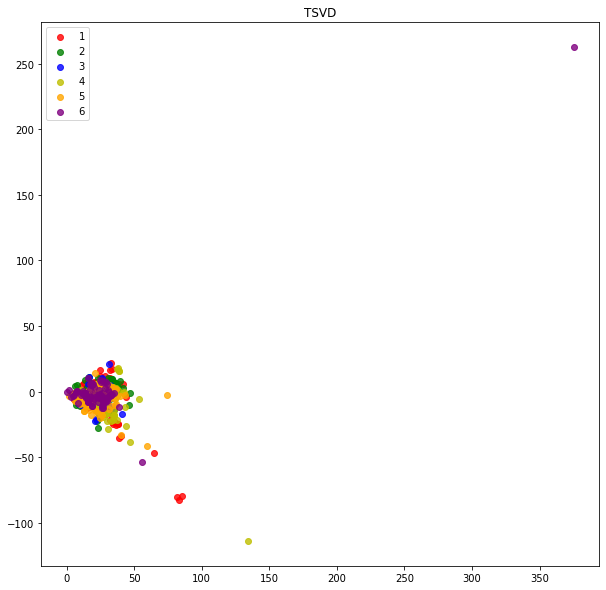

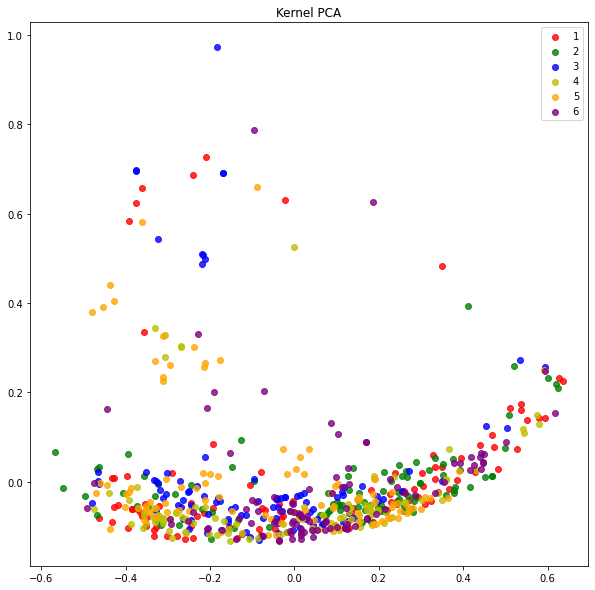

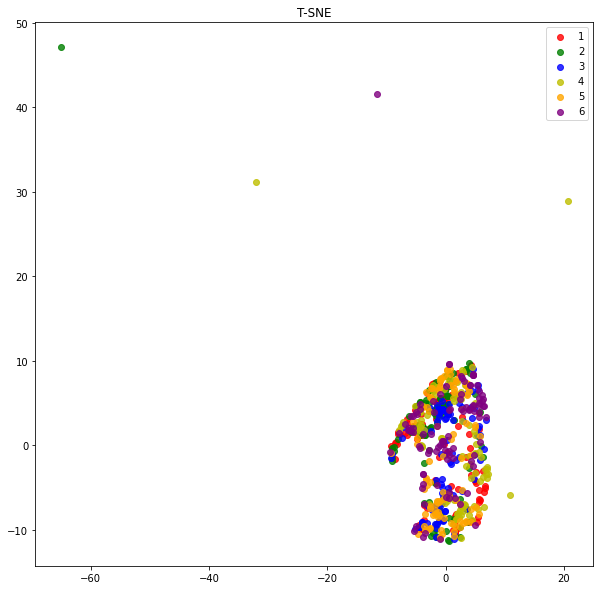

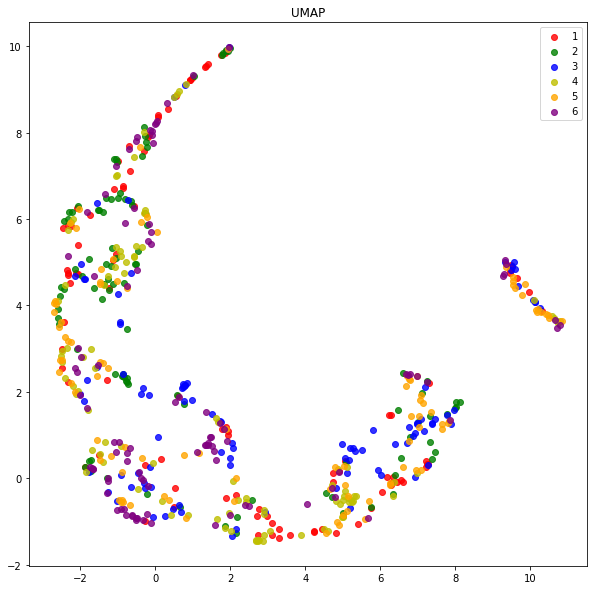

In [6]:
# triyng different iterations
dataset = "ENZYMES"
iterations = 5
base_path = os.path.join("kernels","node_labels")
#base_path = os.path.join("kernels","without_labels")

#--------------------------------------------
# Load graph representation from the kernel
#--------------------------------------------
#Gram Matrix for the Weisfeiler-Lehman subtree kernel
gram = load_csv(os.path.join(base_path,f"{dataset}_gram_matrix_wl{iterations}.csv"))
gram = aux.normalize_gram_matrix(gram)

#Sparse Vectors for the Weisfeiler-Lehmann subtree kernel
vec = load_sparse(os.path.join(base_path,f"{dataset}_vectors_wl{iterations}.npz"))
print(gram.shape, vec.shape)


# SVD
tsvd = TruncatedSVD(n_components=50)
reduced_tsvd = tsvd.fit_transform(vec)
plot_dr(reduced_tsvd, "TSVD", classes)

# Kernel PCA
kpca = KernelPCA(n_components=100, kernel="precomputed")
reduced_kpca= kpca.fit_transform(gram)
plot_dr(reduced_kpca, "Kernel PCA",classes)

# T-SNE
pca = TSNE(n_components=3)
reduced_tsne =  pca.fit_transform(gram)
plot_dr(reduced_tsne, "T-SNE",classes)

# UMAP
reducer = umap.UMAP()
scaled_gram = StandardScaler().fit_transform(gram)
embedding = reducer.fit_transform(scaled_gram)
plot_dr(embedding, "UMAP",classes)

We can notice some outliers that occur in several vector representations, especially in kPCA. Let's visualize them to see if we can notice some patterns

In [7]:
# lets investiage the outliers in kPCA
reduced_kpca_2d = pd.DataFrame(data = reduced_kpca[:, 0:2], columns = ["PC1", "PC2"])
index = reduced_kpca_2d.index
outliers = reduced_kpca_2d[(reduced_kpca_2d["PC2"] > 0.2) & (reduced_kpca_2d["PC1"] < 0.5) ]

print("Num of outliers: ", len(outliers.index))

Num of outliers:  45


## Visualizing the outliers

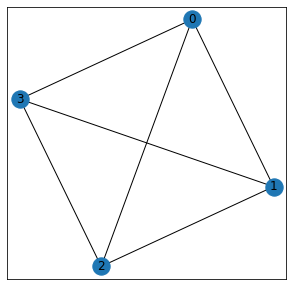

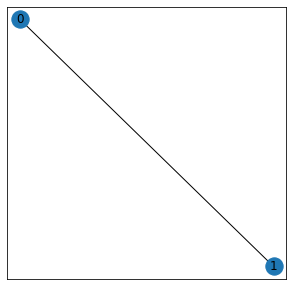

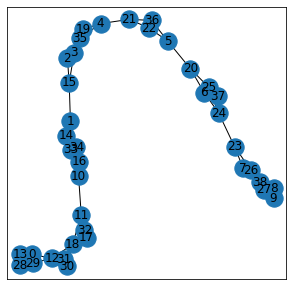

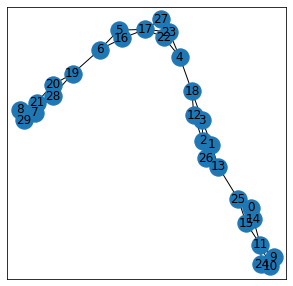

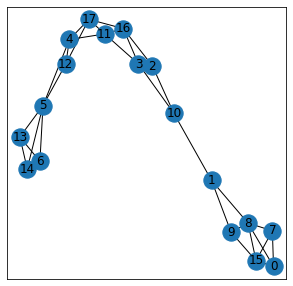

...

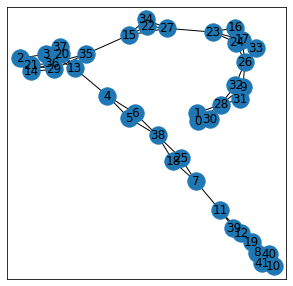

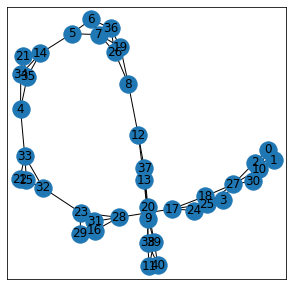

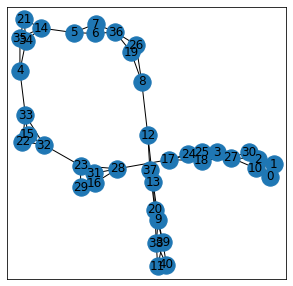

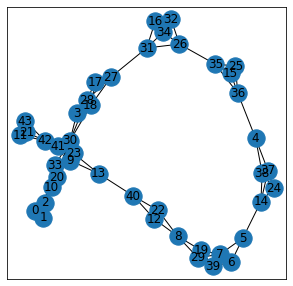

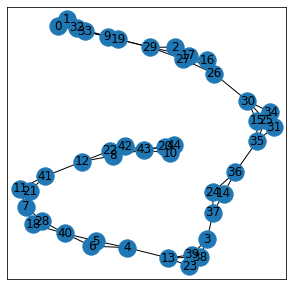

In [8]:
for outlier in outliers.index:
    visualize(G[outlier])

We can see that the outliers are associated with low/high number of nodes/edges.

## Exploring Dataset properties
### Node - Edge correlation

In [9]:
node_count = []
edge_count = []
for i in range(len(G)):
    node_count.append(len(G[i].nodes))
    edge_count.append(len(G[i].edges))
node_ser = pd.Series(node_count)
edge_ser = pd.Series(edge_count)
class_ser = pd.Series(classes)
df = pd.DataFrame({"class":class_ser,"nodes":node_ser,"edges":edge_ser})

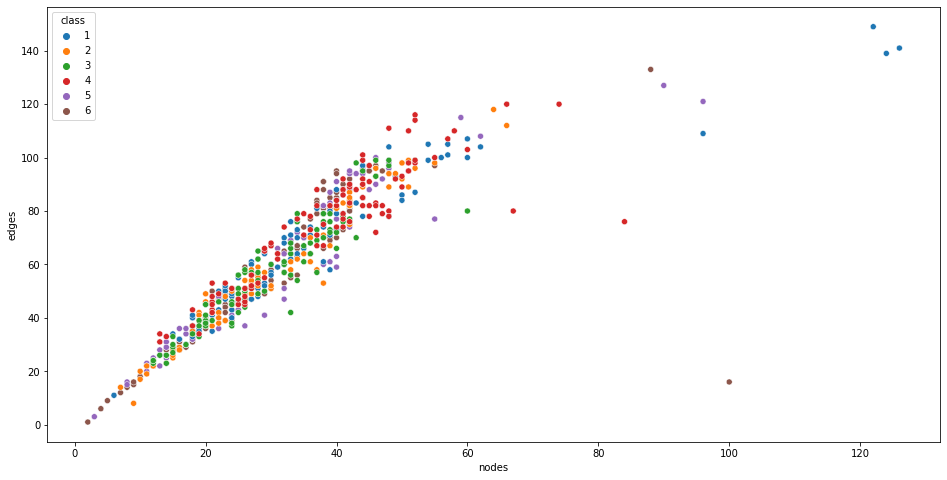

In [10]:
plt.subplots(figsize=(16,8))
sns.scatterplot(data=df, x="nodes", y="edges", hue="class", palette=("tab10"))

As expected, we can see that a strong linear correlation between the nodes and edges. Also we can notice that the in this vector representation the labels are more or less evently distributed. Which makes sense because the enzymes size, connectiveness is not a major factor that determines the EC of an enzyme.



Let's plot visualize the node and edge distribution of our dataset.

### Node/edge count distributions

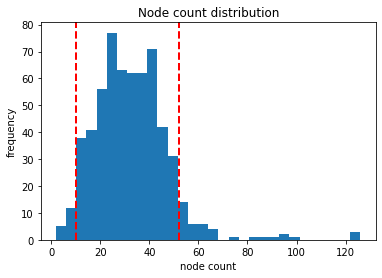

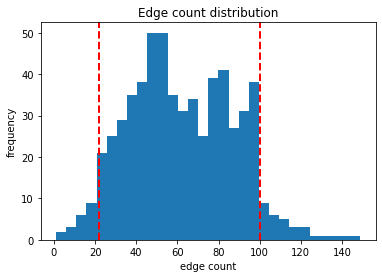

In [11]:
# lets plot the node count distribution of the graphs
threshold_nodes= [10, 52]

node_lengths = [graph.number_of_nodes() for graph in G ]
plt.hist(node_lengths, bins =  30)
plt. axvline(x=threshold_nodes[0], color='r', linestyle='dashed', linewidth=2)
plt. axvline(x=threshold_nodes[1], color='r', linestyle='dashed', linewidth=2)
plt.xlabel("node count")
plt.ylabel("frequency")
plt.title("Node count distribution")
plt.show()

# lets plot the edge count distribution of the graphs
threshold_edges= [22, 100]

edge_lengths = [graph.number_of_edges() for graph in G ]
plt.hist(edge_lengths, bins =  30)
plt. axvline(x=threshold_edges[0], color='r', linestyle='dashed', linewidth=2)
plt. axvline(x=threshold_edges[1], color='r', linestyle='dashed', linewidth=2)
plt.xlabel("edge count")
plt.ylabel("frequency")
plt.title("Edge count distribution")
plt.show()

We can notice that there are quite some enzymes with extreme low/high node/edge counts. 

For our preprocessing step we will apply edge and node count cutoffs, and remove the selected outliers because they are probably the source which make our dimensionality reduction less informative as they do not capture the esscence of data i.e. characteristics of ground truth labels.

## Preprocessing

In [12]:
# lets make some cutoffs to remove some extreme data points
G_filtered = []
indices_true = []
for graph, index in zip(G, range(0, len(G))):
    if threshold_nodes[0]  < graph.number_of_nodes() < threshold_nodes[1] \
        and threshold_edges[0]  < graph.number_of_edges() < threshold_edges[1] \
            and index not in outliers.index: #remove this line if you dont want to filter out the outliers
        
            G_filtered.append(graph)
            indices_true.append(index)

            
indices_true = np.array(indices_true)
classes = dp.get_dataset(dataset)
classes = classes[indices_true] #subsetting the label list to remove OL
print("Size of filtered data: ",len(G_filtered))

Size of filtered data:  488


# Dimensionality Reduction - WL

Here we want to try out clustering on different vector representations across different WL kernel iterations in order to see which WL iteration might capture the most amount of information.  We also evaluate the clustering results with NMI metrics.

##################################
Load from  kernels/node_labels
##################################
##################################
Dataset:  ENZYMES
Iteration:  1
##################################
(488, 488) (488, 9658)


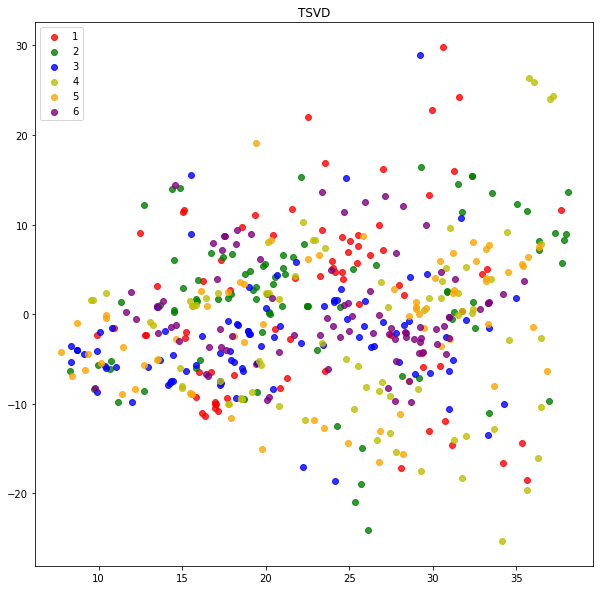

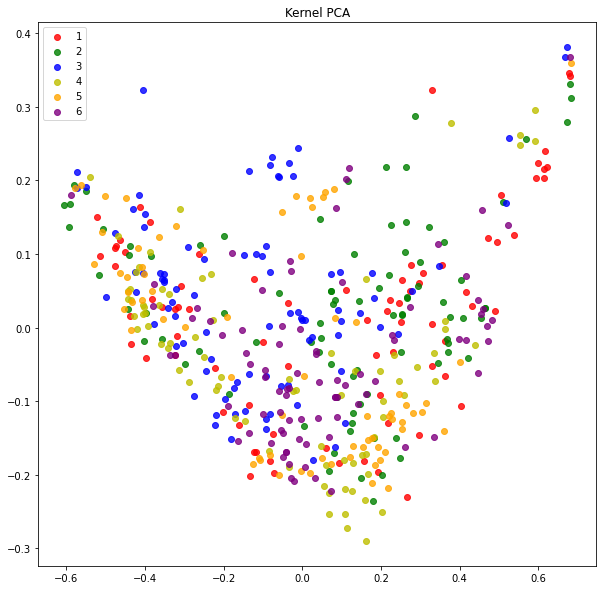

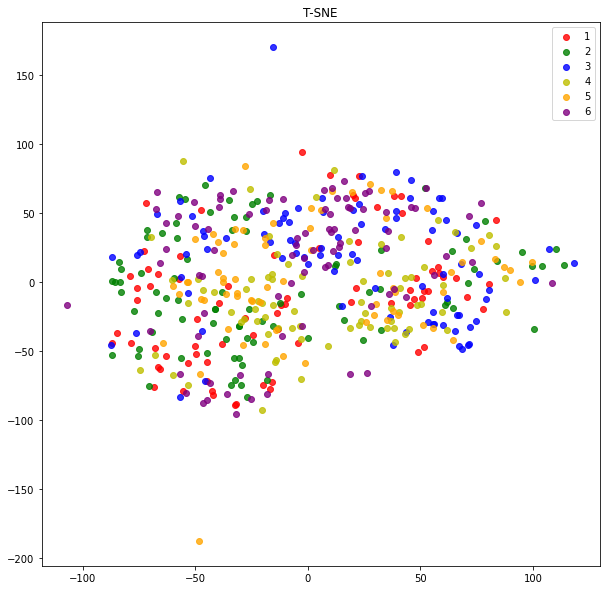

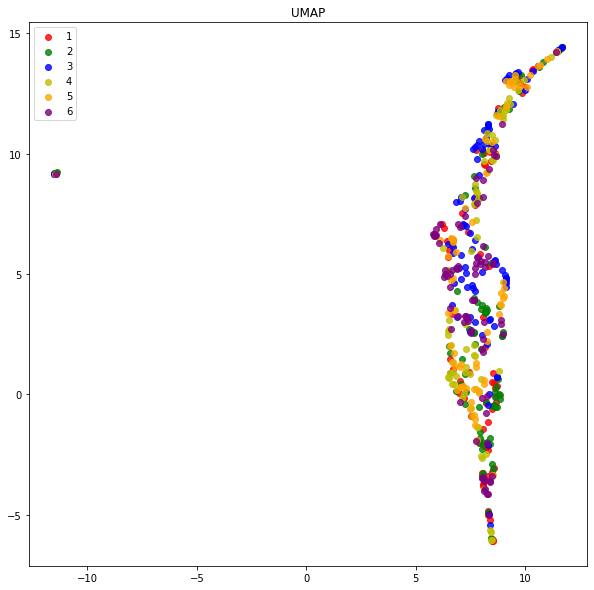

Number of labels:  6


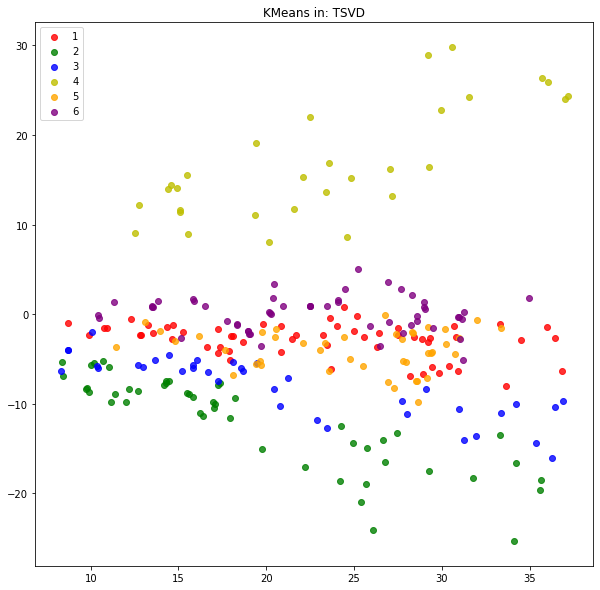

KMeans NMI:0.1084


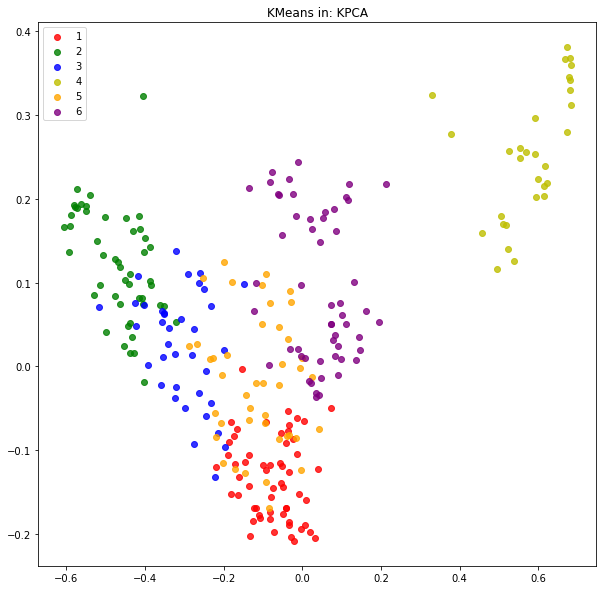

KMeans NMI:0.1084


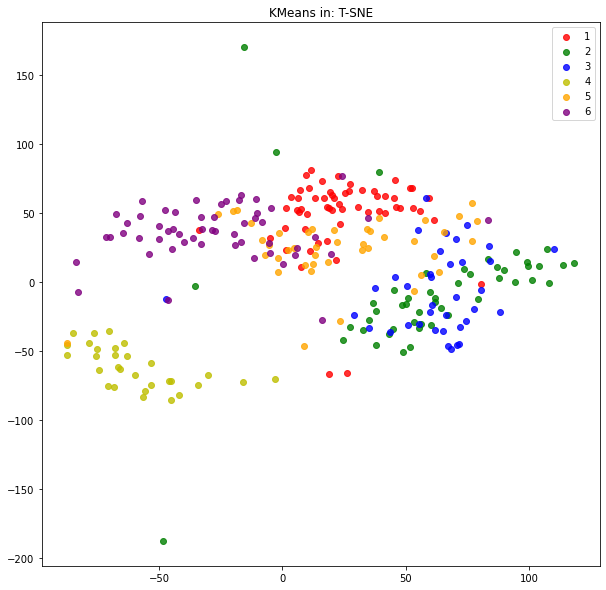

KMeans NMI:0.1084


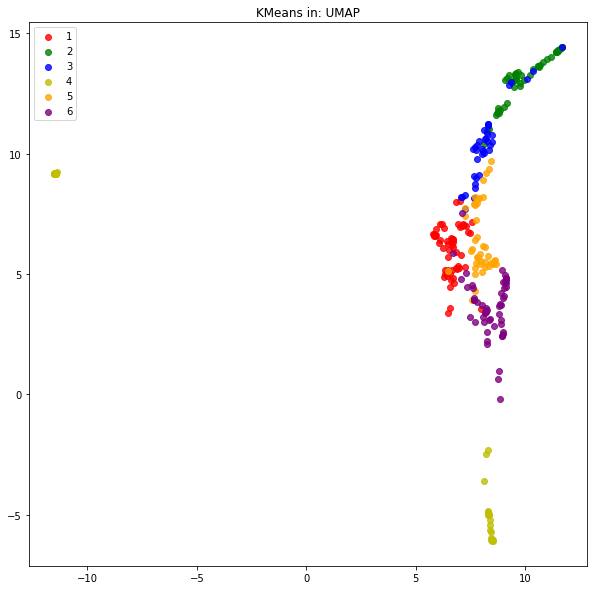

KMeans NMI:0.1084


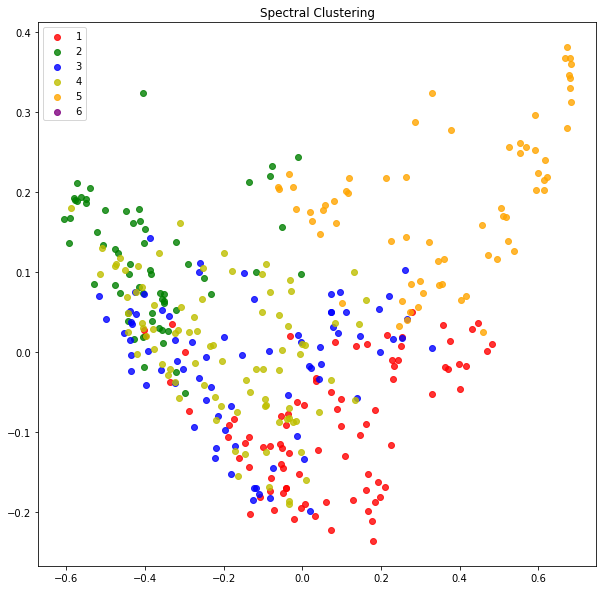

##################################
OPTICS
##################################
Dataset:  ENZYMES
Iteration:  2
##################################
(488, 488) (488, 25577)


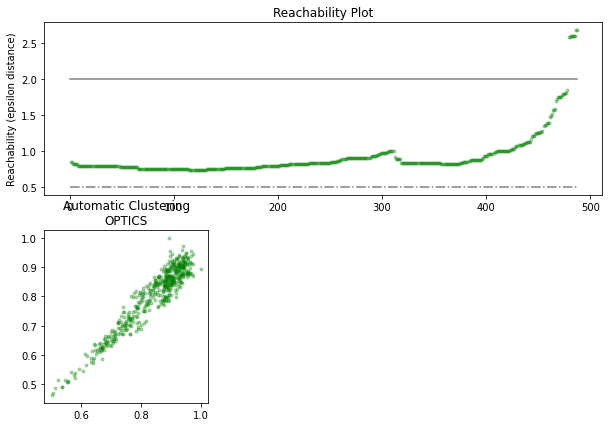

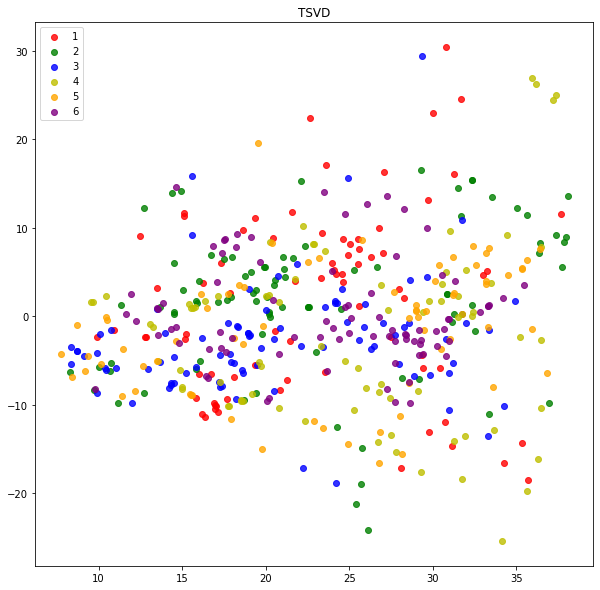

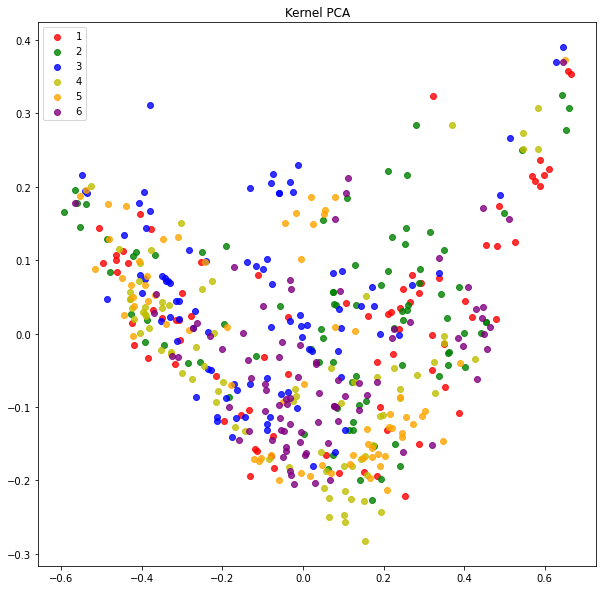

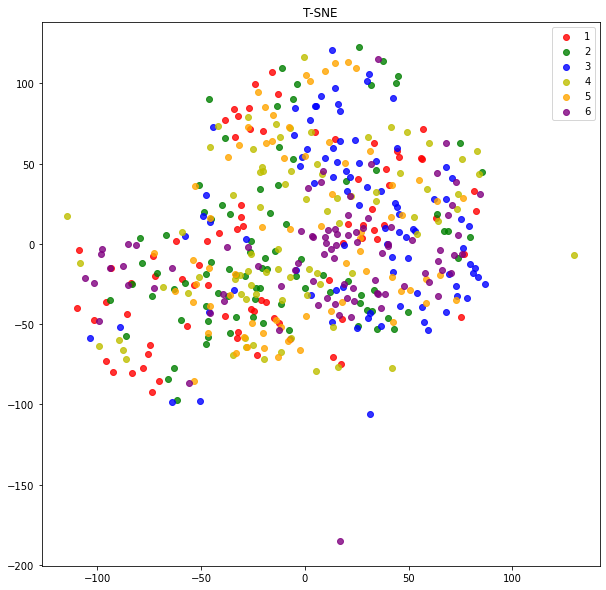

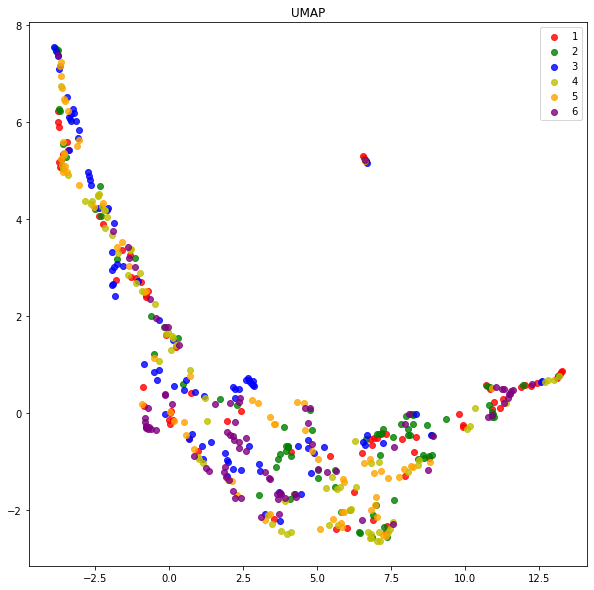

Number of labels:  6


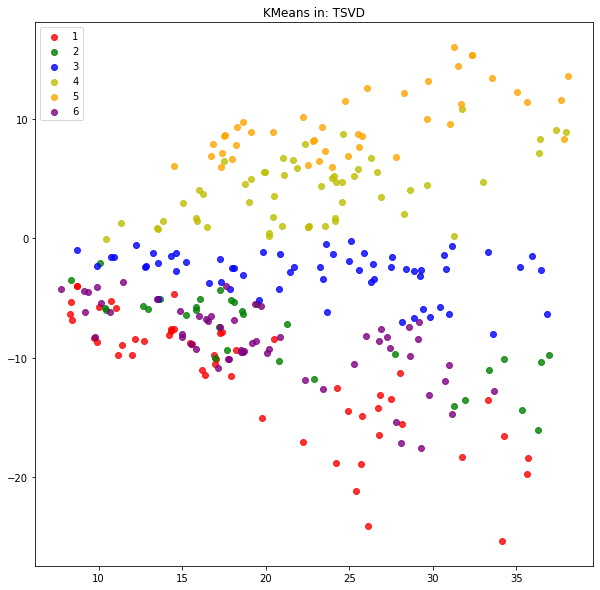

KMeans NMI:0.1207


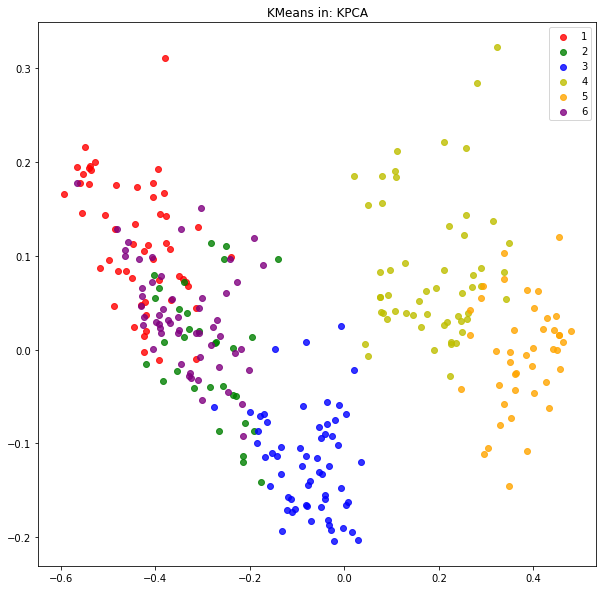

KMeans NMI:0.1207


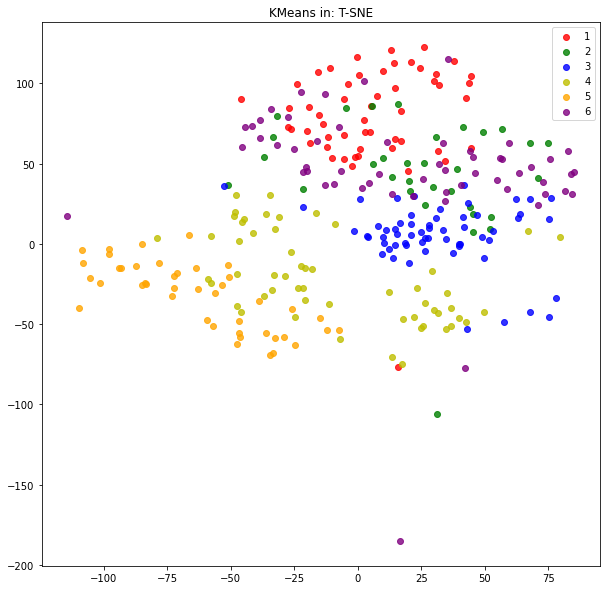

KMeans NMI:0.1207


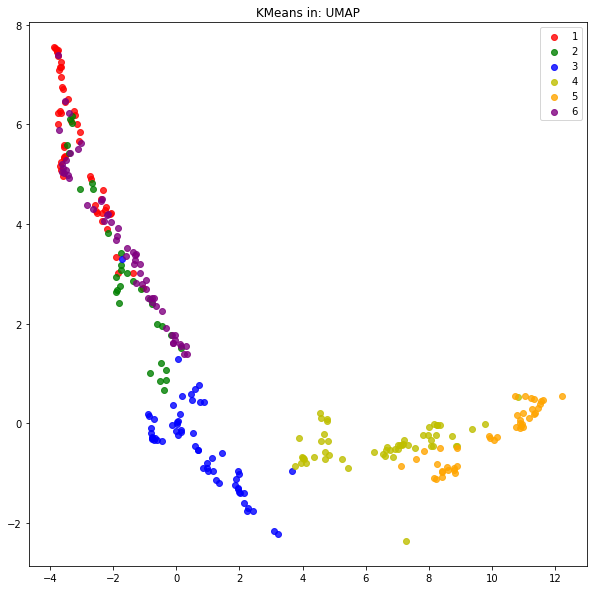

KMeans NMI:0.1207


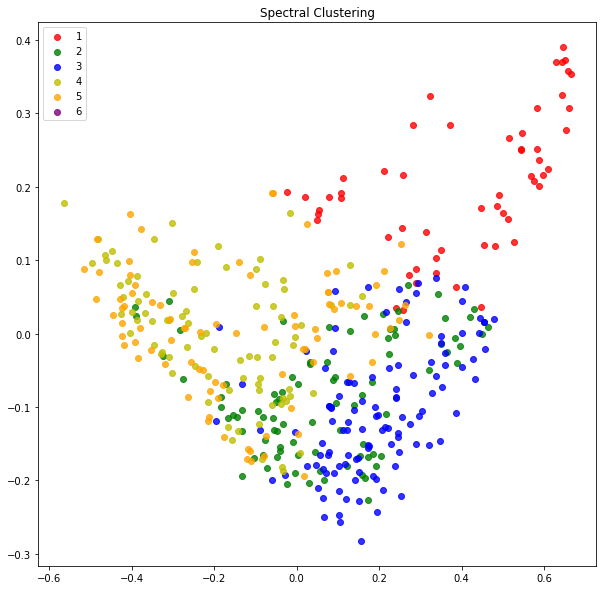

##################################
OPTICS
##################################
Dataset:  ENZYMES
Iteration:  3
##################################
(488, 488) (488, 42457)


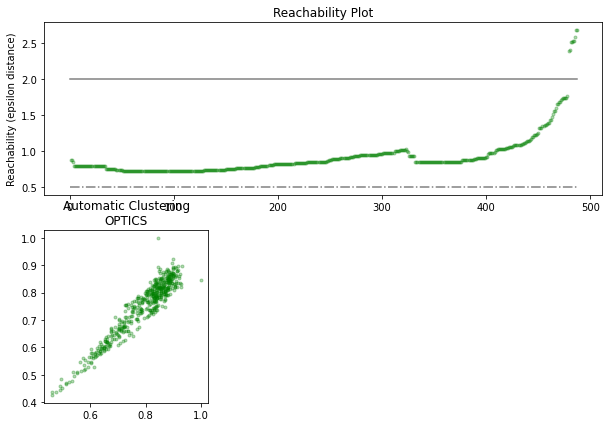

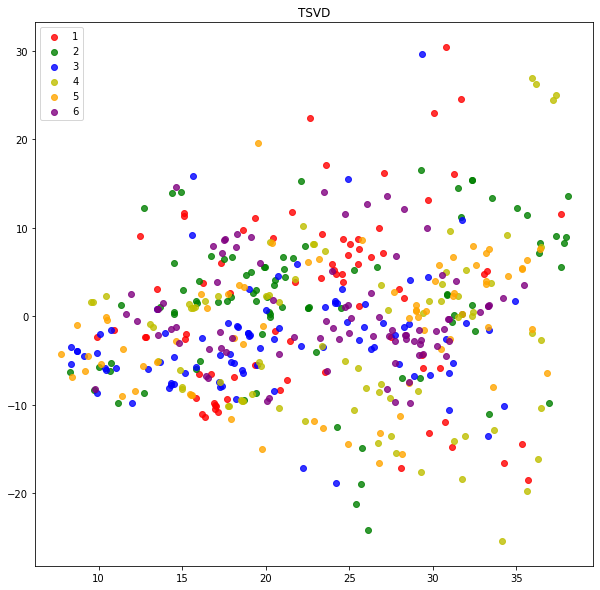

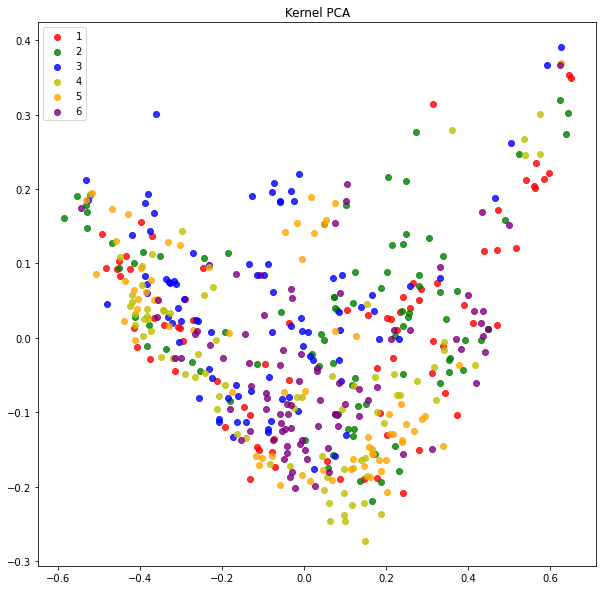

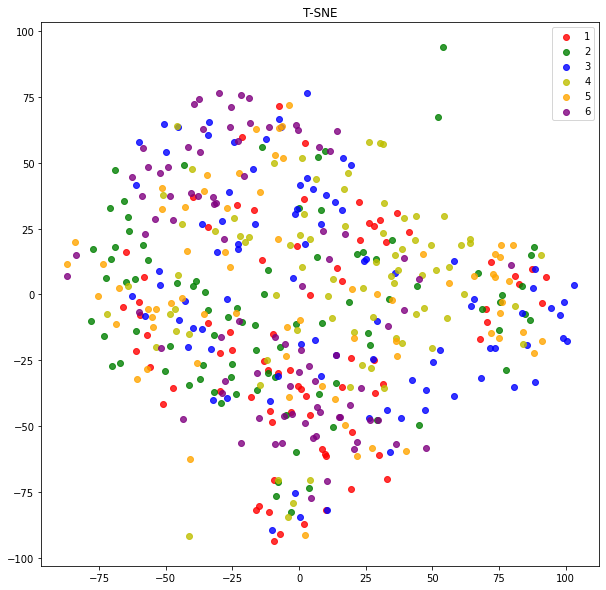

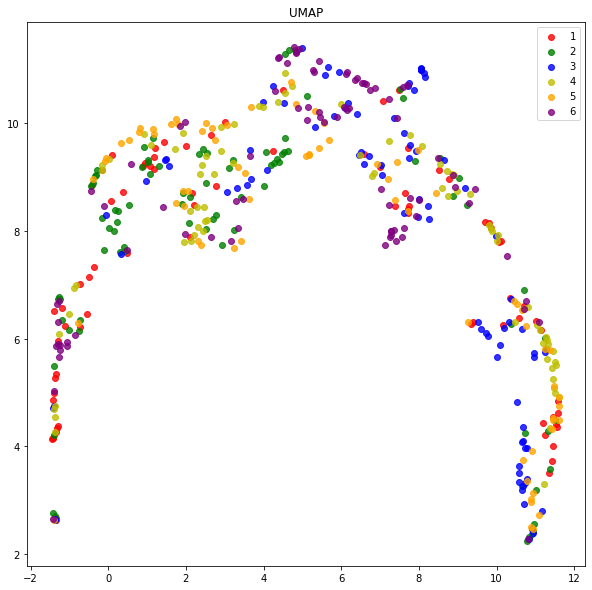

Number of labels:  6


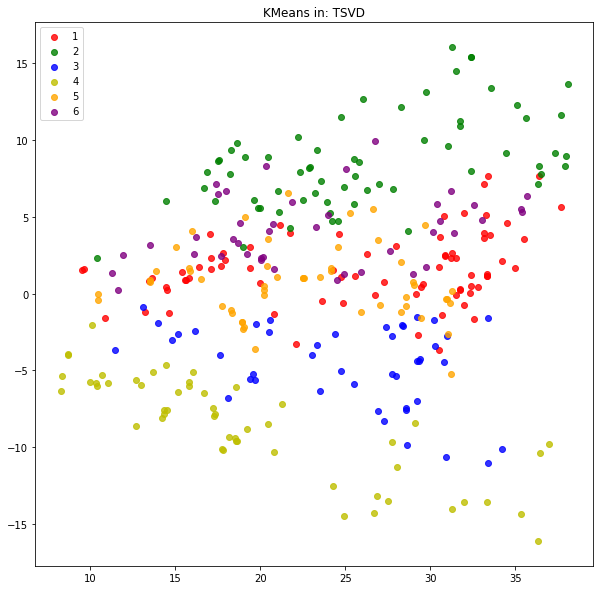

KMeans NMI:0.1018


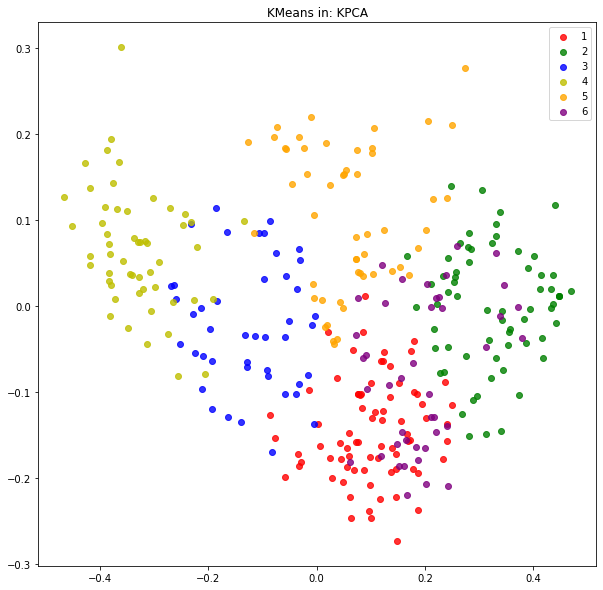

KMeans NMI:0.1018


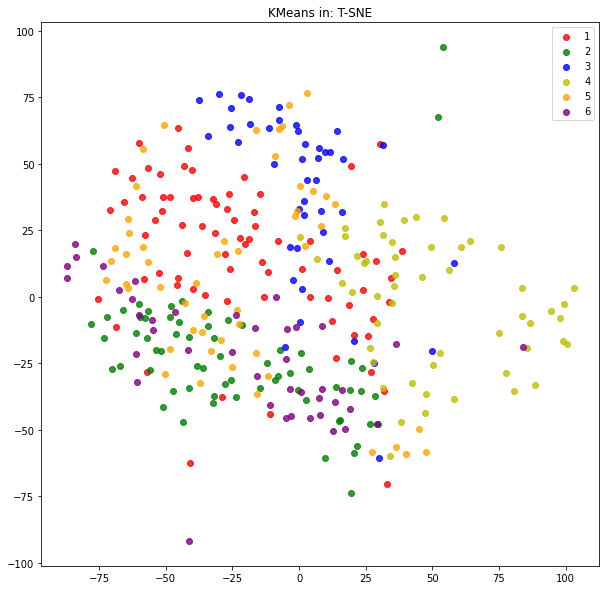

KMeans NMI:0.1018


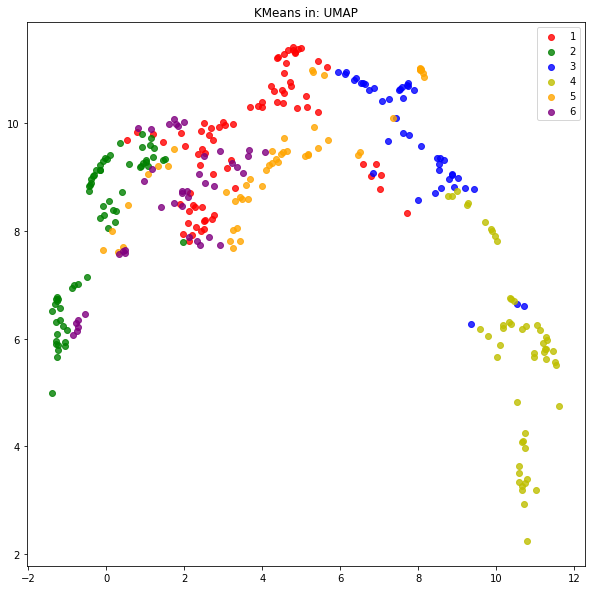

KMeans NMI:0.1018


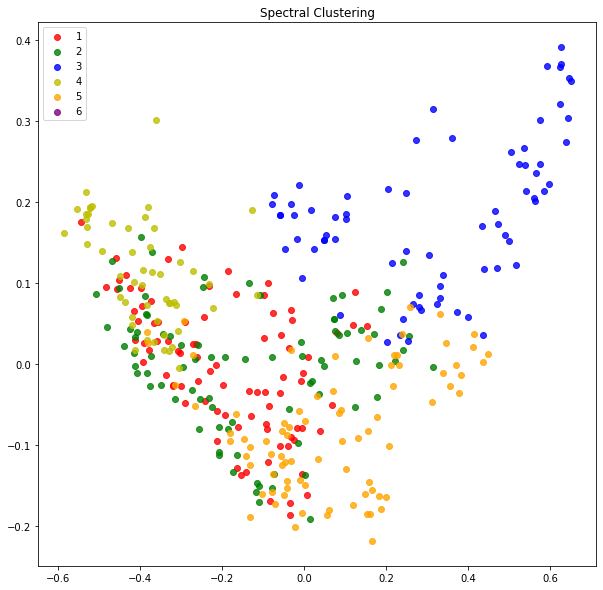

##################################
OPTICS
##################################
Dataset:  ENZYMES
Iteration:  4
##################################
(488, 488) (488, 59599)


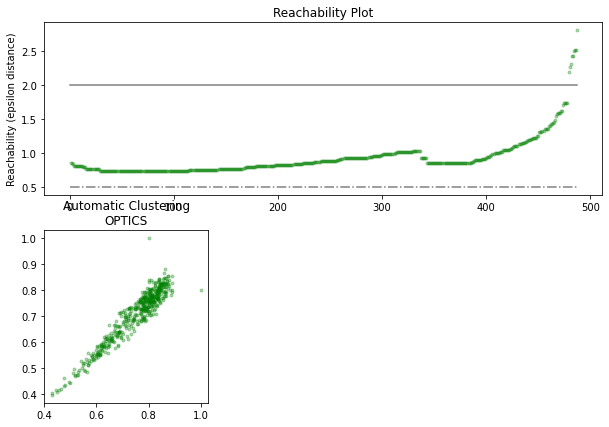

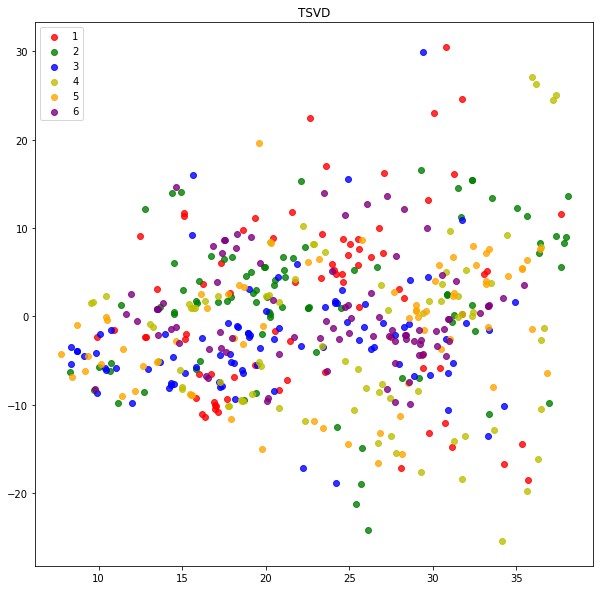

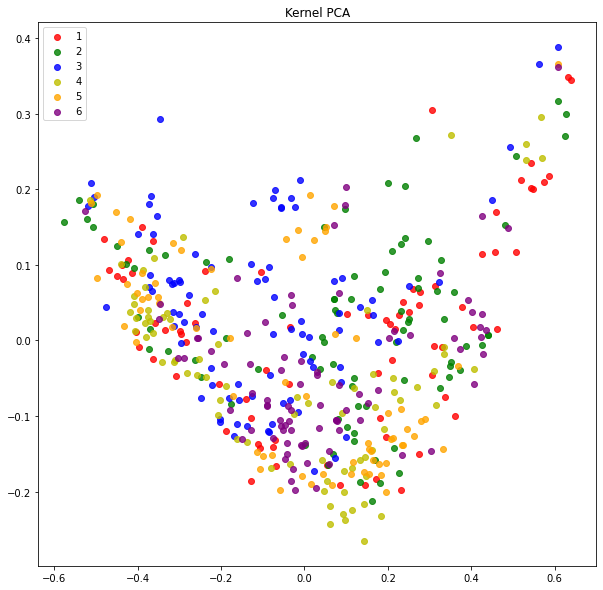

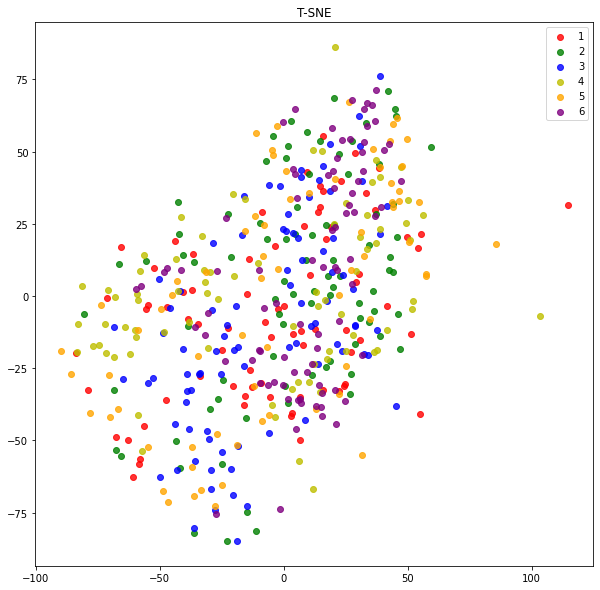

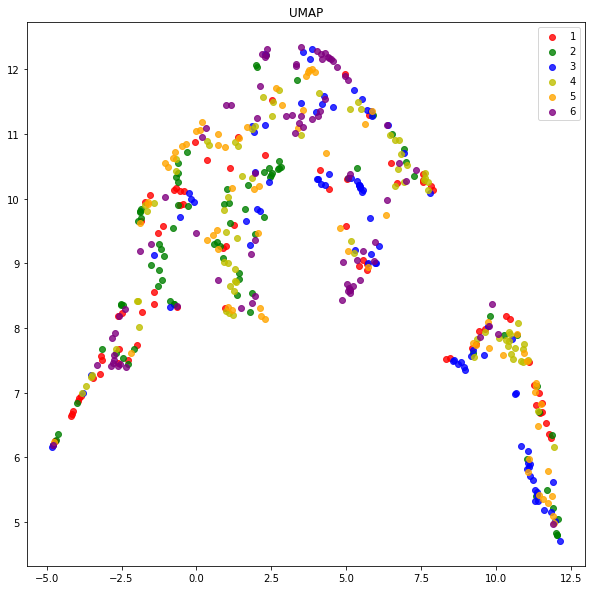

Number of labels:  6


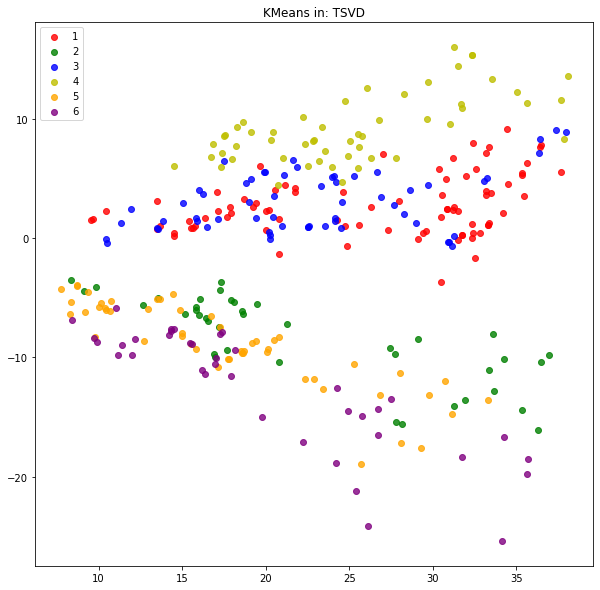

KMeans NMI:0.1205


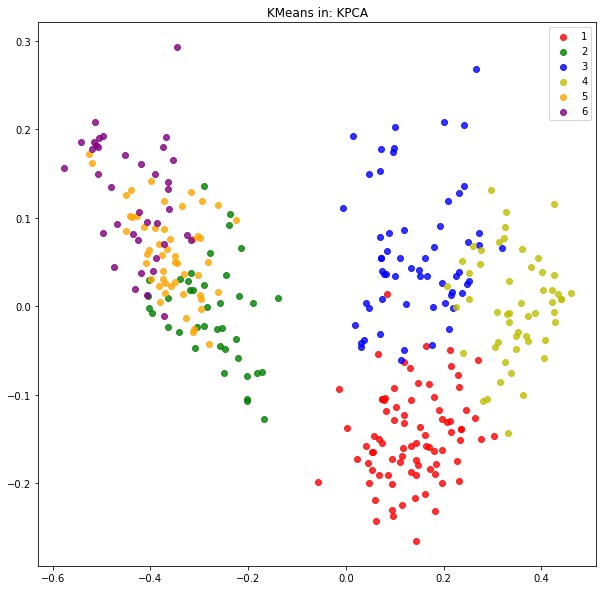

KMeans NMI:0.1205


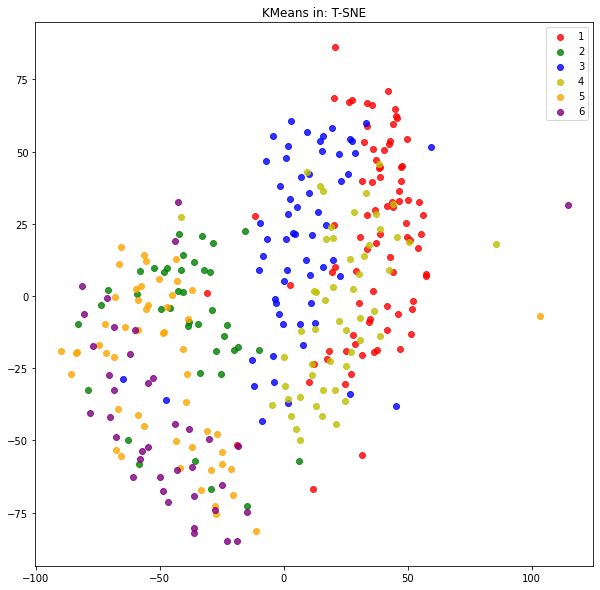

KMeans NMI:0.1205


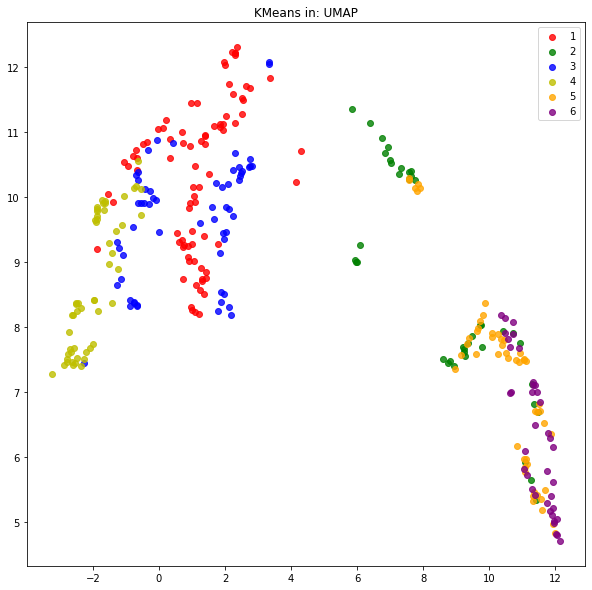

KMeans NMI:0.1205


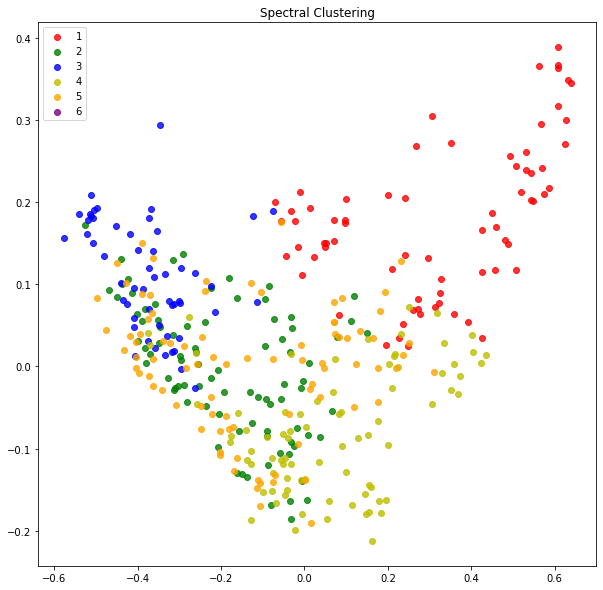

##################################
OPTICS
##################################
Dataset:  ENZYMES
Iteration:  5
##################################
(488, 488) (488, 76881)


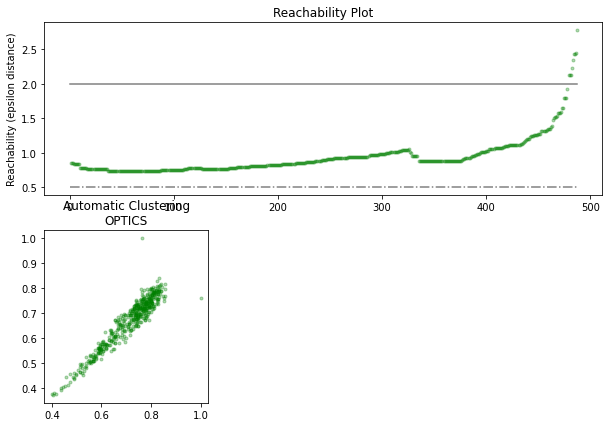

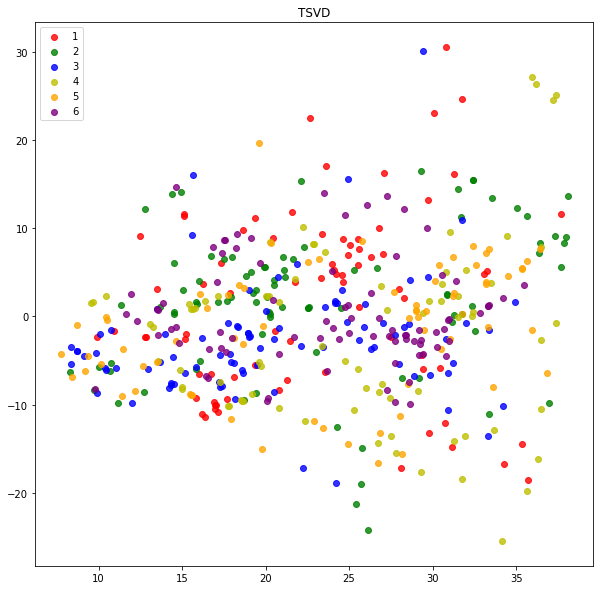

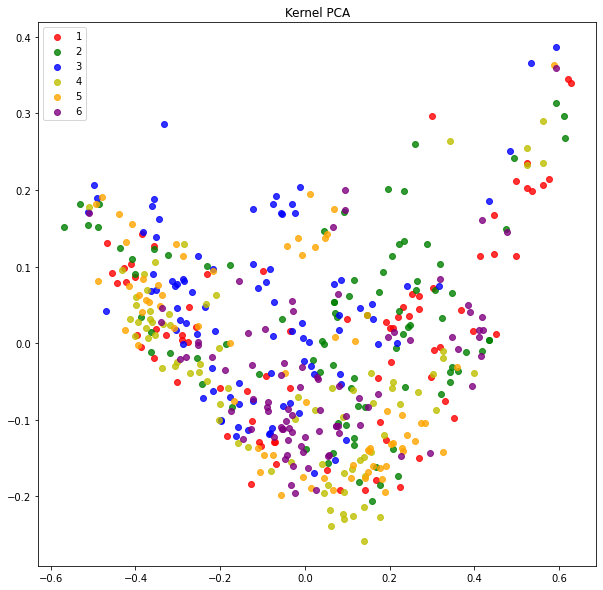

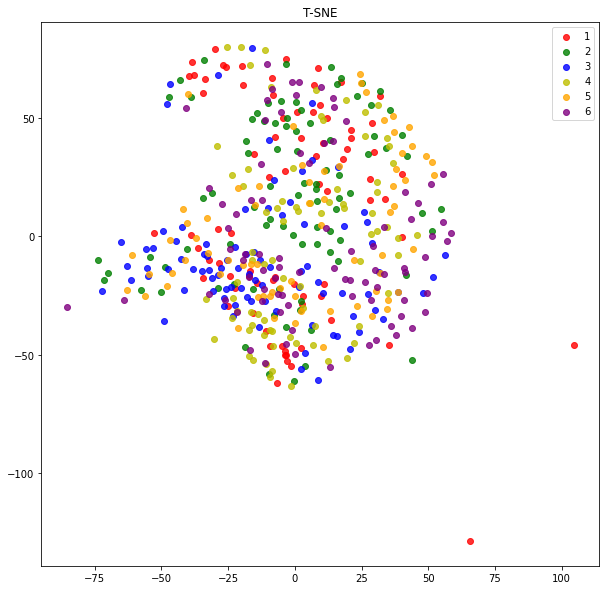

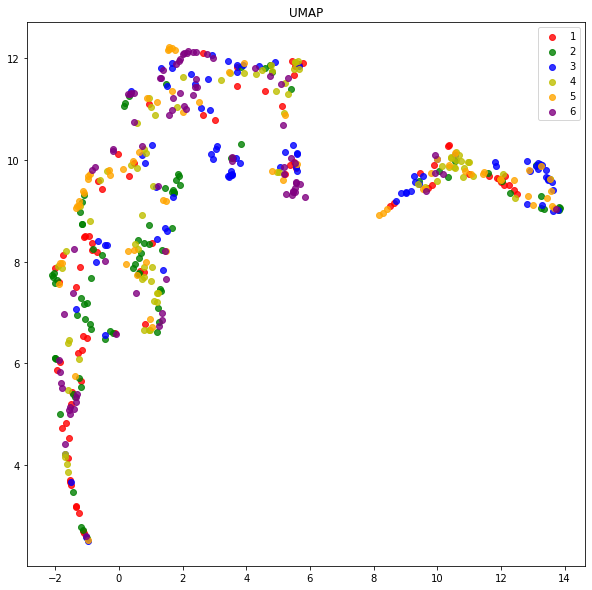

Number of labels:  6


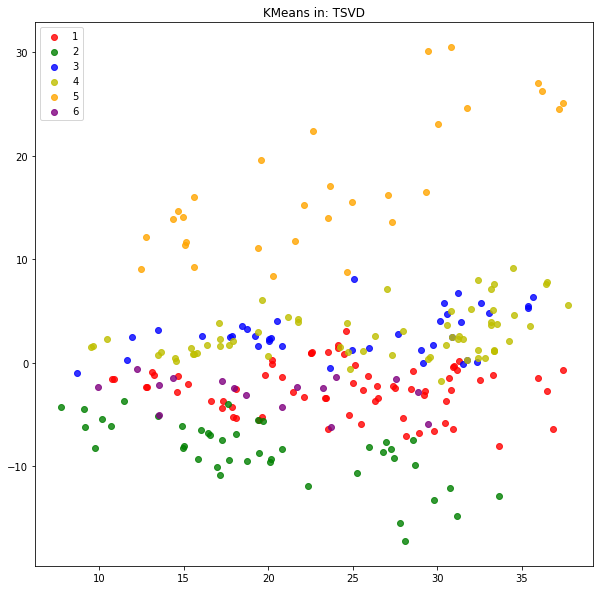

KMeans NMI:0.1098


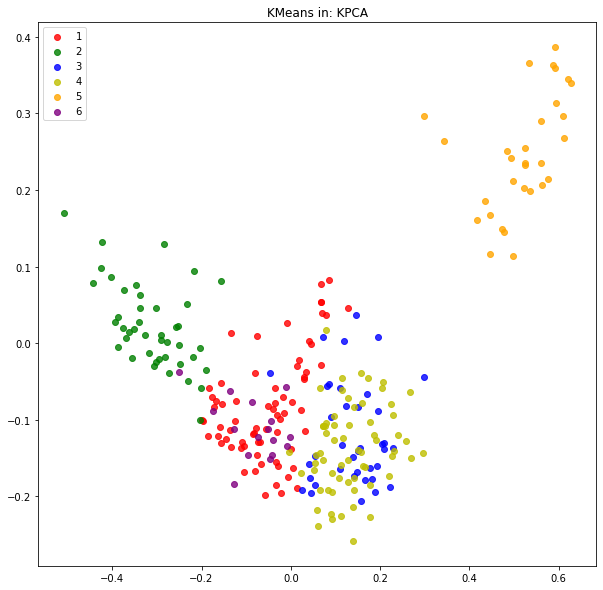

KMeans NMI:0.1098


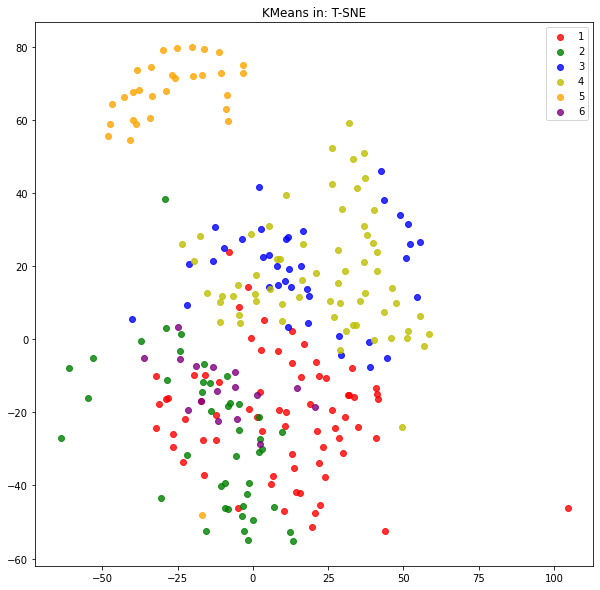

KMeans NMI:0.1098


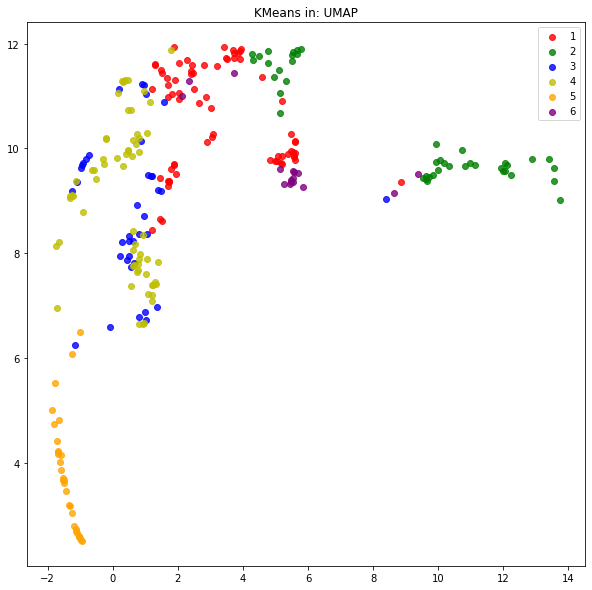

KMeans NMI:0.1098


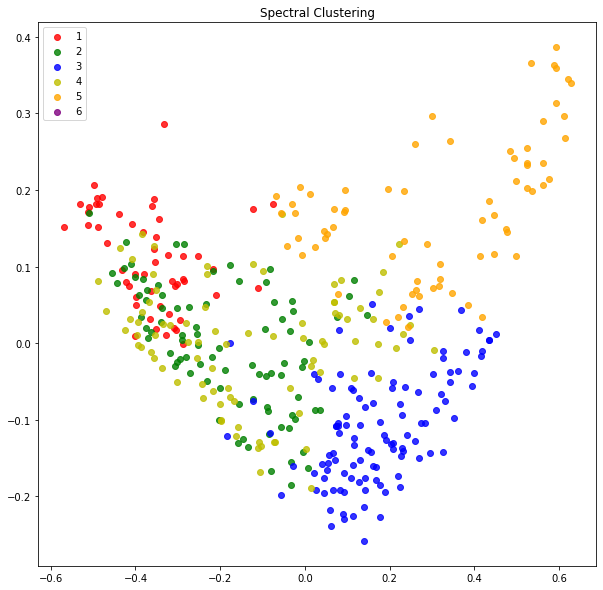

##################################
OPTICS
##################################
Load from  kernels/without_labels
##################################
##################################
Dataset:  ENZYMES
Iteration:  1
##################################
(488, 488) (488, 2723)


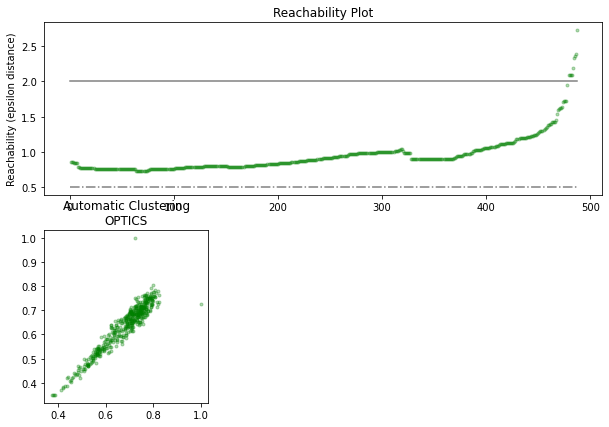

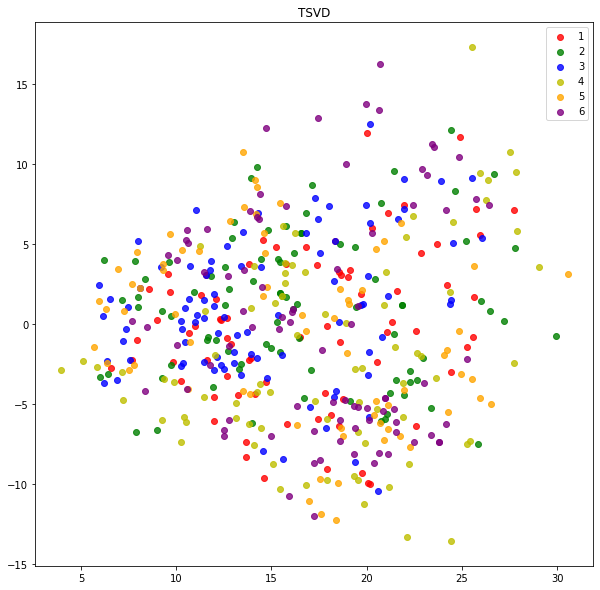

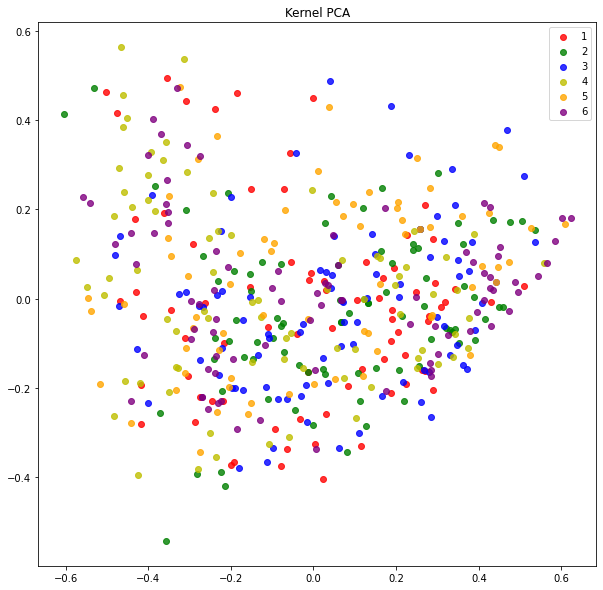

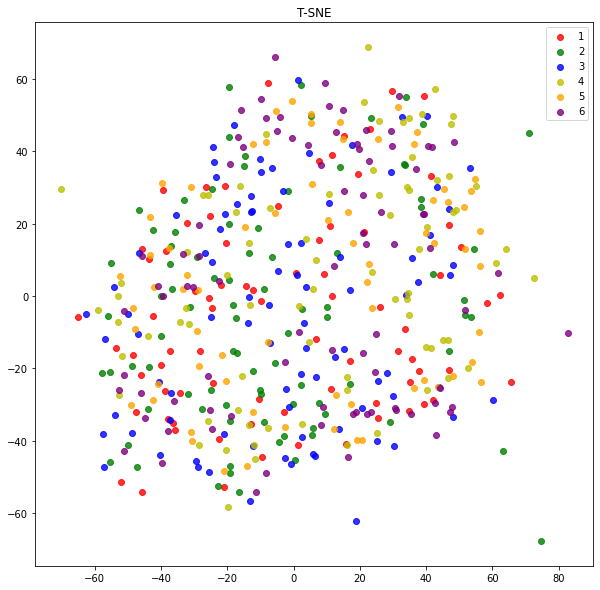

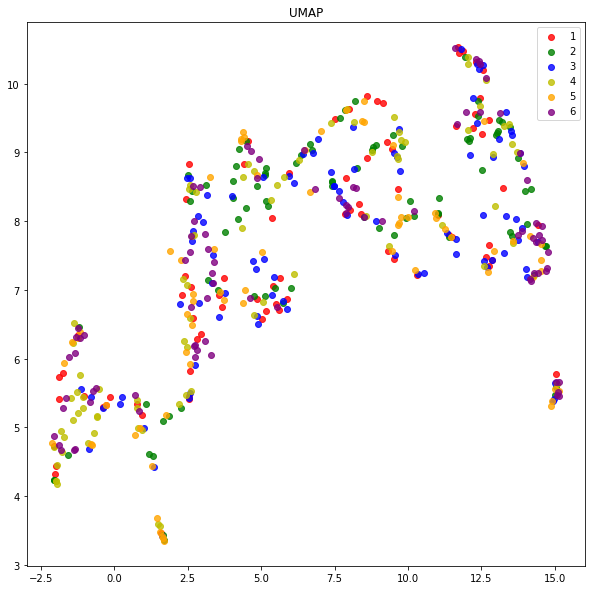

Number of labels:  6


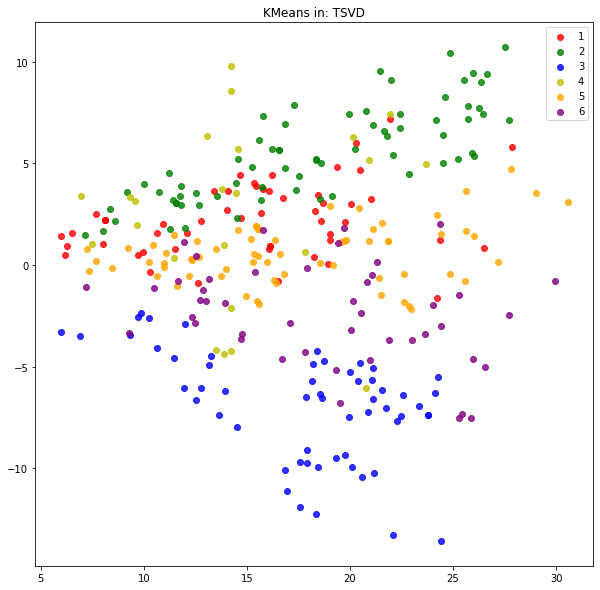

KMeans NMI:0.0566


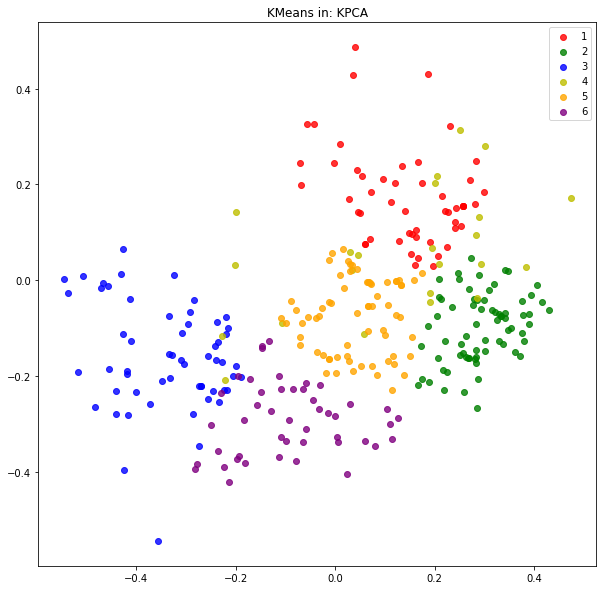

KMeans NMI:0.0566


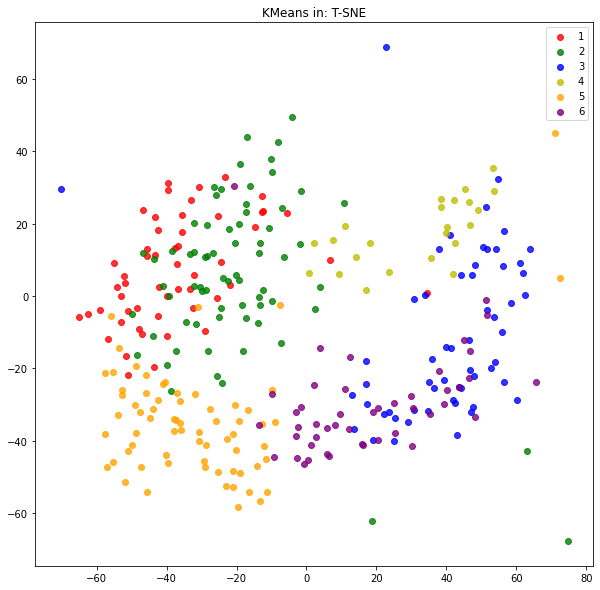

KMeans NMI:0.0566


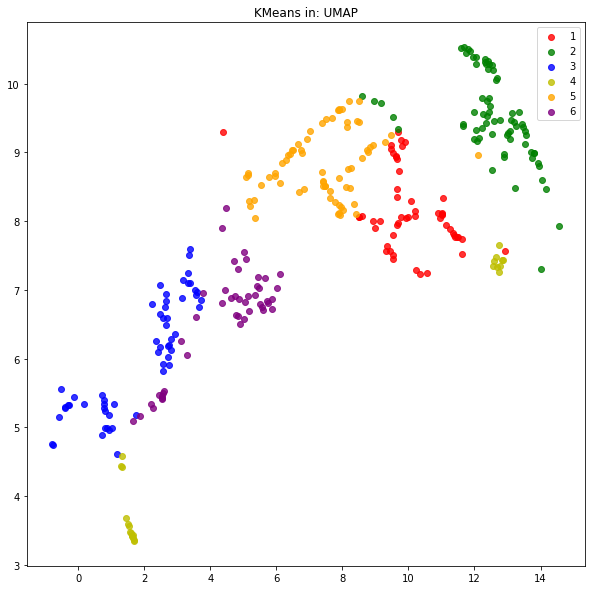

KMeans NMI:0.0566


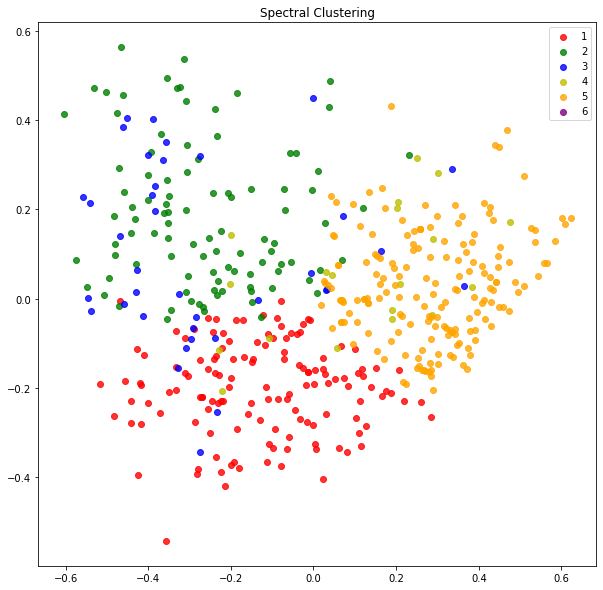

##################################
OPTICS
##################################
Dataset:  ENZYMES
Iteration:  2
##################################
(488, 488) (488, 14821)


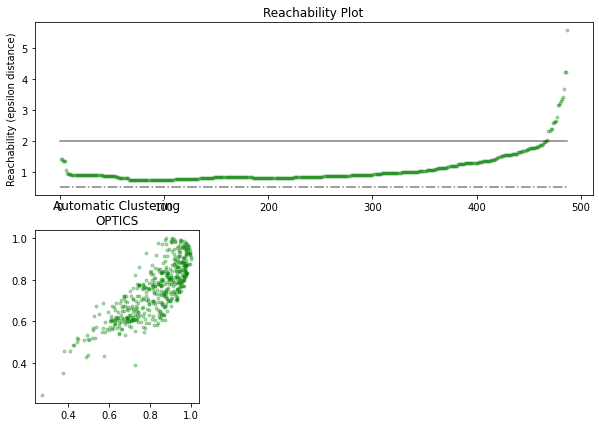

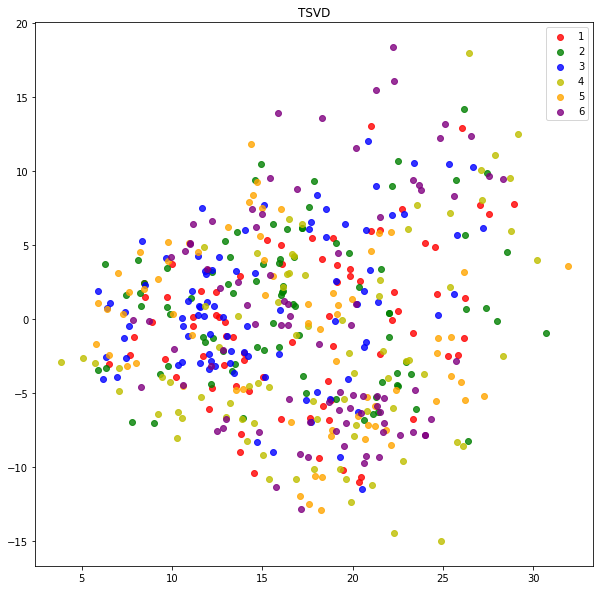

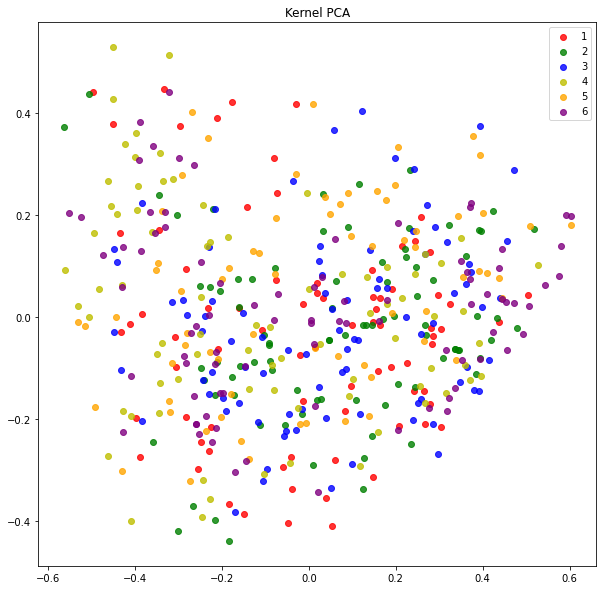

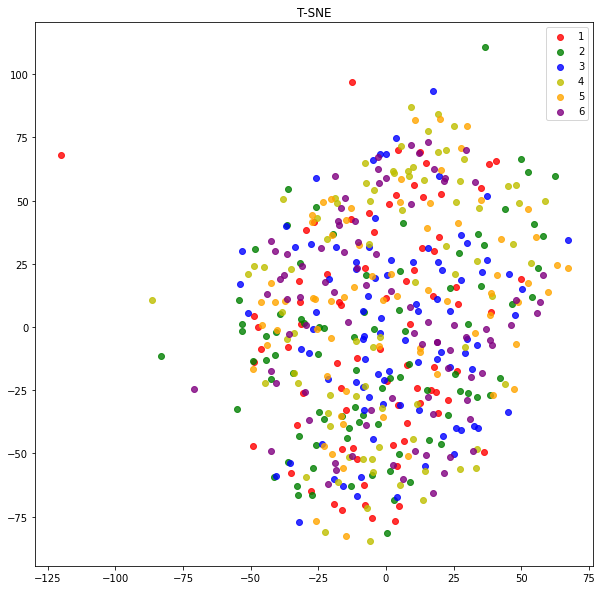

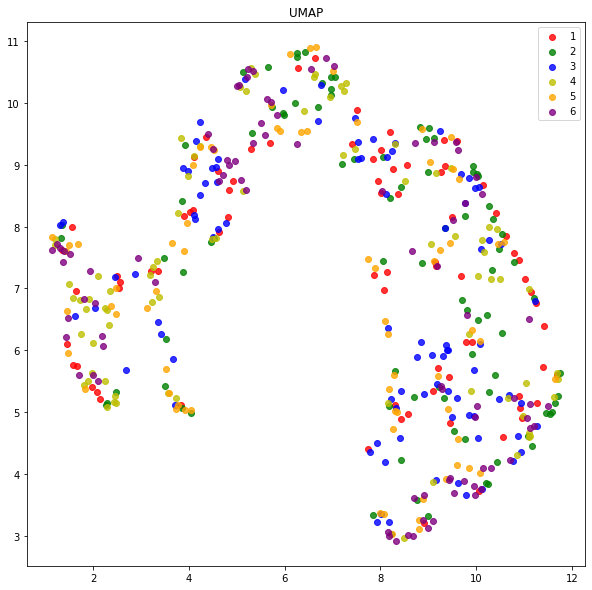

Number of labels:  6


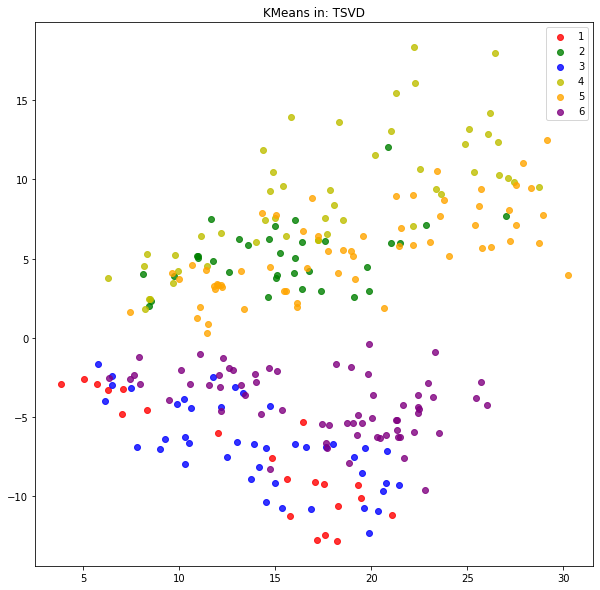

KMeans NMI:0.0444


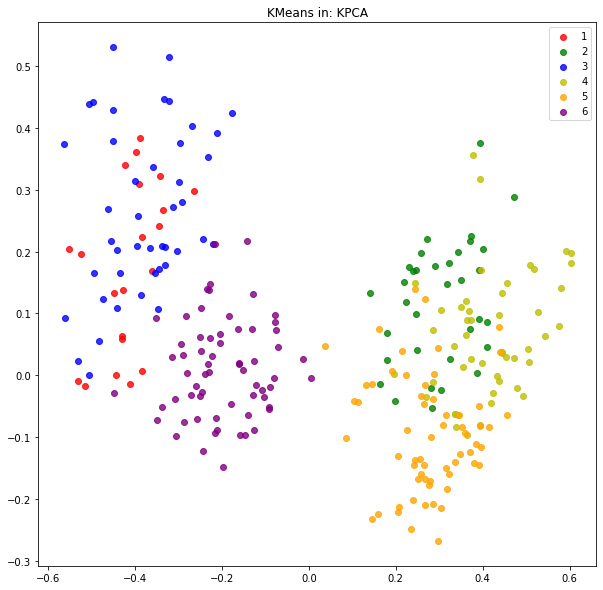

KMeans NMI:0.0444


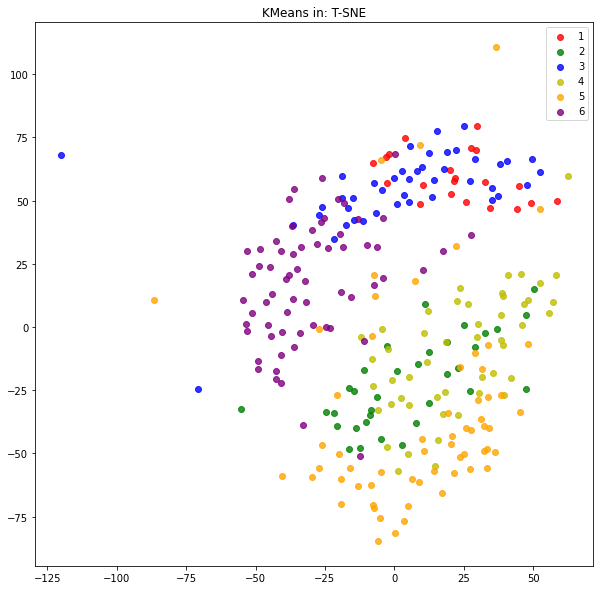

KMeans NMI:0.0444


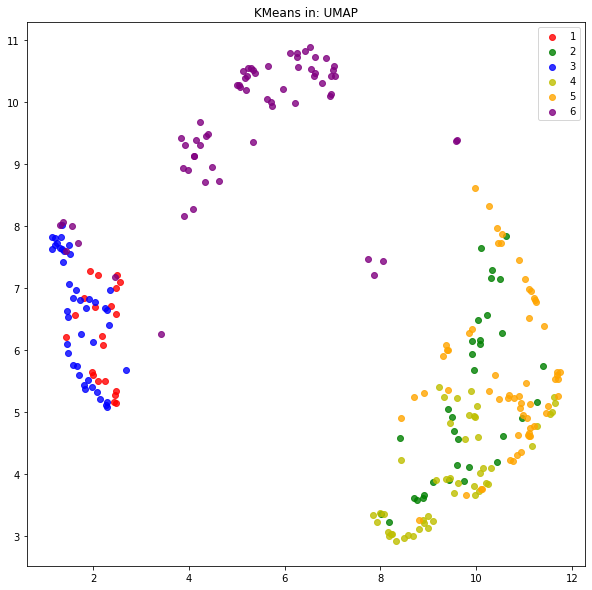

KMeans NMI:0.0444


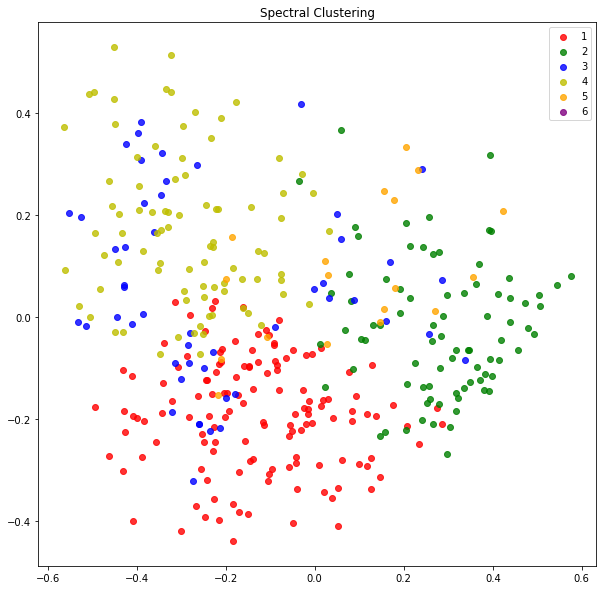

##################################
OPTICS
##################################
Dataset:  ENZYMES
Iteration:  3
##################################
(488, 488) (488, 30897)


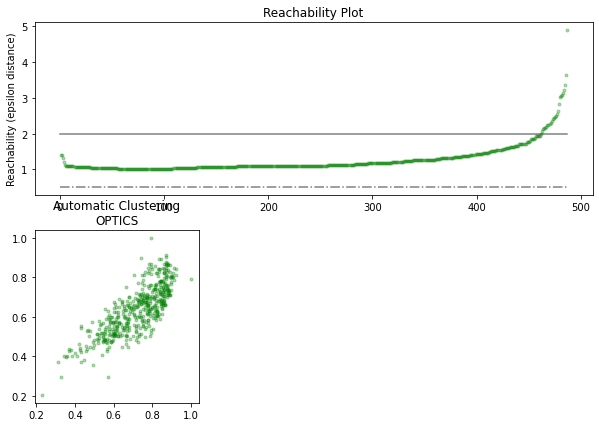

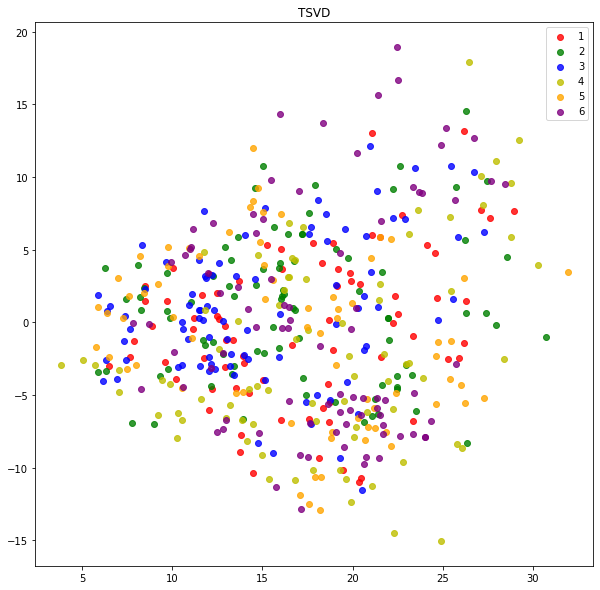

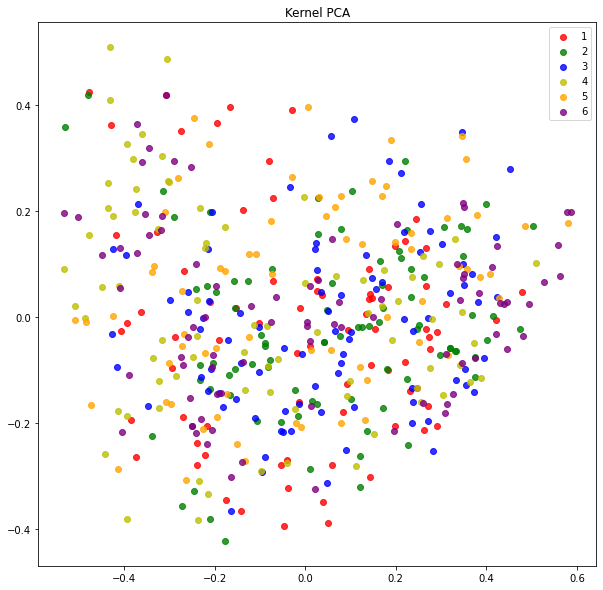

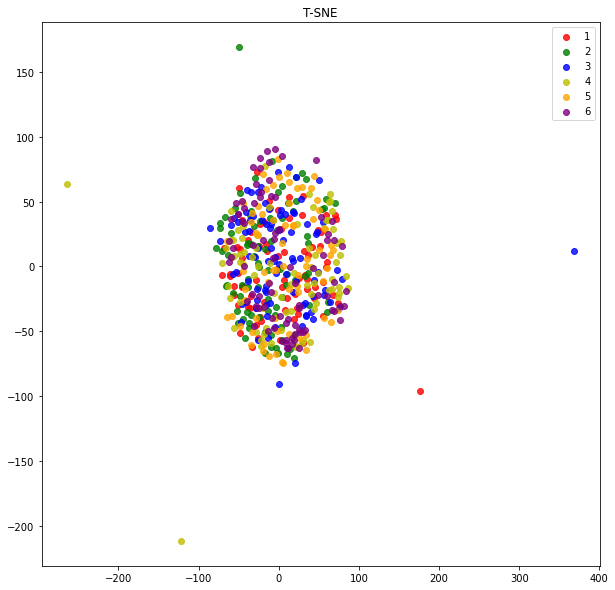

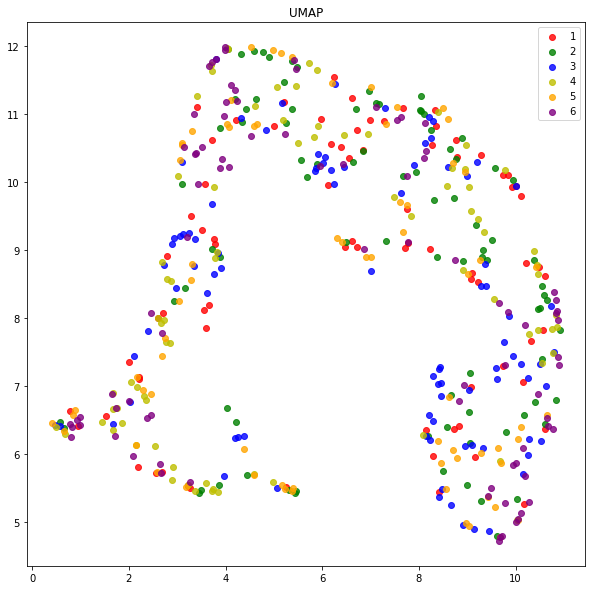

Number of labels:  6


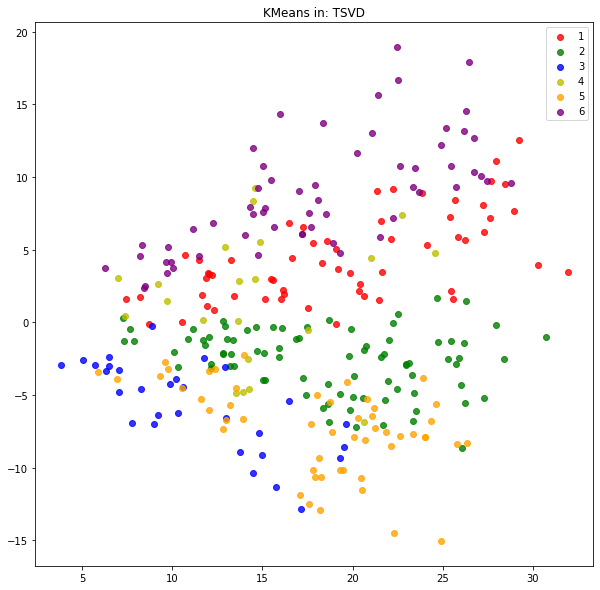

KMeans NMI:0.0443


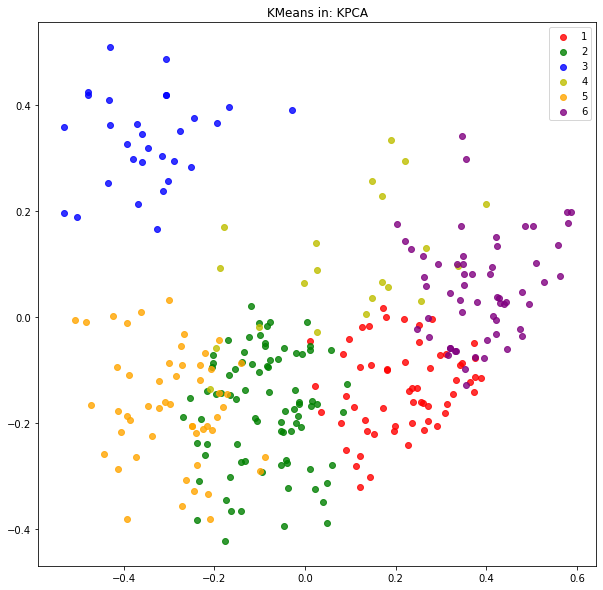

KMeans NMI:0.0443


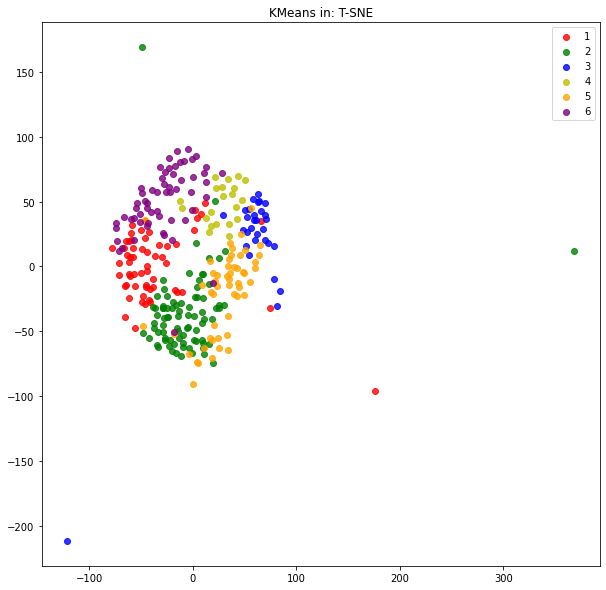

KMeans NMI:0.0443


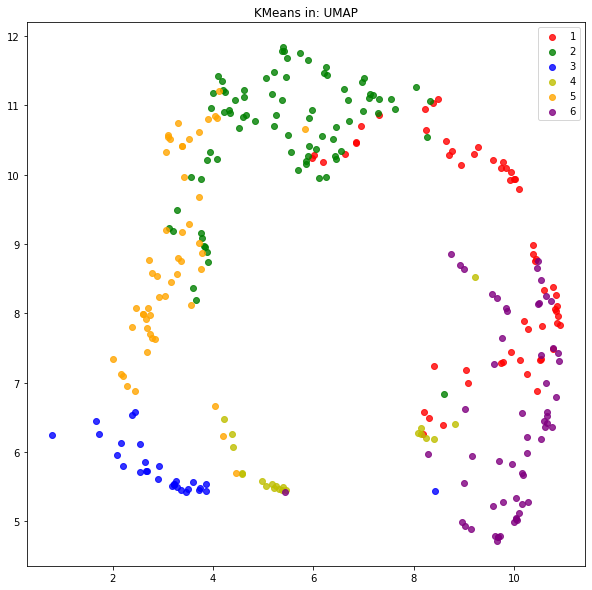

KMeans NMI:0.0443


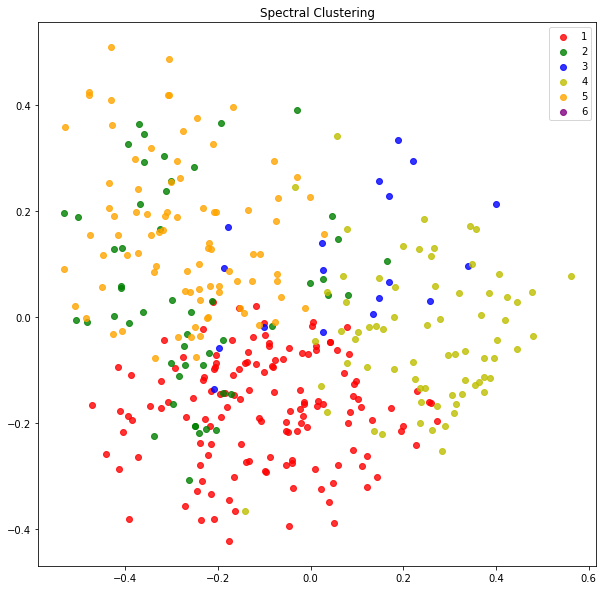

##################################
OPTICS
##################################
Dataset:  ENZYMES
Iteration:  4
##################################
(488, 488) (488, 47549)


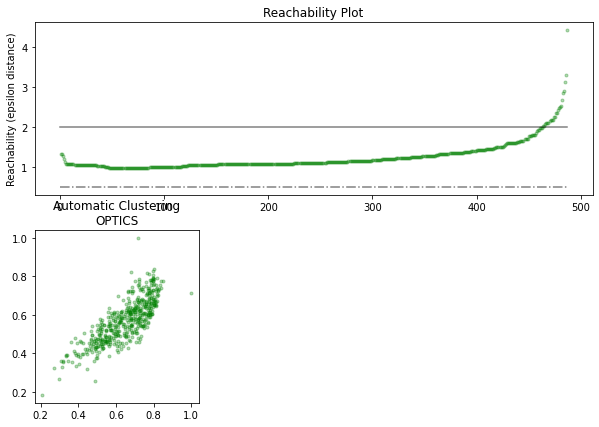

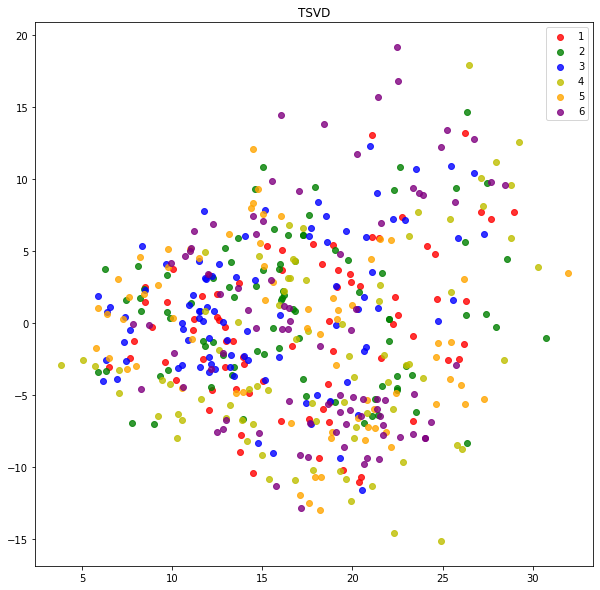

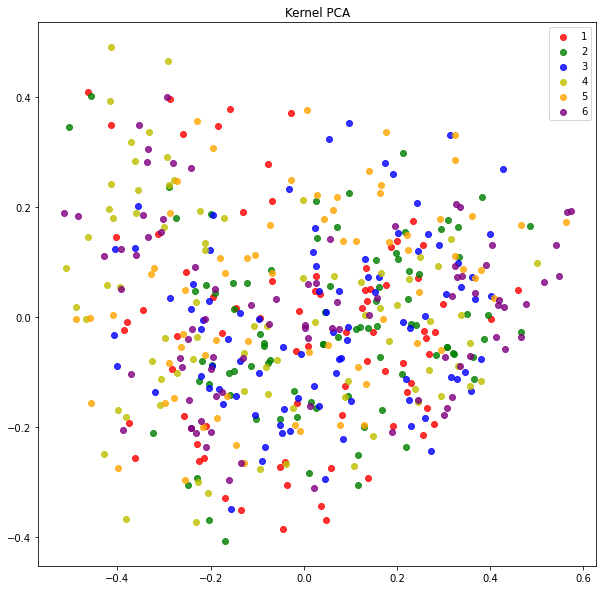

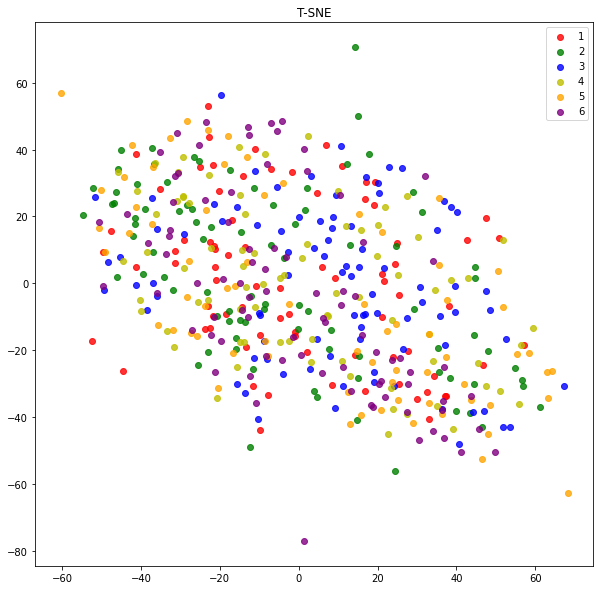

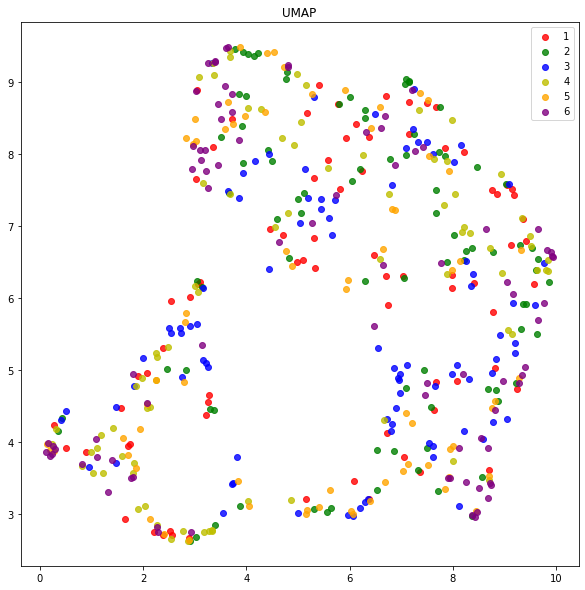

Number of labels:  6


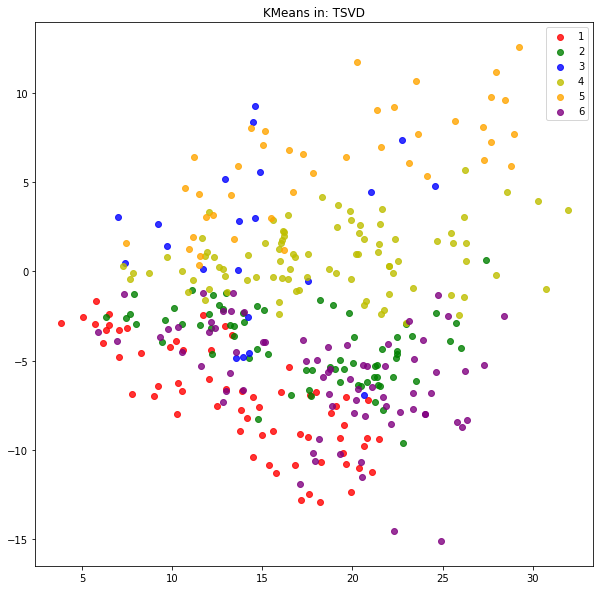

KMeans NMI:0.0553


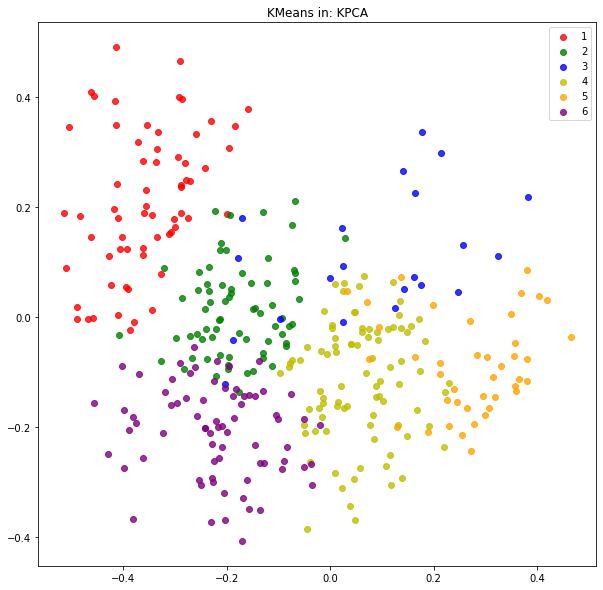

KMeans NMI:0.0553


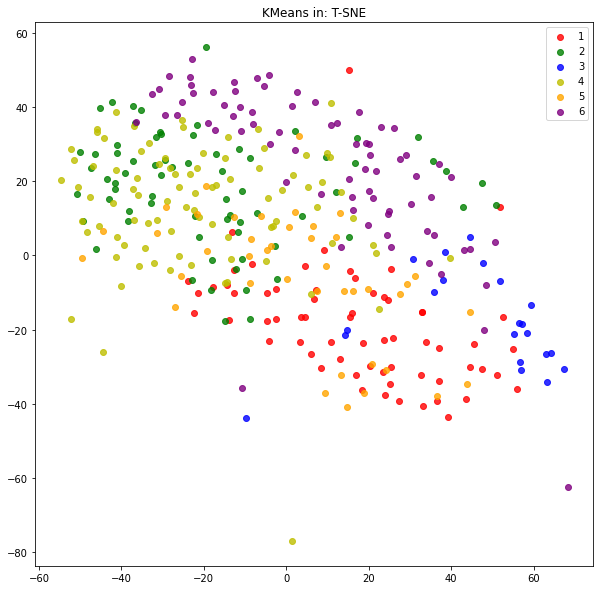

KMeans NMI:0.0553


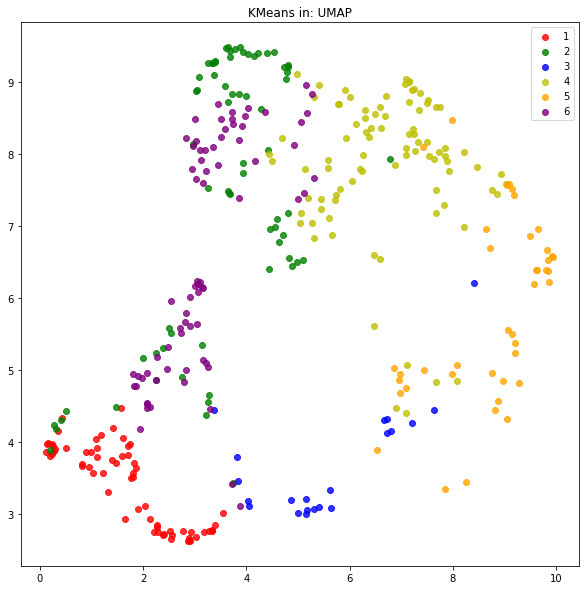

KMeans NMI:0.0553


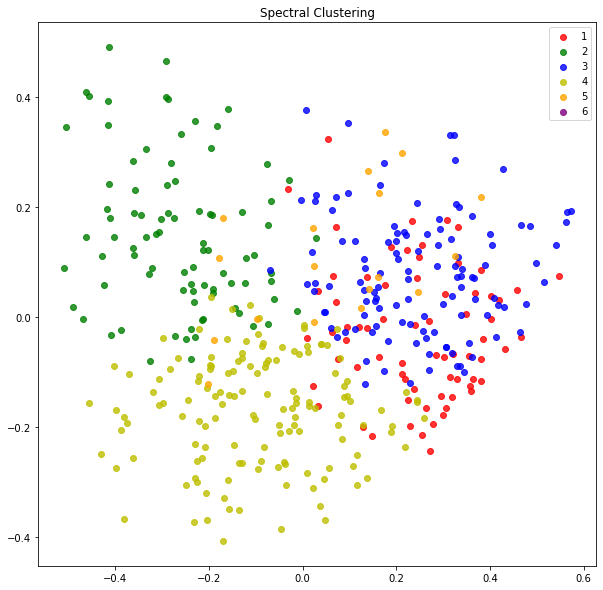

##################################
OPTICS
##################################
Dataset:  ENZYMES
Iteration:  5
##################################
(488, 488) (488, 64397)


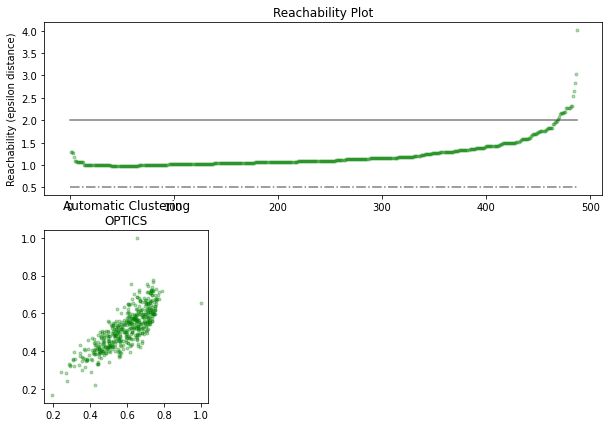

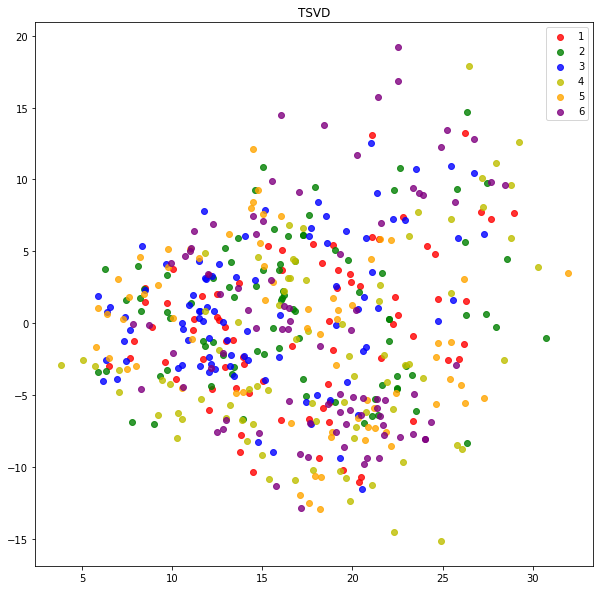

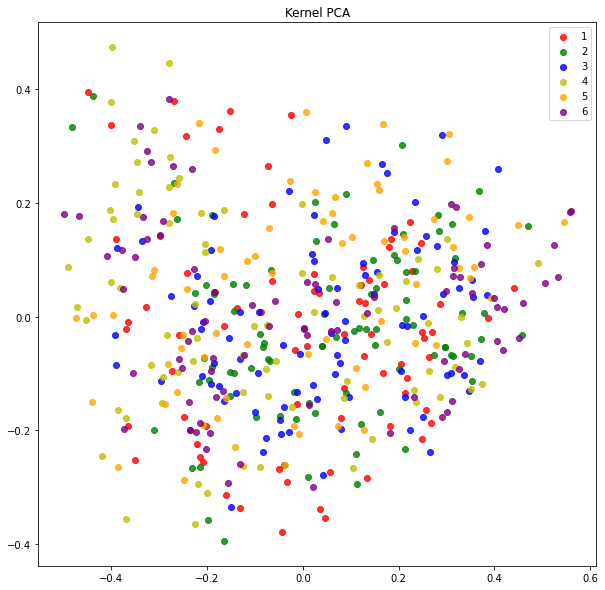

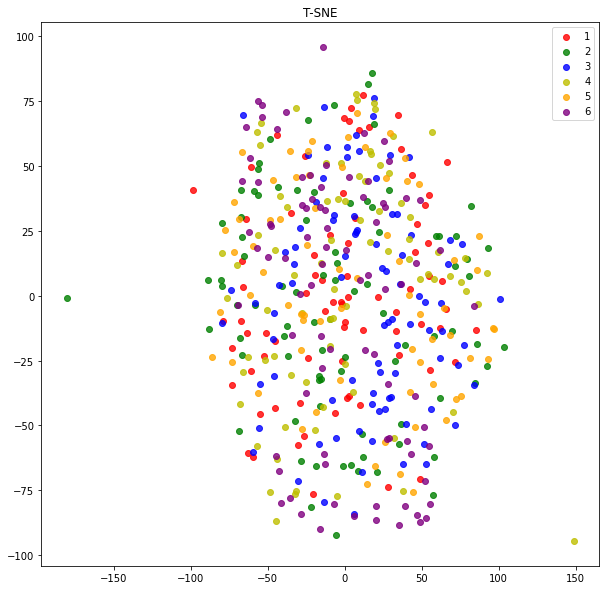

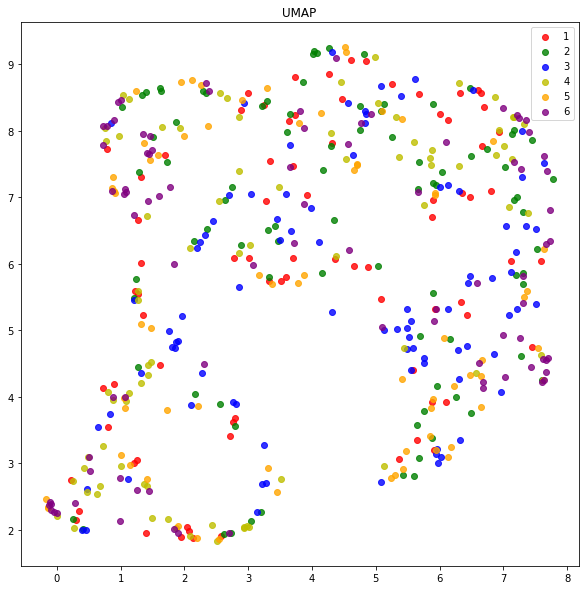

Number of labels:  6


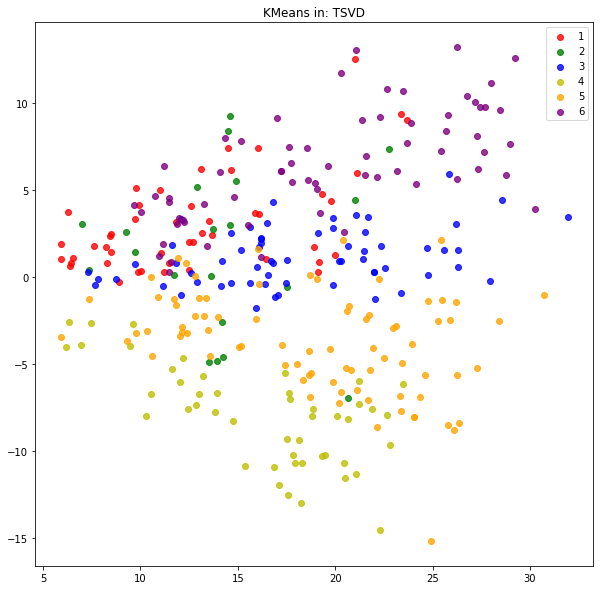

KMeans NMI:0.0537


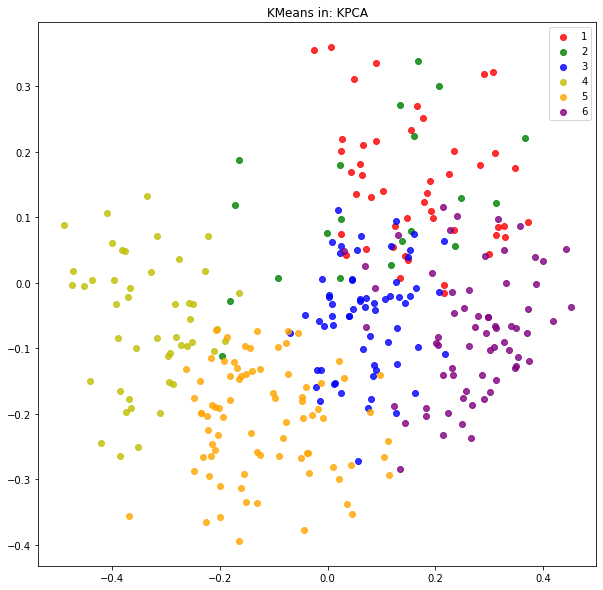

KMeans NMI:0.0537


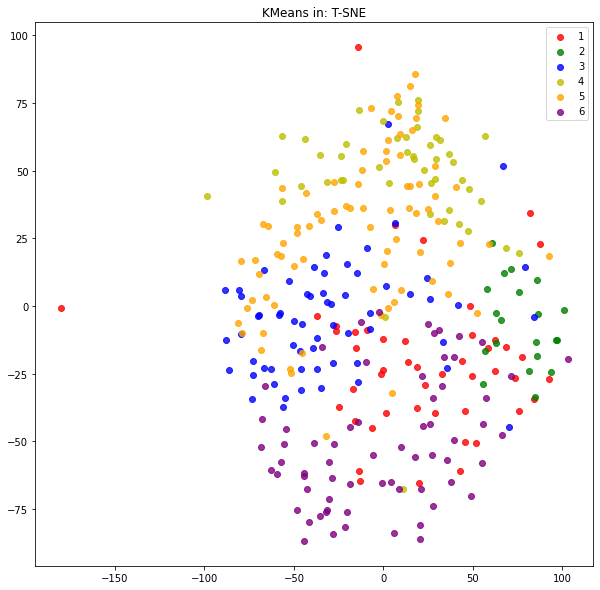

KMeans NMI:0.0537


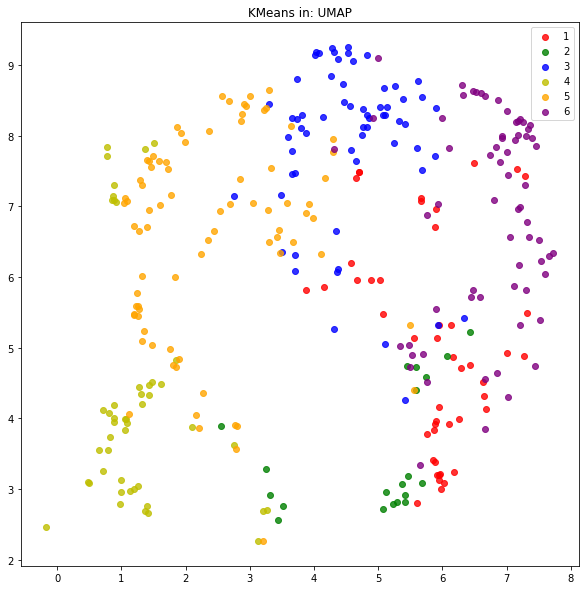

KMeans NMI:0.0537


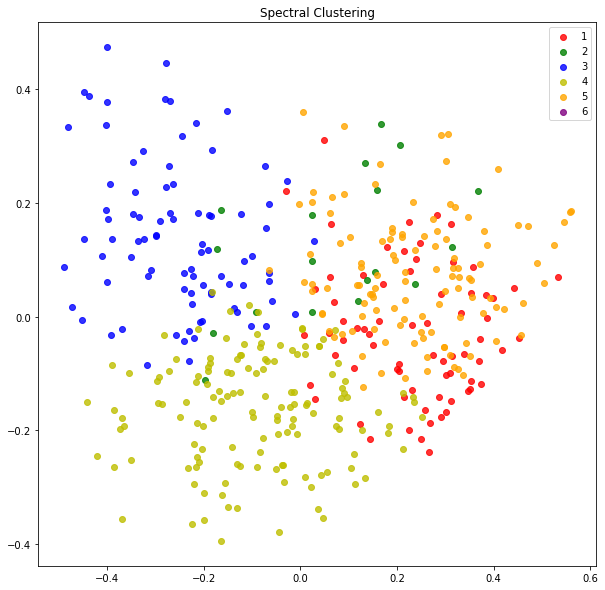

##################################
OPTICS


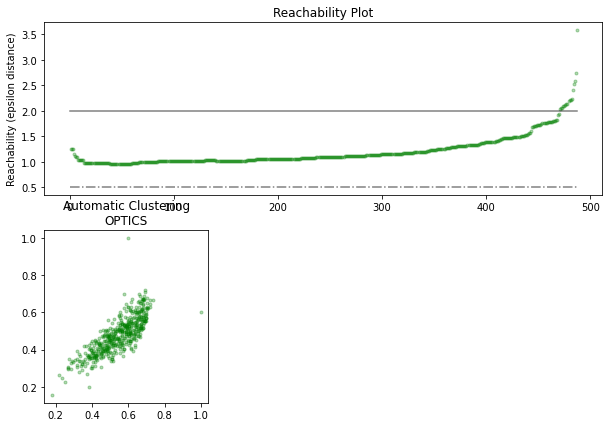

In [15]:
# Here we use the Wl kernel and for every WL iteration we apply DR and Clustering and evaluate 
# the clustering methods
# This is done on labeled and unlabeled dataset

for use_labels in [True, False]:
    if use_labels:
        base_path = os.path.join("kernels","node_labels")
        dataset = "ENZYMES"
    else:
        base_path = os.path.join("kernels","without_labels")
        dataset = "ENZYMES"
        
    print("##################################")
    print("Load from ", base_path)
    print("##################################")
    
    # dicts for storing nmi score
    nmis_kpca = {}
    nmis_tsvd = {}
    nmis_tsne = {}
    nmis_umap = {}
    nmis_spec = {}
    nmis_optics = {}
    
    
    nmis_kpca[dataset] = []
    nmis_tsvd[dataset] = []
    nmis_tsne[dataset] = []
    nmis_umap[dataset] = []
    nmis_spec[dataset] = []
    nmis_optics[dataset] = []
    
    # iterating over different Wl iterations
    for iterations in range(1,6):
        print("##################################")
        print("Dataset: ", dataset)
        print("Iteration: ", iterations)
        print("##################################")

        #--------------------------------------------
        # Load graph representation from the kernel
        #--------------------------------------------
        
        #Gram Matrix for the Weisfeiler-Lehman subtree kernel
        gram = load_csv(os.path.join(base_path,f"{dataset}_gram_matrix_wl{iterations}.csv"))
        gram = aux.normalize_gram_matrix(gram) # normalizing for dr
        gram = gram[indices_true[:, None], indices_true] #removing outliers


        #Sparse Vectors for the Weisfeiler-Lehmann subtree kernel
        vec = load_sparse(os.path.join(base_path,f"{dataset}_vectors_wl{iterations}.npz"))
        vec = vec[indices_true, :] #removing outliers
        vec = csc_matrix(vec, dtype=np.int8).toarray()
        print(gram.shape, vec.shape)

        #--------------------------------------------
        # Dimensionality Reduction
        #--------------------------------------------

        # SVD
        tsvd = TruncatedSVD(n_components=100)
        reduced_tsvd = tsvd.fit_transform(vec)
        plot_dr(reduced_tsvd, "TSVD", classes)

        # Kernel PCA
        kpca = KernelPCA(n_components=100, kernel="precomputed")
        reduced_kpca= kpca.fit_transform(gram)
        plot_dr(reduced_kpca, "Kernel PCA",classes)

        # T-SNE
        pca = TSNE(n_components=3)
        reduced_tnse =  pca.fit_transform(gram)
        plot_dr(reduced_tnse, "T-SNE",classes)
      
        
        # UMAP
        reducer = umap.UMAP()
        #scaled_gram = StandardScaler().fit_transform(gram)
        #embedding = reducer.fit_transform(scaled_gram)
        embedding = reducer.fit_transform(gram)
        plot_dr(embedding, "UMAP",classes)
        
        
        k = len(set(classes.tolist()))
        print("Number of labels: ", k)
        d = {0:"TSVD",1:"KPCA", 2:"T-SNE", 3:"UMAP",}
        n_d = {0:nmis_tsvd, 1:nmis_kpca, 2:nmis_tsne, 3:nmis_umap}
        
        for i, rep_i in enumerate([reduced_tsvd, reduced_kpca, reduced_tnse, embedding]):

            # KMeans
            kmeans = KMeans(n_clusters=10 ,random_state=0).fit(reduced_kpca)
            plot_dr(rep_i, "KMeans in: {0}".format(d[i]),kmeans.labels_)
            km_nmi = normalized_mutual_info_score(kmeans.labels_ , classes)
            n_d[i][dataset].append(km_nmi)
            print(f"KMeans NMI:{km_nmi:.4f}")  


        #Spectral Clustering
        spec = SpectralClustering(n_clusters=k, affinity="precomputed")
        spec.fit(gram)
        spec_nmi = normalized_mutual_info_score(spec.labels_,classes)
        plot_dr(reduced_kpca, "Spectral Clustering",spec.labels_)
        nmis_spec[dataset].append(spec_nmi) 
        print("##################################")
        
        # OPTICS
        print("OPTICS")
        clust = OPTICS(min_samples=50, xi=.05, min_cluster_size=.01)
        clust.fit(gram)
        labels_050 = cluster_optics_dbscan(reachability=clust.reachability_,
                                           core_distances=clust.core_distances_,
                                           ordering=clust.ordering_, eps=0.5)

        space = np.arange(len(gram))
        reachability = clust.reachability_[clust.ordering_]
        labels = clust.labels_[clust.ordering_]
        optics_nmi = normalized_mutual_info_score(clust.labels_, classes)
        nmis_optics[dataset].append(optics_nmi) 

        plt.figure(figsize=(10, 7))
        G = gridspec.GridSpec(2, 3)
        ax1 = plt.subplot(G[0, :])
        ax2 = plt.subplot(G[1, 0])

        # Reachability plot
        colors = ['g.', 'r.', 'b.', 'y.', 'c.']
        for klass, color in zip(range(0, 5), colors):
            Xk = space[labels == klass]
            Rk = reachability[labels == klass]
            ax1.plot(Xk, Rk, color, alpha=0.3)
        ax1.plot(space[labels == -1], reachability[labels == -1], 'k.', alpha=0.3)
        ax1.plot(space, np.full_like(space, 2., dtype=float), 'k-', alpha=0.5)
        ax1.plot(space, np.full_like(space, 0.5, dtype=float), 'k-.', alpha=0.5)
        ax1.set_ylabel('Reachability (epsilon distance)')
        ax1.set_title('Reachability Plot')

        # OPTICS - clusters
        colors = ['g.', 'r.', 'b.', 'y.', 'c.']
        for klass, color in zip(range(0, 5), colors):
            Xk = gram[clust.labels_ == klass]
            ax2.plot(Xk[:, 0], Xk[:, 1], color, alpha=0.3)
        ax2.plot(gram[clust.labels_ == -1, 0], gram[clust.labels_ == -1, 1], 'k+', alpha=0.1)
        ax2.set_title('Automatic Clustering\nOPTICS')

    
    res = {"KPCA":nmis_kpca,"TSVD": nmis_tsvd, "SPEC": nmis_spec,
           "OPTICS":nmis_optics, "TSNE":nmis_tsne, "UMAP": nmis_umap, }
    for key, value in res.items():
        nmi_df = pd.DataFrame(res[key])
        nmi_df.to_csv(os.path.join(base_path, key + ".csv"))


#################node_labels#################


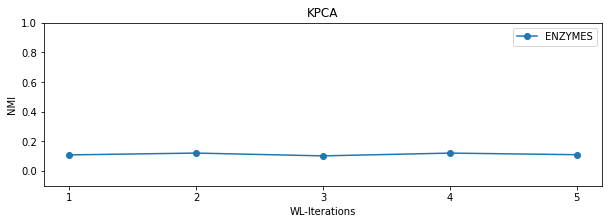

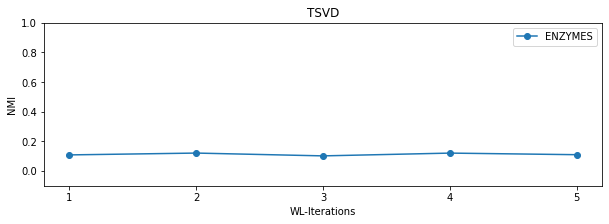

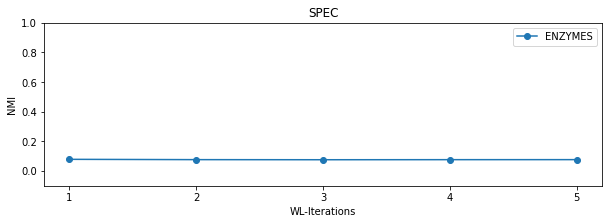

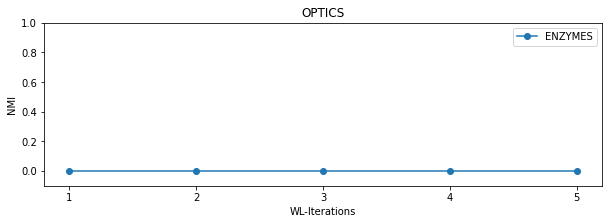

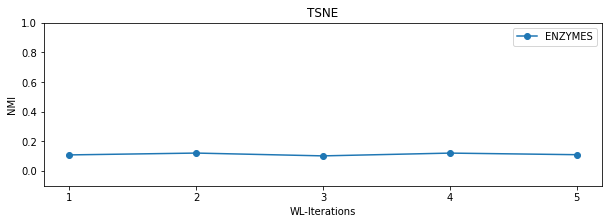

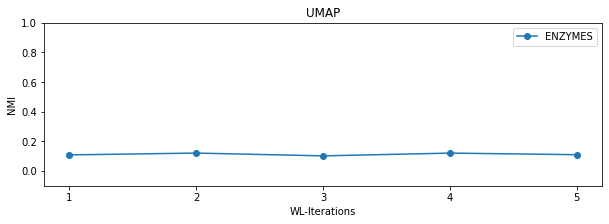

#################without_labels#################


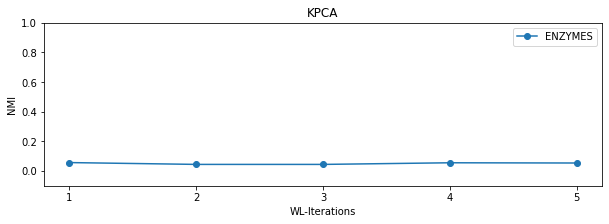

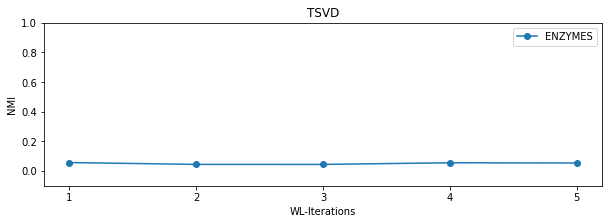

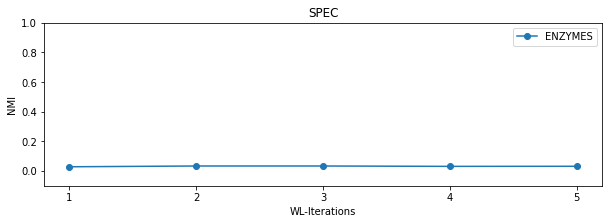

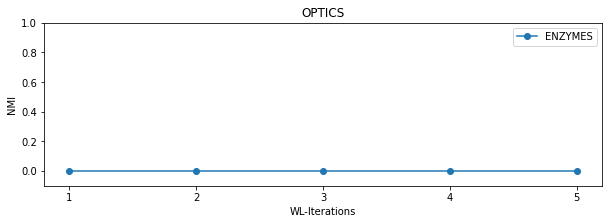

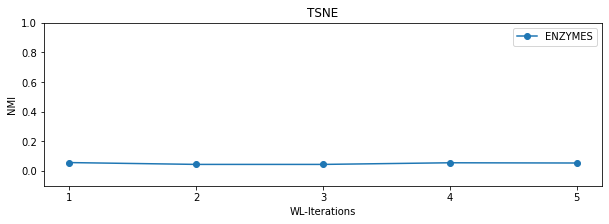

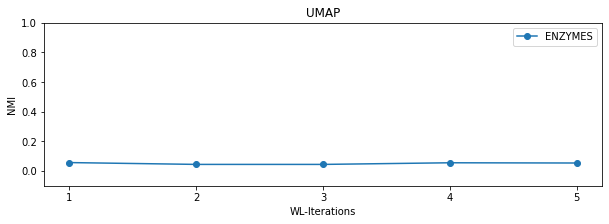

In [16]:
result_names = ["KPCA", "TSVD", "SPEC", "OPTICS", "TSNE", "UMAP"]
for version in ["node_labels", "without_labels"]:
    print(f"#################{version}#################")
    for name_i in result_names:
        path_i = os.path.join("kernels", version, name_i+".csv")
        nmi_df = pd.read_csv(path_i, index_col=0)
        fig, ax = plt.subplots(figsize=(10,3))
        ax.set_ylabel("NMI")
        ax.set_xlabel("WL-Iterations")
        ax.set_ylim([-0.1,1])
        ax.set_xticks([0,1,2,3,4])
        ax.set_xticklabels([1,2,3,4,5])
        ax.set_title(name_i)
        nmi_df.plot(marker="o", ax=ax)
        plt.show();

We can notice that the clustering results are a bit better in iteration 2 and 4 e.g. in kMeans clustering with UMAP, TSNE, kPCA. We will therefore use iteration 4 for our next part of the analysis.

Lets visualize the WL4  DR representations.

(488, 488) (488, 59599)


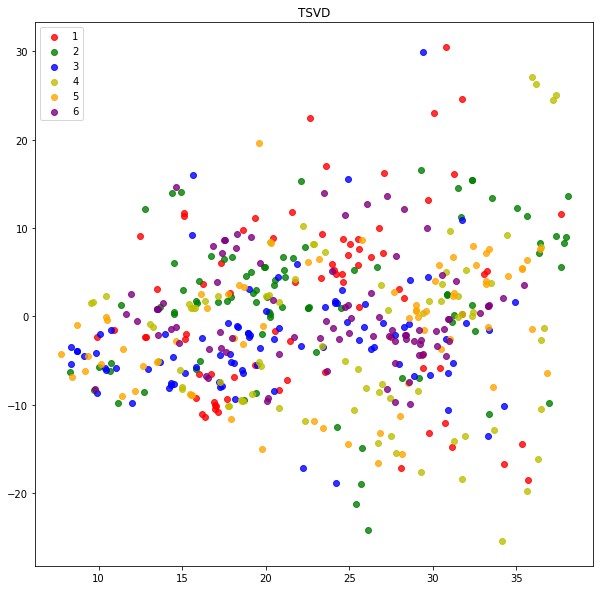

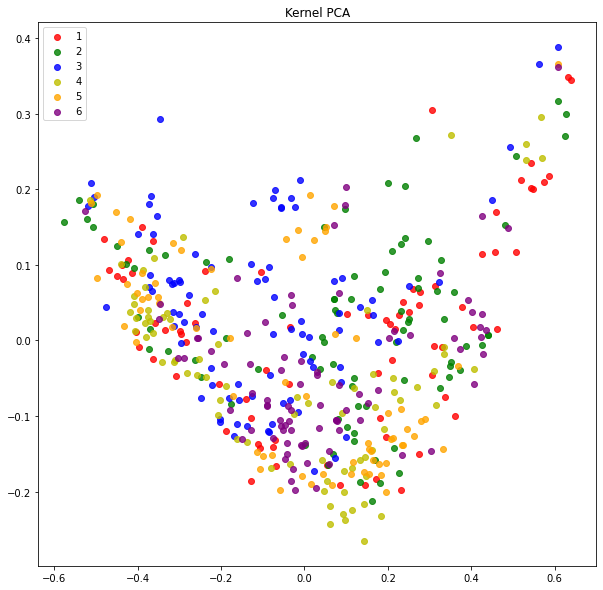

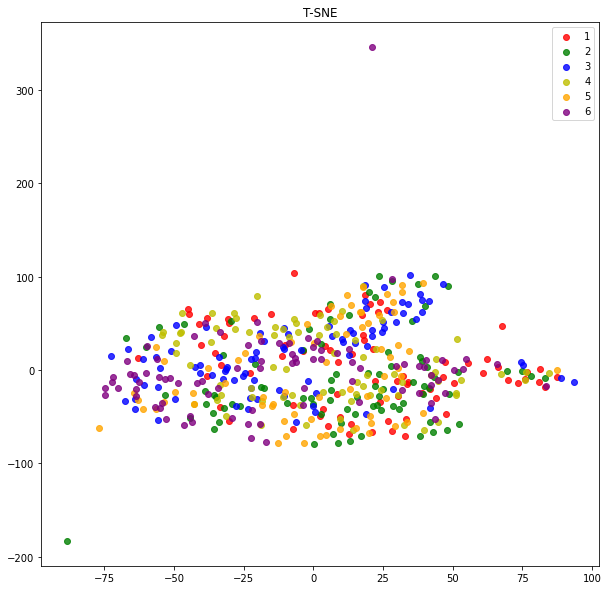

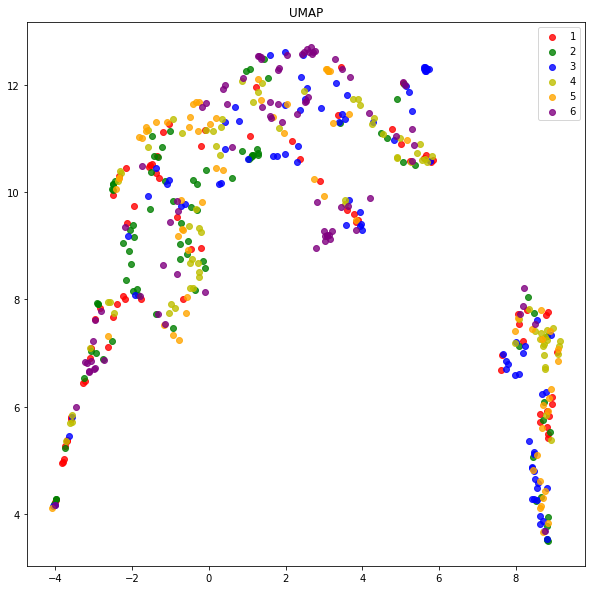

In [17]:
# triyng different iterations
dataset = "ENZYMES"
iterations = 4
base_path = os.path.join("kernels","node_labels")
#base_path = os.path.join("kernels","without_labels")
classes = dp.get_dataset(dataset)
classes = classes[indices_true]
#--------------------------------------------
# Load graph representation from the kernel
#--------------------------------------------

#Gram Matrix for the Weisfeiler-Lehman subtree kernel
gram = load_csv(os.path.join(base_path,f"{dataset}_gram_matrix_wl{iterations}.csv"))
gram = aux.normalize_gram_matrix(gram)
gram = gram[indices_true[:, None], indices_true] #removing outliers


#Sparse Vectors for the Weisfeiler-Lehmann subtree kernel
vec = load_sparse(os.path.join(base_path,f"{dataset}_vectors_wl{iterations}.npz"))
vec = vec[indices_true, :] #removing outliers
vec = csc_matrix(vec, dtype=np.int8).toarray()
print(gram.shape, vec.shape)

# SVD
tsvd = TruncatedSVD(n_components=50)
reduced_tsvd = tsvd.fit_transform(vec)
plot_dr(reduced_tsvd, "TSVD", classes)

# Kernel PCA
kpca = KernelPCA(n_components=100, kernel="precomputed")
reduced_kpca= kpca.fit_transform(gram)
plot_dr(reduced_kpca, "Kernel PCA",classes)

# T-SNE

pca = TSNE(n_components=3)
reduced_tsne =  pca.fit_transform(gram)
plot_dr(reduced_tsne, "T-SNE",classes)

# UMAP
reducer = umap.UMAP()
scaled_gram = StandardScaler().fit_transform(gram)
embedding = reducer.fit_transform(scaled_gram)
plot_dr(embedding, "UMAP",classes)

## Clustering Evaluation

##################################
Dataset:  ENZYMES
Iteration:  4
##################################
(488, 488) (488, 59599)


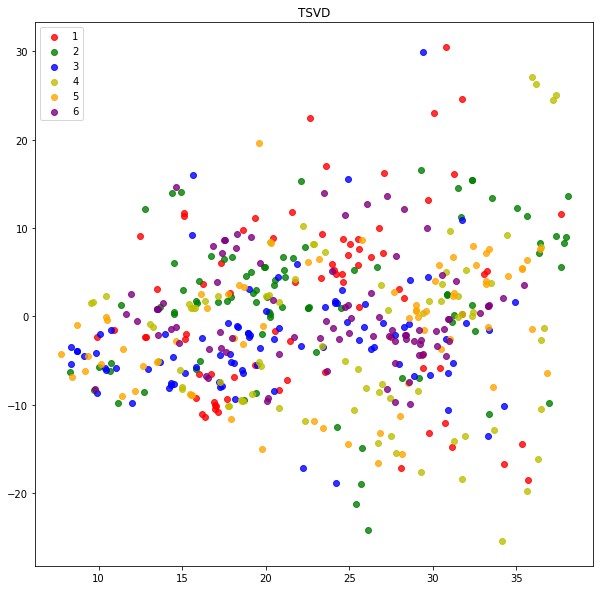

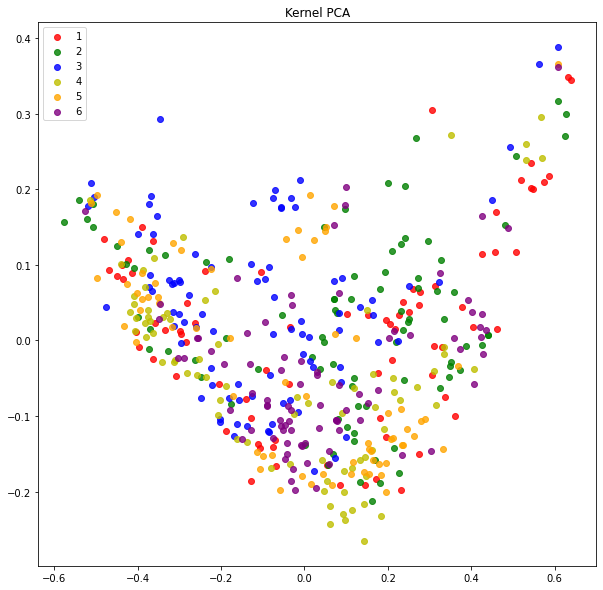

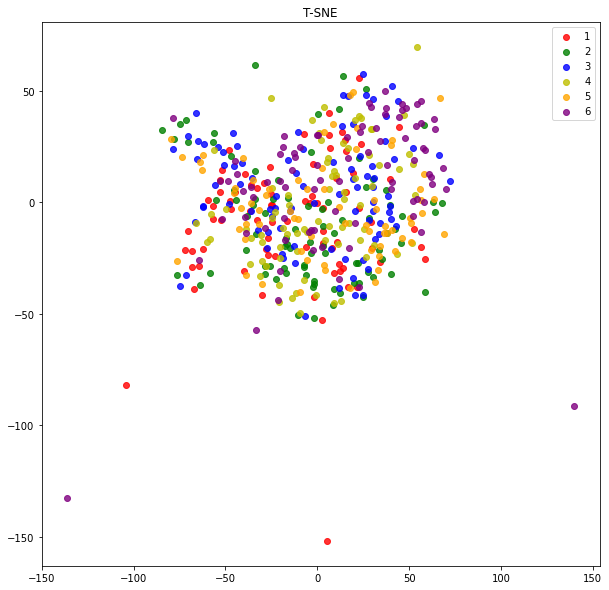

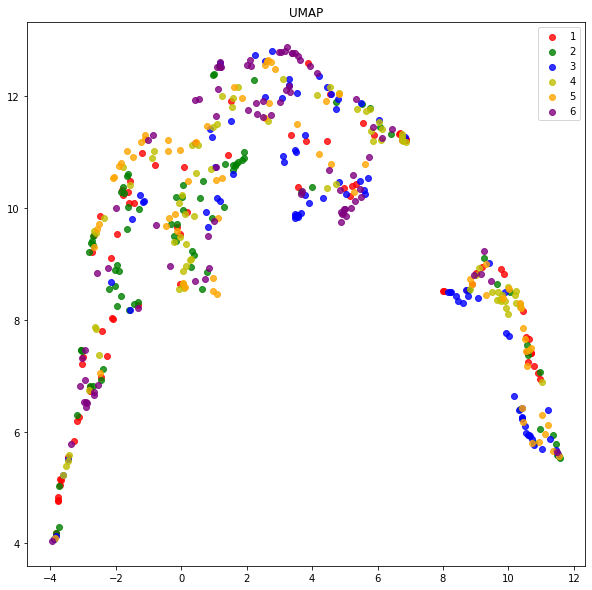

Number of labels:  6
TSVD
KMeans


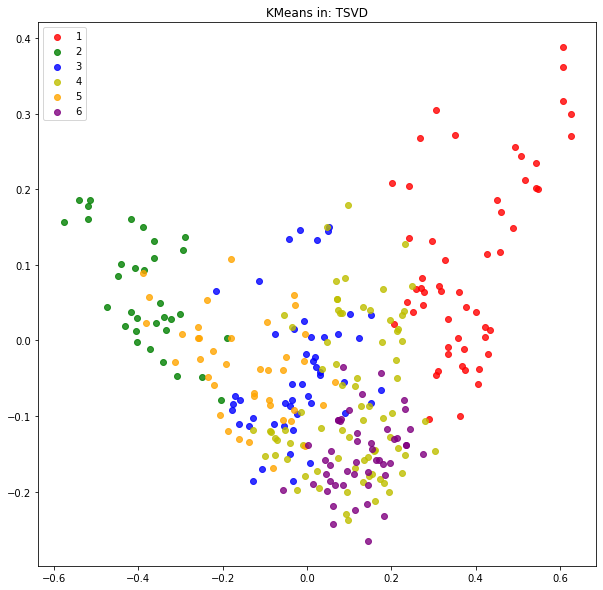

KMeans NMI:0.0923
KPCA
KMeans


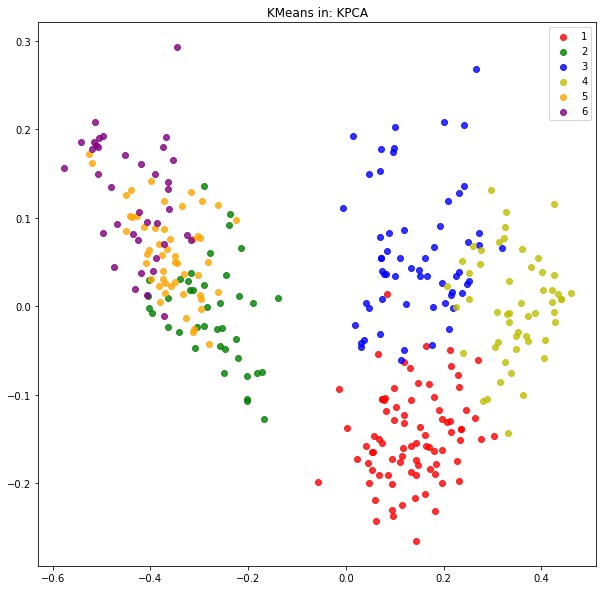

KMeans NMI:0.1205
T-SNE
KMeans


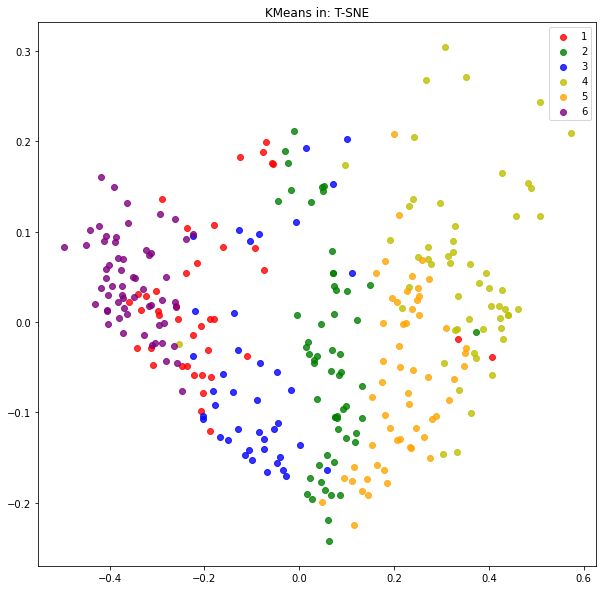

KMeans NMI:0.0979
UMAP
KMeans


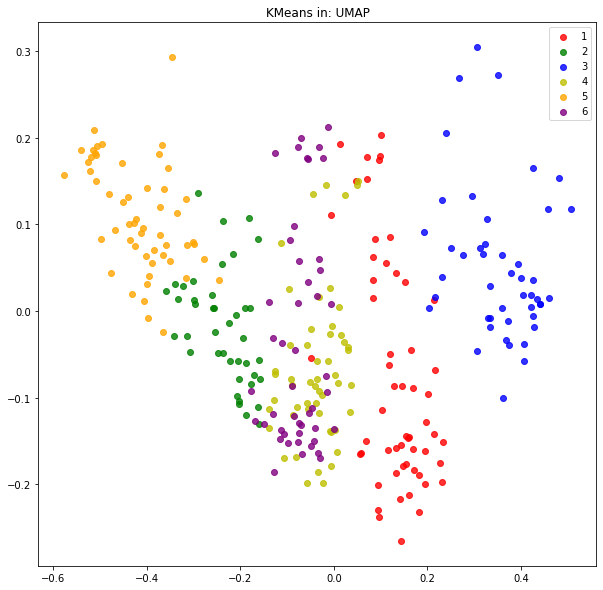

KMeans NMI:0.0968


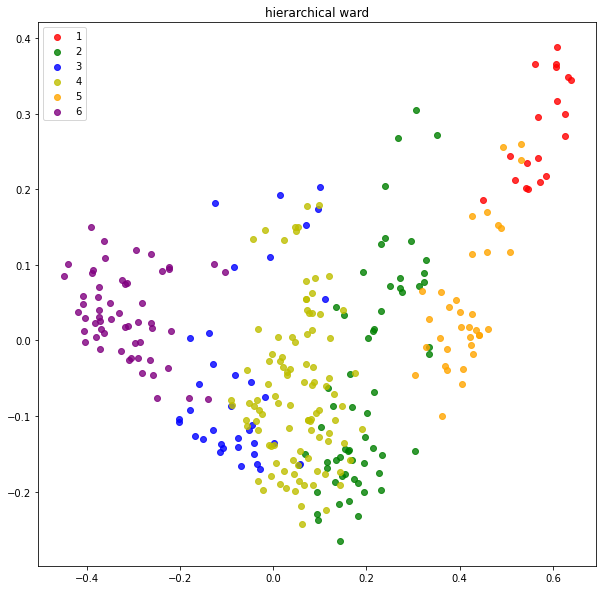

H clustering NMI:0.0956


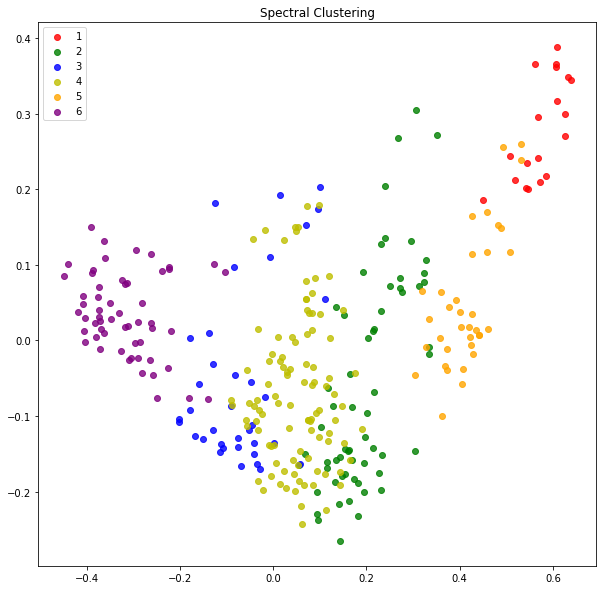

##################################
OPTICS
optics nmi:  0.13358307709649445


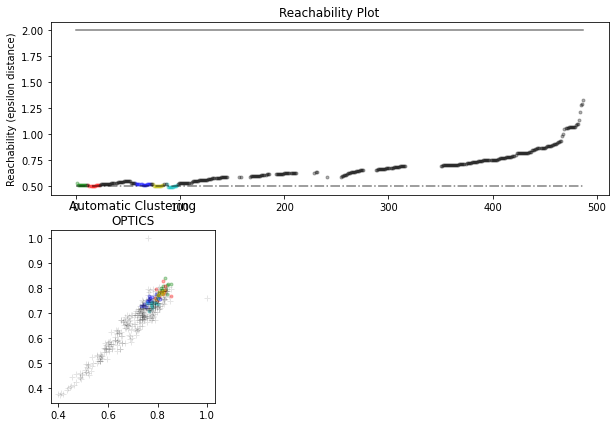

HISC
Running HiSC, input dataset has 488 entries with 488 dimensions
0.025576301418530626al structure |████████████████████| 100.0% complete


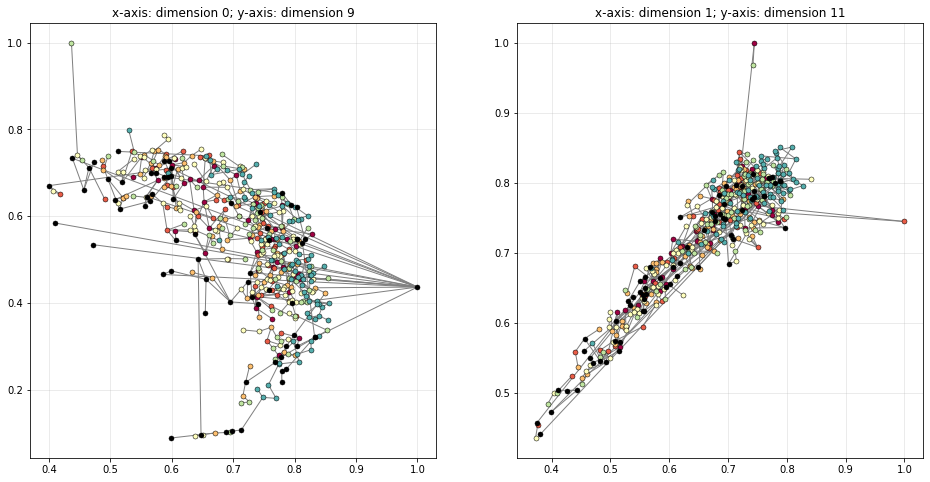

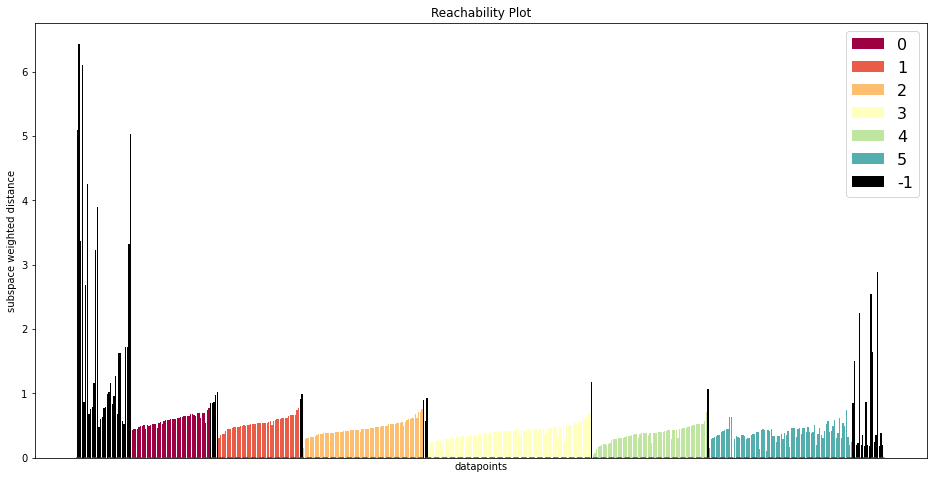

In [18]:
dataset = "ENZYMES"
iterations = 4
base_path = os.path.join("kernels","node_labels")
#base_path = os.path.join("kernels","without_labels")
classes = dp.get_dataset(dataset)
classes = classes[indices_true]

# dicts for storing nmi score
nmis_kpca = {}
nmis_tsvd = {}
nmis_tsne = {}
nmis_umap = {}
nmis_spec = {}
nmis_optics = {}
nmis_hier = {}
nmis_hisc = {}


nmis_kpca[dataset] = []
nmis_tsvd[dataset] = []
nmis_tsne[dataset] = []
nmis_umap[dataset] = []
nmis_spec[dataset] = []
nmis_optics[dataset] = []
nmis_hier[dataset] = []
nmis_hisc[dataset] = []


iterations = 4
print("##################################")
print("Dataset: ", dataset)
print("Iteration: ", iterations)
print("##################################")

#--------------------------------------------
# Load graph representation from the kernel
#--------------------------------------------

#Gram Matrix for the Weisfeiler-Lehman subtree kernel
gram = load_csv(os.path.join(base_path,f"{dataset}_gram_matrix_wl{iterations}.csv"))
gram = aux.normalize_gram_matrix(gram) # normalizing for dr
gram = gram[indices_true[:, None], indices_true] #removing outliers


#Sparse Vectors for the Weisfeiler-Lehmann subtree kernel
vec = load_sparse(os.path.join(base_path,f"{dataset}_vectors_wl{iterations}.npz"))
vec = vec[indices_true, :] #removing outliers
vec = csc_matrix(vec, dtype=np.int8).toarray()
print(gram.shape, vec.shape)

#--------------------------------------------
# Dimensionality Reduction
#--------------------------------------------

# SVD
tsvd = TruncatedSVD(n_components=100)
reduced_tsvd = tsvd.fit_transform(vec)
plot_dr(reduced_tsvd, "TSVD", classes)

# Kernel PCA
kpca = KernelPCA(n_components=100, kernel="precomputed")
reduced_kpca= kpca.fit_transform(gram)
plot_dr(reduced_kpca, "Kernel PCA",classes)

# T-SNE
pca = TSNE(n_components=3)
reduced_tnse =  pca.fit_transform(gram)
plot_dr(reduced_tnse, "T-SNE",classes)


# UMAP
reducer = umap.UMAP()
#scaled_gram = StandardScaler().fit_transform(gram)
#embedding = reducer.fit_transform(scaled_gram)
embedding = reducer.fit_transform(gram)
plot_dr(embedding, "UMAP",classes)


k = len(set(classes.tolist()))
print("Number of labels: ", k)
d = {0:"TSVD",1:"KPCA", 2:"T-SNE", 3:"UMAP",}
n_d = {0:nmis_tsvd, 1:nmis_kpca, 2:nmis_tsne, 3:nmis_umap}

for i, rep_i in enumerate([reduced_tsvd, reduced_kpca, reduced_tnse, embedding]):
    print(d[i])


    # KMeans
    print("KMeans")
    kmeans = KMeans(n_clusters=10 ,random_state=0).fit(rep_i)
    plot_dr(reduced_kpca, "KMeans in: {0}".format(d[i]),kmeans.labels_)
    km_nmi = normalized_mutual_info_score(kmeans.labels_ , classes)
    n_d[i][dataset].append(km_nmi)
    print(f"KMeans NMI:{km_nmi:.4f}")  



# Hierarchical clustering
clustering = AgglomerativeClustering(n_clusters=10, linkage="ward").fit(gram)
hc_nmi = normalized_mutual_info_score(clustering.labels_ , classes)
nmis_hier[dataset].append(hc_nmi)
plot_dr(reduced_kpca, "hierarchical ward",clustering.labels_)
print(f"H clustering NMI:{hc_nmi:.4f}")



#Spectral Clustering
spec = SpectralClustering(n_clusters=k, affinity="precomputed")
spec.fit(gram)
spec_nmi = normalized_mutual_info_score(spec.labels_,classes)
plot_dr(reduced_kpca, "Spectral Clustering",clustering.labels_)
nmis_spec[dataset].append(spec_nmi) 
print("##################################")

# OPTICS
print("OPTICS")
clust = OPTICS(min_samples=10, xi=.001, min_cluster_size=.01)
clust.fit(gram)
labels_050 = cluster_optics_dbscan(reachability=clust.reachability_,
                                   core_distances=clust.core_distances_,
                                   ordering=clust.ordering_, eps=0.5)

space = np.arange(len(gram))
reachability = clust.reachability_[clust.ordering_]
labels = clust.labels_[clust.ordering_]
optics_nmi = normalized_mutual_info_score(clust.labels_, classes)
print("optics nmi: ", optics_nmi)
nmis_optics[dataset].append(optics_nmi) 

plt.figure(figsize=(10, 7))
G = gridspec.GridSpec(2, 3)
ax1 = plt.subplot(G[0, :])
ax2 = plt.subplot(G[1, 0])

# Reachability plot
colors = ['g.', 'r.', 'b.', 'y.', 'c.']
for klass, color in zip(range(0, 5), colors):
    Xk = space[labels == klass]
    Rk = reachability[labels == klass]
    ax1.plot(Xk, Rk, color, alpha=0.3)
ax1.plot(space[labels == -1], reachability[labels == -1], 'k.', alpha=0.3)
ax1.plot(space, np.full_like(space, 2., dtype=float), 'k-', alpha=0.5)
ax1.plot(space, np.full_like(space, 0.5, dtype=float), 'k-.', alpha=0.5)
ax1.set_ylabel('Reachability (epsilon distance)')
ax1.set_title('Reachability Plot')

# OPTICS - clusters
colors = ['g.', 'r.', 'b.', 'y.', 'c.']
for klass, color in zip(range(0, 5), colors):
    Xk = gram[clust.labels_ == klass]
    ax2.plot(Xk[:, 0], Xk[:, 1], color, alpha=0.3)
ax2.plot(gram[clust.labels_ == -1, 0], gram[clust.labels_ == -1, 1], 'k+', alpha=0.1)
ax2.set_title('Automatic Clustering\nOPTICS')
plt.show()

# self-implemented HiSC
print("HISC")
gram = load_csv("./kernels/node_labels/ENZYMES_gram_matrix_wl4.csv")
gram = aux.normalize_gram_matrix(gram)
gram = gram[indices_true[:, None], indices_true] 

label_file = load_csv("../tud_benchmark/datasets/ENZYMES/ENZYMES/raw/ENZYMES_graph_labels.txt")[indices_true]
label_file = label_file.astype(int)
np.savetxt("./kernels/node_labels/ENZYMES_gram_matrix_wl4_filtered.csv", gram, delimiter=";")
np.savetxt("../tud_benchmark/datasets/ENZYMES/ENZYMES/raw/ENZYMES_graph_labels_filtered.txt", label_file,
           fmt="%d",newline="\n")
dataset_file = "./kernels/node_labels/ENZYMES_gram_matrix_wl4_filtered.csv"
label_file = "../tud_benchmark/datasets/ENZYMES/ENZYMES/raw/ENZYMES_graph_labels_filtered.txt"

data, labels_true = process_csv(dataset_file, input_filename_labels=label_file, sep=";")

alpha = 0.007
k = 4
clus_ord = HiSC(data, alpha, k, verbose=False, elki=True)
threshold=0.8
dimensions=[(0,9),(1,11)]

labels = get_clusters(clus_ord, threshold=threshold)

hisc_nmi = normalized_mutual_info_score(labels, classes)
print(hisc_nmi)
nmis_hisc[dataset].append(hisc_nmi) 

reachability_plot(data, clus_ord, labels, dimensions=dimensions)




res = {"KPCA":nmis_kpca,"TSVD": nmis_tsvd, "SPEC": nmis_spec,
       "OPTICS":nmis_optics, "TSNE":nmis_tsne, "UMAP": nmis_umap, "HIER": nmis_hier,
      "HISC": nmis_hisc}
for key, value in res.items():
    nmi_df = pd.DataFrame(res[key])
    nmi_df.to_csv(os.path.join(base_path, key + ".csv"))

#################node_labels#################


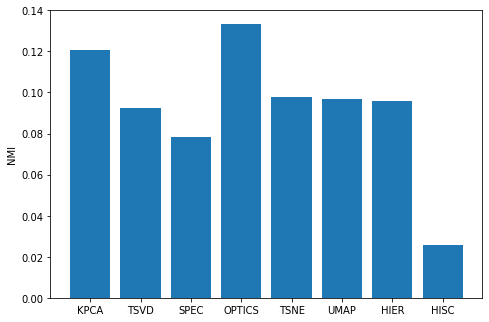

In [19]:
result_names = ["KPCA", "TSVD", "SPEC", "OPTICS", "TSNE", "UMAP", "HIER", "HISC"]
version = "node_labels"
#version = "without_labels"

nmis = []
print(f"#################{version}#################")
for name_i in result_names:
    path_i = os.path.join("kernels", version, name_i+".csv")

    nmi_df = pd.read_csv(path_i, index_col=0)
    nmis.append(float(nmi_df.values[0]))

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(result_names,nmis)
ax.set_ylabel('NMI')
plt.show()    


We notice that most of the clusters do not represent the ground truth labels with any clustering method.
For the next part we will only use kmeans clustering as its NMI is descent.

## Interpreting DR and Clusters found in UMAP

In [20]:

costs = []
kmeans_runs = []
k_list = [1, 2, 5, 10, 15, 20, 25, 30, 35, 40]
for k in k_list:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(embedding)
    costs.append(kmeans.inertia_)
    kmeans_runs.append(deepcopy(kmeans))


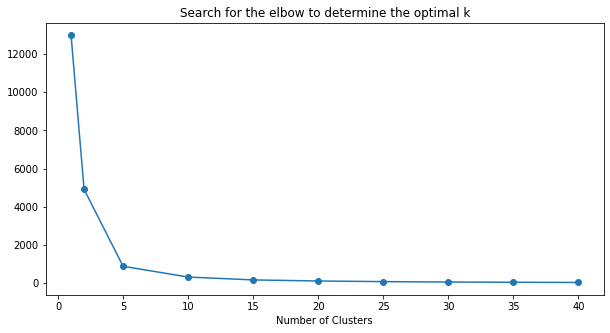

In [21]:
def scree_plot(k_list, costs):
    plt.figure(figsize=(10,5))
    plt.plot(k_list, costs, marker="o")
    plt.xlabel('Number of Clusters')
  #  plt.ylabel('KMeans loss')
    plt.title('Search for the elbow to determine the optimal k')
    plt.show();
scree_plot(k_list, costs)

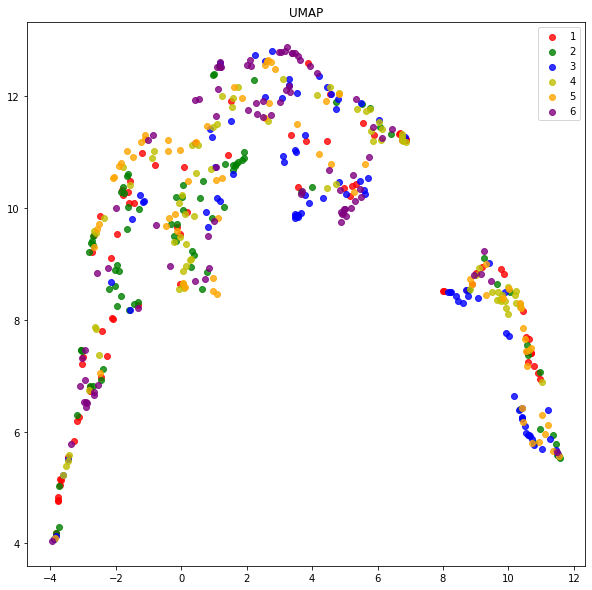

KMeans


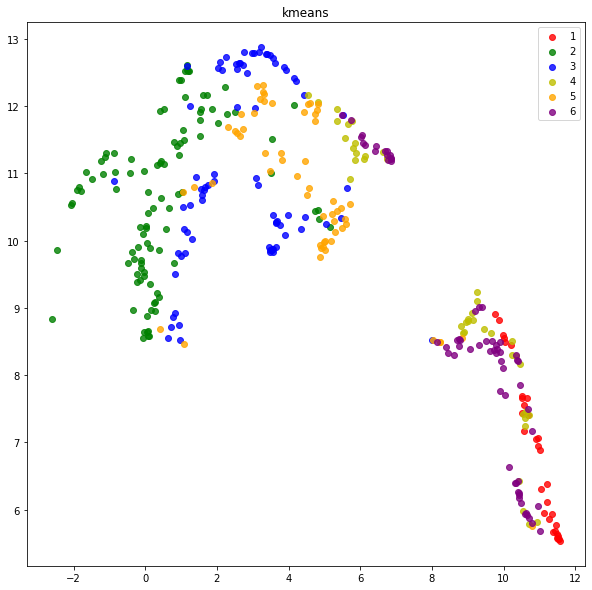

In [22]:
plot_dr(embedding, "UMAP" ,classes)
plt.show();

# Instantiate the clustering model
kmeans = KMeans(n_clusters=8)
kmeans.fit(reduced_kpca)
print("KMeans")

plot_dr(embedding, "kmeans",kmeans.labels_)


In [23]:
# select first 2 nearest neighbours in for each cluster
nr_nearest = 2
nearest_indices = []
for cluster_i in set(kmeans.labels_):
    mask = (kmeans.labels_ == cluster_i)
    selection = reduced_kpca[mask]
    print(f"number of data points in cluster {cluster_i}: {selection.shape[0]}")
    center_i = kmeans.cluster_centers_[cluster_i].reshape(1,-1)
    distances_i = pairwise_distances(center_i, reduced_kpca)
    nearest_indices.append(np.argsort(distances_i, )[0][0:nr_nearest])
    print(f"Nearest data points in cluster {cluster_i}: {nearest_indices[-1]}")

number of data points in cluster 0: 84
Nearest data points in cluster 0: [233 240]
number of data points in cluster 1: 32
Nearest data points in cluster 1: [455 319]
number of data points in cluster 2: 100
Nearest data points in cluster 2: [276 133]
number of data points in cluster 3: 78
Nearest data points in cluster 3: [ 66 333]
number of data points in cluster 4: 42
Nearest data points in cluster 4: [475 409]
number of data points in cluster 5: 58
Nearest data points in cluster 5: [ 72 192]
number of data points in cluster 6: 64
Nearest data points in cluster 6: [485 481]
number of data points in cluster 7: 30
Nearest data points in cluster 7: [463 462]


Cluster 0, Indices [233 240]



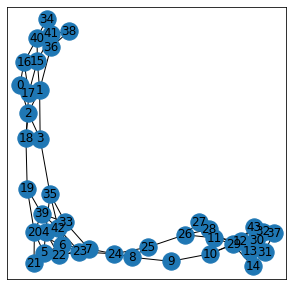

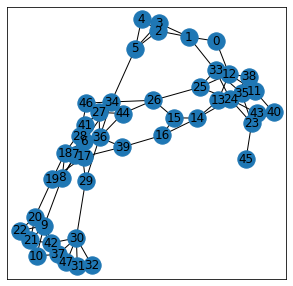

Cluster 1, Indices [455 319]



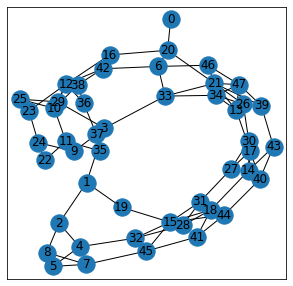

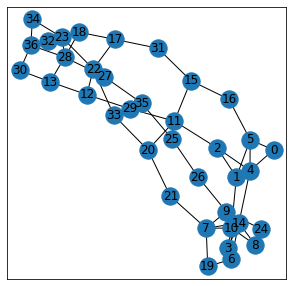

Cluster 2, Indices [276 133]



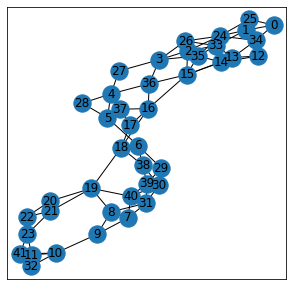

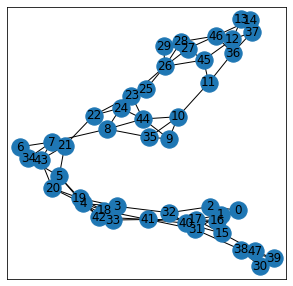

Cluster 3, Indices [ 66 333]



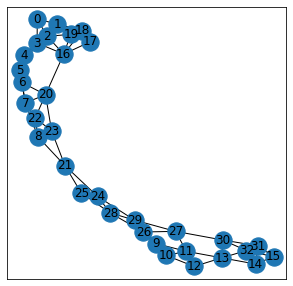

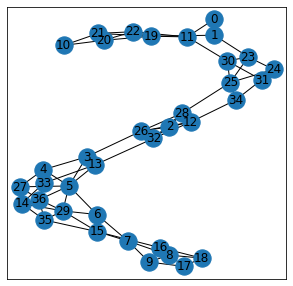

Cluster 4, Indices [475 409]



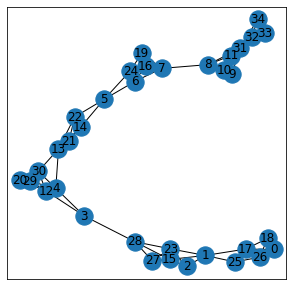

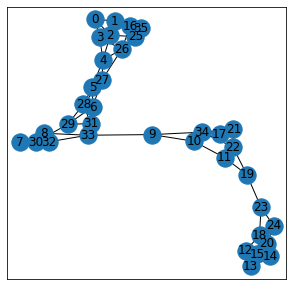

Cluster 5, Indices [ 72 192]



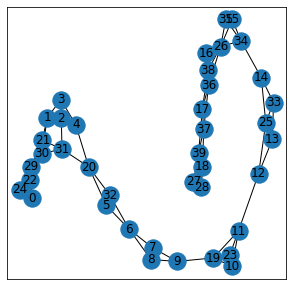

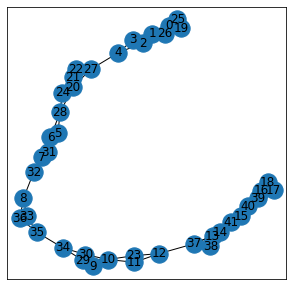

Cluster 6, Indices [485 481]



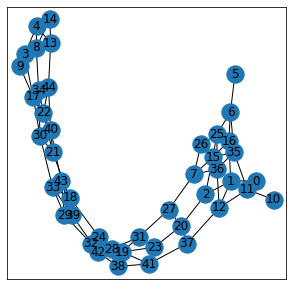

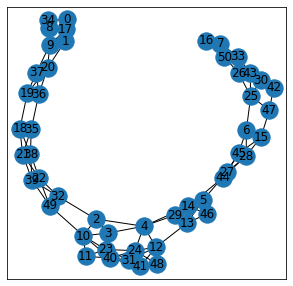

Cluster 7, Indices [463 462]



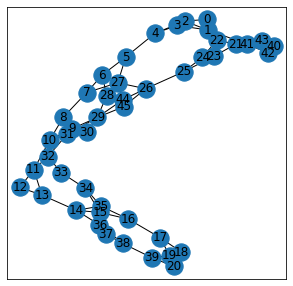

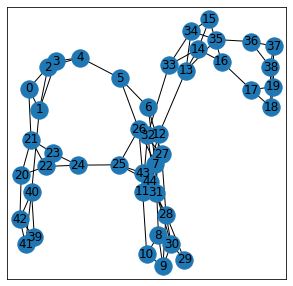

In [24]:
for i, indices in enumerate(nearest_indices):
    print(f"Cluster {i}, Indices {indices}")
    G_selected = select_from_list(G_filtered, indices)
    for g_i in G_selected:
        print(g_i)
        visualize(g_i)

We can see that the clusters are strongly driven by the graph structure and not by ground truth labels

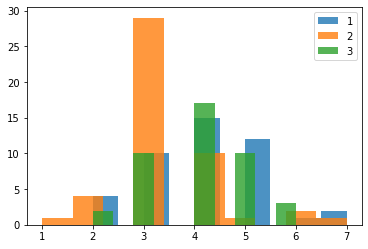

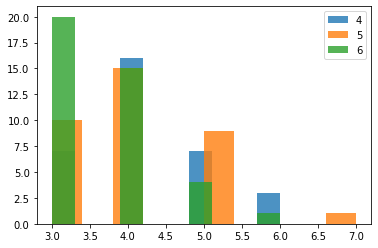

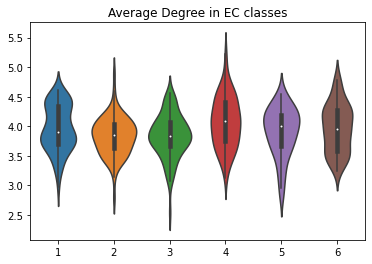

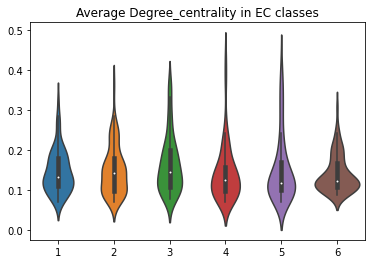

In [26]:
def plot_degree_dist(G, labels):
    degrees= []
    for graph, label in zip(G, labels):
        degrees = [graph.degree(n) for n in graph.nodes()]
        plt.hist(degrees, alpha=0.8, label=label,bins= 10)
    plt.legend()
    plt.show()
    

graph_centers = []
for i, indices in enumerate(nearest_indices):
    G_selected = select_from_list(G_filtered, indices)
    graph_centers.append(G_selected[0])
    
plot_degree_dist(graph_centers[0:3], labels = ["1", "2", "3"])
plot_degree_dist(graph_centers[3:6], labels = ["4", "5", "6"])


avg_degree= []
for graph in G_filtered:
    degrees = [graph.degree(n) for n in graph.nodes()]
    avg= sum(degrees)/len(degrees)
    avg_degree.append(avg)
    

avg_centrality= []
for graph in G_filtered:
    degrees = nx.degree_centrality(graph)
    avg= sum(degrees.values())/len(degrees)
    avg_centrality.append(avg)

ax = sns.violinplot(x=classes, y=avg_degree)
plt.title("Average Degree in EC classes")
plt.show()

ax = sns.violinplot(x=classes, y=avg_centrality)
plt.title("Average Degree_centrality in EC classes")
plt.show()

We can see that the EC classes have different degree distributions

## Analyzing the labels

In [27]:
G = tud_to_networkx(dataset)
class1_index = []
class2_index = []
class3_index = []
class4_index = []
class5_index = []
class6_index = []

for ind in classes:
    if ind == 1:
        class1_index.append(ind)

    if ind == 2:
        class2_index.append(ind)

    if ind == 3:
        class3_index.append(ind)

    if ind == 4:
        class4_index.append(ind)

    if ind == 5:
        class5_index.append(ind)

    if ind == 6:
        class6_index.append(ind)

ec_classes = [class1_index, class2_index, class3_index, class4_index, class5_index, class6_index]
     

EC1


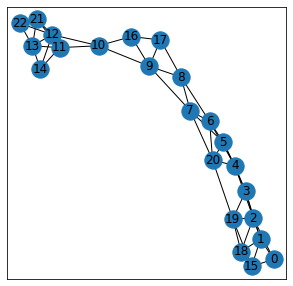

EC2


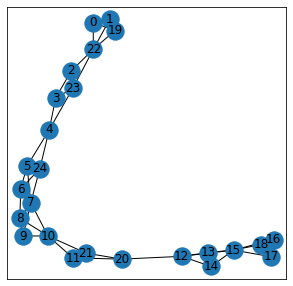

EC3


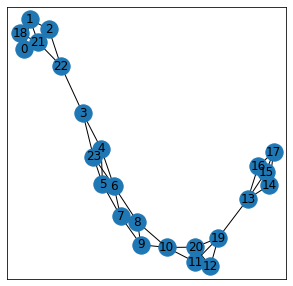

EC4


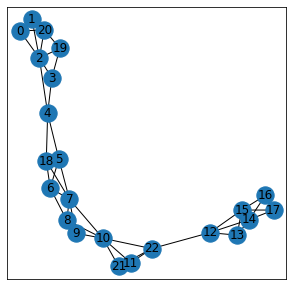

EC5


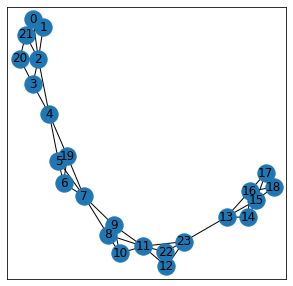

EC6


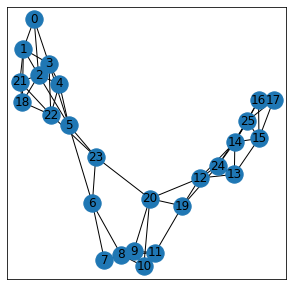

In [28]:
labels = ["EC1", "EC2", "EC3", "EC4", "EC5", "EC6"]

for label, ec in zip(labels, ec_classes):
    print(label)
    
    visualize(G_filtered[ec[10]])


In [29]:
def get_label(G, attribute):
    data = []
    for graph in G:
        g_data = 0
        for node in range(0, len(graph)):
            g_data += (graph.nodes.data()[node][attribute][0])
           
        data.append(g_data/len(graph))
    return(data)

def get_property(G, attribute, index):
    data = []
    for gid, graph in enumerate(G):
        g_data = 0
        for node in range(0, len(graph)):
            g_data += graph.nodes.data()[node][attribute][index]
        data.append(g_data/len(graph))

    return(data)

def get_EC(G):
    data  = []
    
    for i in range(0, len(classes)):
        data.append(classes[i])
    return data

    

In [30]:
data = {'Node_label': get_label(G_filtered, "labels"),
        'AA_length': get_property(G_filtered, "attributes", 0),
         'low Waals': get_property(G_filtered, "attributes", 1),
         'med Waals': get_property(G_filtered, "attributes", 2),
         'high Waals': get_property(G_filtered, "attributes", 3),
         'low Hydro': get_property(G_filtered, "attributes", 4),
         'med Hydro': get_property(G_filtered, "attributes", 5),
         'high Hydro': get_property(G_filtered, "attributes", 6),
         'low Polarity': get_property(G_filtered, "attributes", 7),
         'med Polarity': get_property(G_filtered, "attributes", 8),
         'high Polarity': get_property(G_filtered, "attributes", 9),
         'low Polariz': get_property(G_filtered, "attributes", 10),
         'med Polariz': get_property(G_filtered, "attributes", 11),
         'high Polariz': get_property(G_filtered, "attributes", 12),
         '3d length': get_property(G_filtered, "attributes", 13),
         'Total Waals': get_property(G_filtered, "attributes", 14),
         'Total Hydro': get_property(G_filtered, "attributes", 15),
         'Total Polarity': get_property(G_filtered, "attributes", 16),
            'Total Polariz': get_property(G_filtered, "attributes", 17),
        'Avg_degree': avg_degree, 'Avg_degree_centrality': avg_centrality
       } 

df = pd.DataFrame(data)
df.head()

,Node_label,AA_length,low Waals,med Waals,high Waals,low Hydro,med Hydro,high Hydro,low Polarity,med Polarity,...,low Polariz,med Polariz,high Polariz,3d length,Total Waals,Total Hydro,Total Polarity,Total Polariz,Avg_degree,Avg_degree_centrality
0,1.351351,7.756757,12.753363,28.328919,0.921081,1.299595,64.213514,2.189189,3.405405,2.162162,...,2.405405,2.756757,3.027027,2.027027,2.702703,1.864865,3.729730,2.162162,4.540541,0.126126
1,1.347826,9.434783,15.357012,35.580870,1.813913,1.626304,79.643478,2.217391,4.217391,3.000000,...,2.565217,3.391304,3.913043,1.739130,3.782609,1.913043,4.521739,3.000000,4.434783,0.201581
2,1.240000,9.240000,14.165496,33.696000,0.684400,1.541600,78.580000,2.600000,4.160000,2.480000,...,2.800000,3.160000,3.560000,2.080000,3.600000,2.400000,4.360000,2.480000,3.680000,0.153333
3,1.250000,8.875000,13.915350,32.902083,0.568750,1.501792,75.883333,2.416667,4.041667,2.416667,...,2.583333,3.000000,3.416667,1.875000,3.583333,2.250000,4.208333,2.416667,3.750000,0.163043
4,1.217391,9.913043,15.458343,36.126957,0.715217,1.651348,84.521739,2.826087,4.391304,2.695652,...,3.000000,3.391304,3.826087,2.217391,3.869565,2.608696,4.608696,2.695652,3.913043,0.177866


## Featureplots

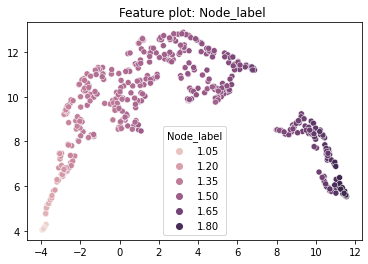

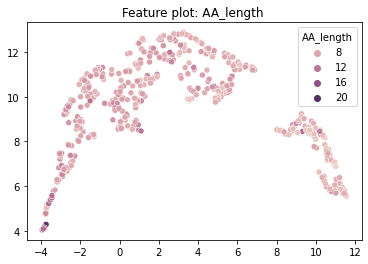

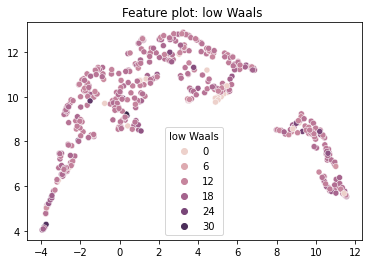

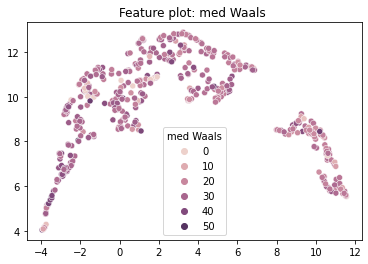

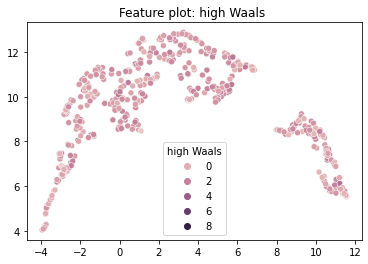

...

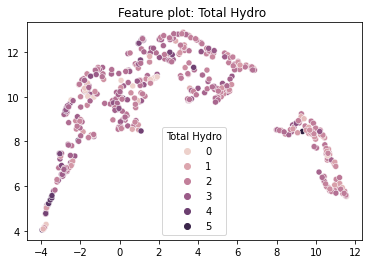

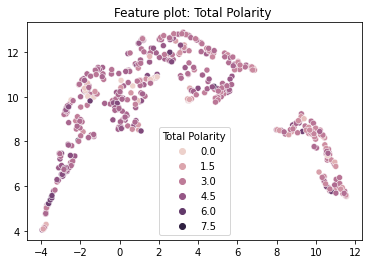

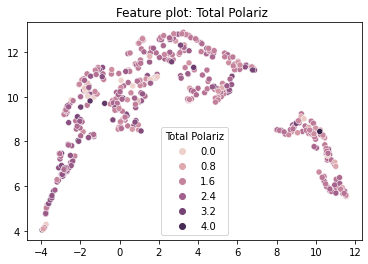

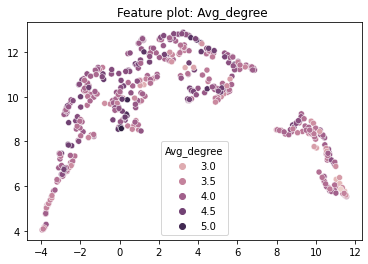

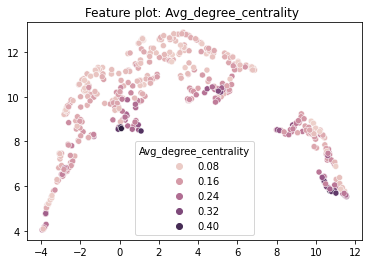

In [31]:
for feature in df.columns:
    sns.scatterplot(data=df, x=np.array(embedding[:,0]), y=np.array(embedding[:,1]), hue=feature, )
    plt.title("Feature plot: {} ".format(feature))
    plt.show()

We can notice that the Node_label has a strong effect on our vector representation

In [32]:
x = df.values #returns a numpy array
#df = preprocessing.normalize(x)
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df = pd.DataFrame(x_scaled, columns= df.columns)

data_norm= StandardScaler().fit_transform(x)

df.head()

,Node_label,AA_length,low Waals,med Waals,high Waals,low Hydro,med Hydro,high Hydro,low Polarity,med Polarity,...,low Polariz,med Polariz,high Polariz,3d length,Total Waals,Total Hydro,Total Polarity,Total Polariz,Avg_degree,Avg_degree_centrality
0,0.392687,0.178778,0.373598,0.476537,0.246369,0.465153,0.535866,0.382577,0.493090,0.483840,...,0.373655,0.325521,0.328355,0.386100,0.470035,0.349662,0.491158,0.483840,0.742962,0.156686
1,0.388747,0.270306,0.449869,0.598526,0.338841,0.582090,0.664630,0.387505,0.610663,0.671329,...,0.398480,0.400449,0.424466,0.331263,0.657845,0.358696,0.595455,0.671329,0.703578,0.362102
2,0.268235,0.259682,0.414965,0.566819,0.221855,0.551772,0.655755,0.454369,0.602353,0.554965,...,0.434951,0.373137,0.386169,0.396190,0.626087,0.450000,0.574156,0.554965,0.422500,0.230754
3,0.279412,0.239773,0.407637,0.553465,0.209877,0.537524,0.633252,0.422330,0.585219,0.540793,...,0.401294,0.354244,0.370621,0.357143,0.623188,0.421875,0.554184,0.540793,0.448568,0.257189
4,0.242967,0.296393,0.452838,0.607712,0.225047,0.591053,0.705340,0.493879,0.635845,0.603223,...,0.466019,0.400449,0.415033,0.422360,0.672968,0.489130,0.606906,0.603223,0.509284,0.297540


## Investigating EC classes based on node features


In [33]:
# taking average values for each EC class
df.insert(1, "EC", get_EC(classes), True)
df = df.drop(columns=["Avg_degree", "Avg_degree_centrality"])
df_avg = df.groupby("EC").mean()
df_avg = df_avg.T
df_avg.head()

EC,1,2,3,4,5,6
Node_label,0.497763,0.498753,0.614664,0.570365,0.579178,0.510904
AA_length,0.176799,0.218901,0.163995,0.196055,0.181241,0.210867
low Waals,0.384601,0.438451,0.401091,0.430853,0.418373,0.347717
med Waals,0.421783,0.346016,0.428767,0.451490,0.430506,0.487089
high Waals,0.242698,0.219633,0.242138,0.250522,0.251563,0.247928


In [34]:
df_diff = df_avg.sub(df_avg[1], axis= "rows")

Text(0.5, 1.0, 'Difference of average EC node properties compared to EC1')

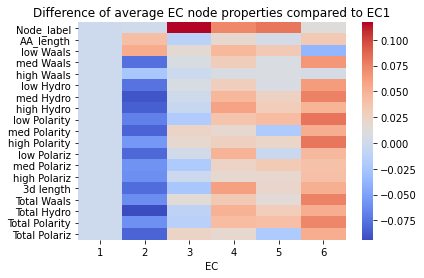

In [35]:
sns.heatmap(df_diff, cmap="coolwarm" )
plt.title("Difference of average EC node properties compared to EC1")

Text(0.5, 1.0, 'Correlation heatmap of EC classes')

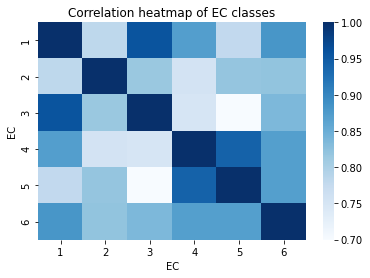

In [36]:
sns.heatmap(df_avg.corr(method='spearman'), cmap="Blues")
plt.title("Correlation heatmap of EC classes")

We can see that EC  5,6 are highly correlatate thus they probably share some similarities
Also EC 1,3 are highly correlated

In [37]:
df = df.drop(columns=["EC"])
df.head()

,Node_label,AA_length,low Waals,med Waals,high Waals,low Hydro,med Hydro,high Hydro,low Polarity,med Polarity,high Polarity,low Polariz,med Polariz,high Polariz,3d length,Total Waals,Total Hydro,Total Polarity,Total Polariz
0,0.392687,0.178778,0.373598,0.476537,0.246369,0.465153,0.535866,0.382577,0.493090,0.483840,0.465696,0.373655,0.325521,0.328355,0.386100,0.470035,0.349662,0.491158,0.483840
1,0.388747,0.270306,0.449869,0.598526,0.338841,0.582090,0.664630,0.387505,0.610663,0.671329,0.624303,0.398480,0.400449,0.424466,0.331263,0.657845,0.358696,0.595455,0.671329
2,0.268235,0.259682,0.414965,0.566819,0.221855,0.551772,0.655755,0.454369,0.602353,0.554965,0.588718,0.434951,0.373137,0.386169,0.396190,0.626087,0.450000,0.574156,0.554965
3,0.279412,0.239773,0.407637,0.553465,0.209877,0.537524,0.633252,0.422330,0.585219,0.540793,0.590812,0.401294,0.354244,0.370621,0.357143,0.623188,0.421875,0.554184,0.540793
4,0.242967,0.296393,0.452838,0.607712,0.225047,0.591053,0.705340,0.493879,0.635845,0.603223,0.632107,0.466019,0.400449,0.415033,0.422360,0.672968,0.489130,0.606906,0.603223


EC1


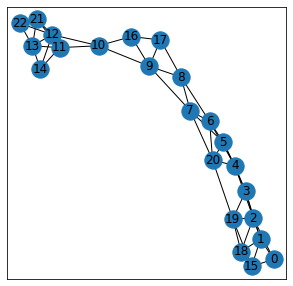

EC2


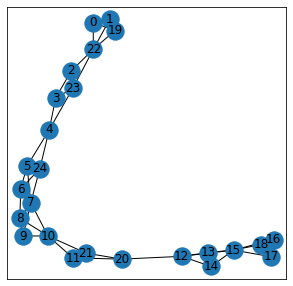

EC3


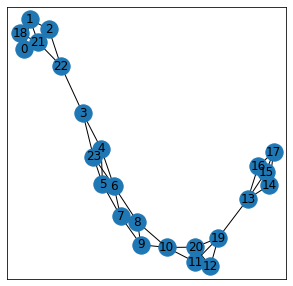

EC4


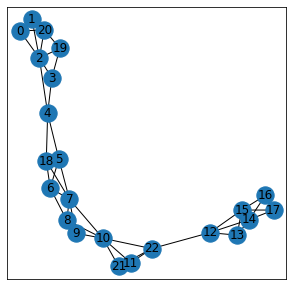

EC5


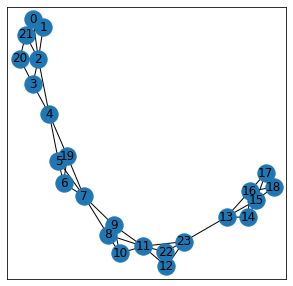

EC6


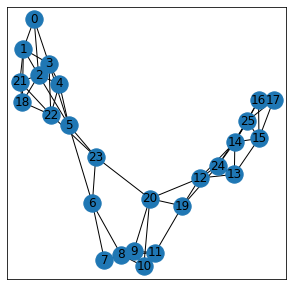

In [38]:
labels = ["EC1", "EC2", "EC3", "EC4", "EC5", "EC6"]

for label, ec in zip(labels, ec_classes):
    print(label)
    
    
    visualize(G_filtered[ec[10]])

There is no clear structural difference between the EC classes

## Additional: Quick analysis of Node attributes

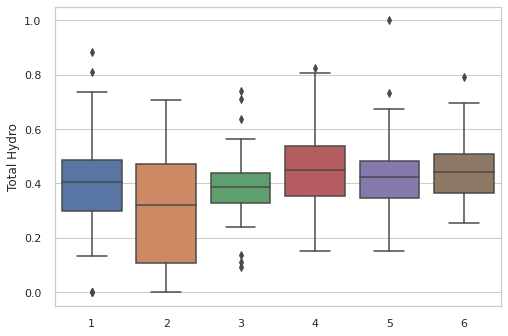

In [81]:
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=classes, y="Total Hydro", data=df)

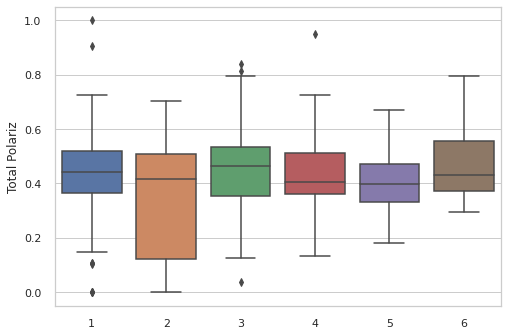

In [82]:
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=classes, y="Total Polariz", data=df)

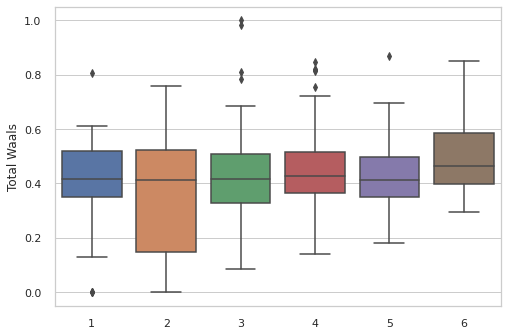

In [83]:
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=classes, y="Total Waals", data=df)

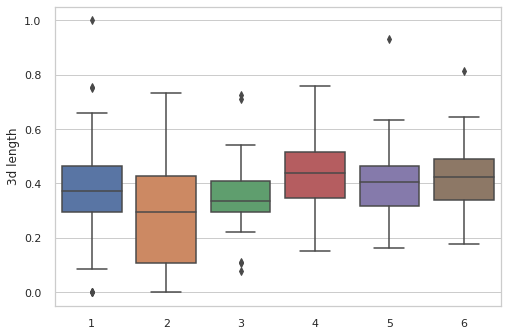

In [84]:
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=classes, y="3d length", data=df)

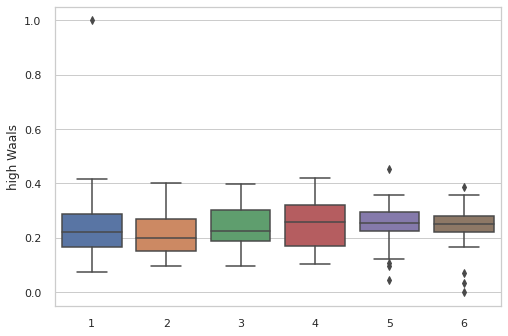

In [85]:
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=classes, y="high Waals", data=df)

## Dimensionality reduction based on Node attributes

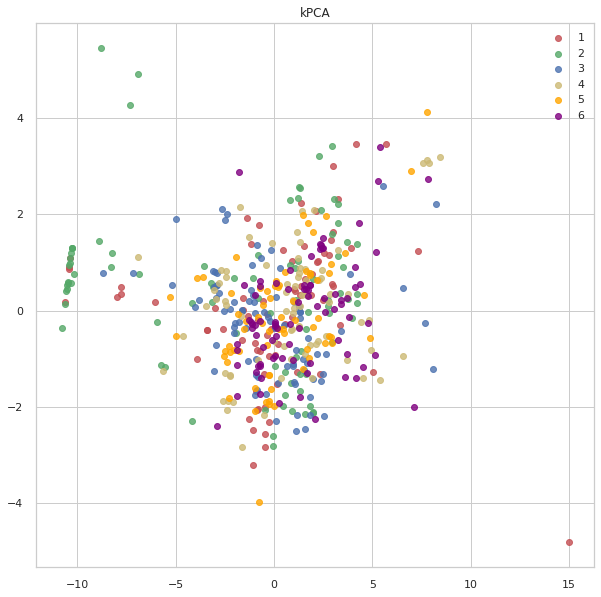

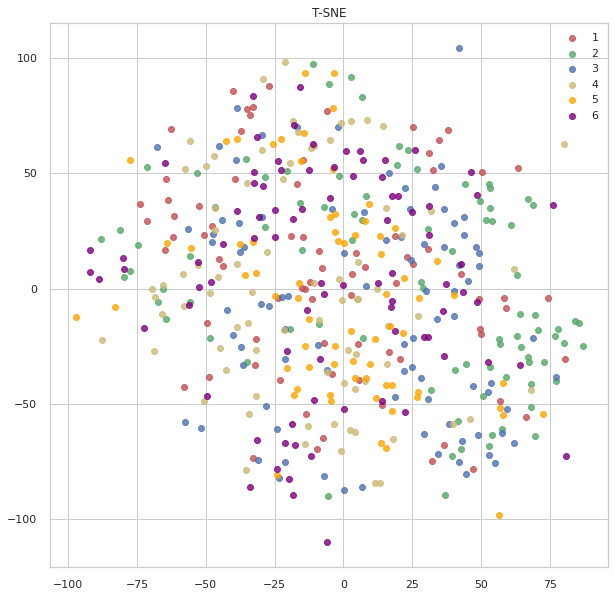

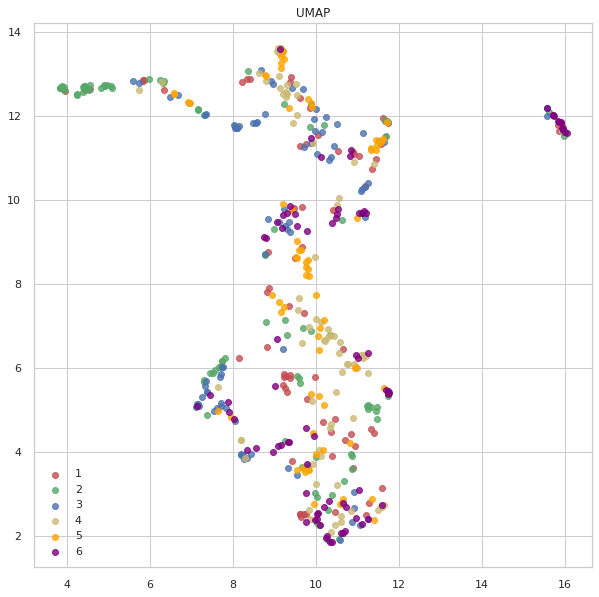

In [87]:
import umap
# Kernel PCA
kpca = PCA(n_components=18)
reduced_kpca= kpca.fit_transform(data_norm)
plot_dr(reduced_kpca, "kPCA",classes)

# T-SNE

pca = TSNE(n_components=3)
reduced_tsne =  pca.fit_transform(df.values)
plot_dr(reduced_tsne, "T-SNE",classes)

# UMAP
reducer = umap.UMAP()
embedding = reducer.fit_transform(df.values)
plot_dr(embedding, "UMAP",classes)

Here we can see that node attributes also have big importance in the EC classification.

# Support Vector machine prediction

In [88]:
#svm on all iterations 
for iterations in range(1,6,1):
    gram = load_csv(os.path.join(base_path,f"{dataset}_gram_matrix_wl{iterations}.csv"))
    gram = aux.normalize_gram_matrix(gram)
    gram = gram[indices_true[:, None], indices_true]
    
    # Split dataset into training set and test set
    X_train, X_test, y_train, y_test = train_test_split(gram, classes, test_size=0.2,random_state=109) # 70% training and 30% test
    clf = svm.SVC(kernel='poly') #Create a svm Classifier, 'poly' kernel is the best by far!
    clf.fit(X_train, y_train) #Train the model using the training sets
    y_pred = clf.predict(X_test) #Predict the response for test dataset
    print(f"Iteration{iterations} accuracy:",metrics.accuracy_score(y_test, y_pred)) # Model Accuracy: how often is the classifier correct?

Iteration1 accuracy: 0.4489795918367347
Iteration2 accuracy: 0.5612244897959183
Iteration3 accuracy: 0.5714285714285714
Iteration4 accuracy: 0.6224489795918368
Iteration5 accuracy: 0.6122448979591837


Best accuracy is reached on iterations 3-4, and significantly higher than what could result from randomness (~0.16).

In [89]:
#svm on all iterations without "preprocessing"
classes_real = dp.get_dataset(dataset)
for iterations in range(1,6,1):
    gram = load_csv(os.path.join(base_path,f"{dataset}_gram_matrix_wl{iterations}.csv"))
    gram = aux.normalize_gram_matrix(gram)
    
    # Split dataset into training set and test set
    X_train, X_test, y_train, y_test = train_test_split(gram, classes_real, test_size=0.2,random_state=109) # 70% training and 30% test
    clf = svm.SVC(kernel='poly') #Create a svm Classifier, 'poly' kernel is the best by far!
    clf.fit(X_train, y_train) #Train the model using the training sets
    y_pred = clf.predict(X_test) #Predict the response for test dataset
    print(f"Iteration{iterations} accuracy:",metrics.accuracy_score(y_test, y_pred)) # Model Accuracy: how often is the classifier correct?

Iteration1 accuracy: 0.4583333333333333
Iteration2 accuracy: 0.575
Iteration3 accuracy: 0.625
Iteration4 accuracy: 0.625
Iteration5 accuracy: 0.6083333333333333


The svm works a bit better on the unprocessed kernel for most iterations, except for iteration5, but the difference is small.

# Trying different kernels out

## Graphlet kernel
### Dim red

Load from  kernels\node_labels
##################################
Dataset  ENZYMES
##################################
(488, 488) (488, 3455)


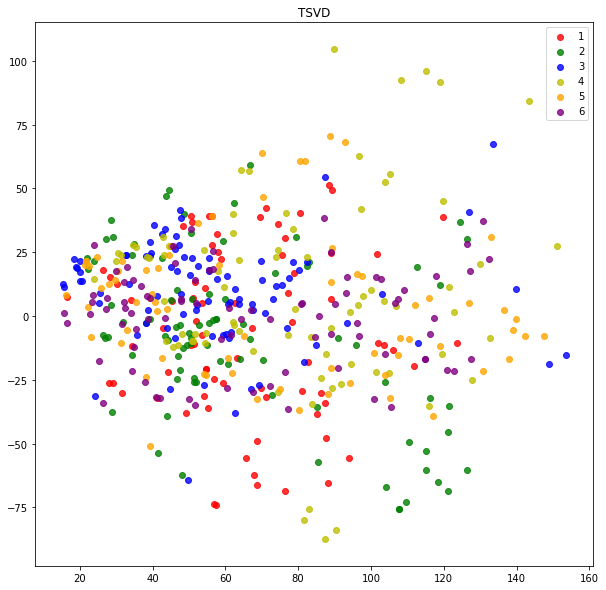

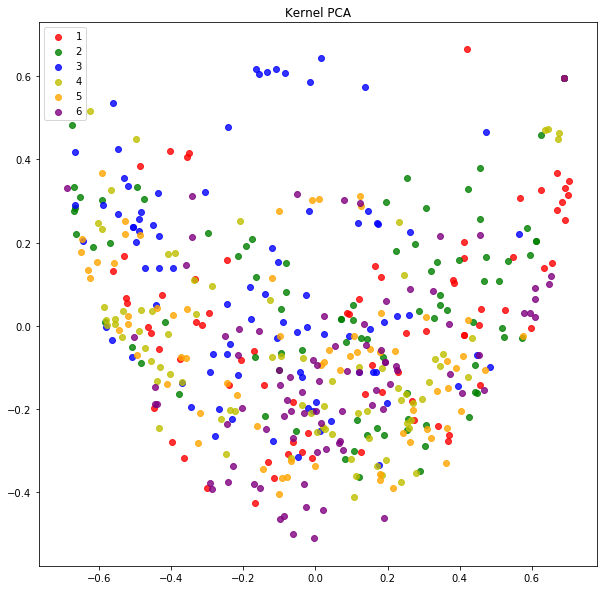

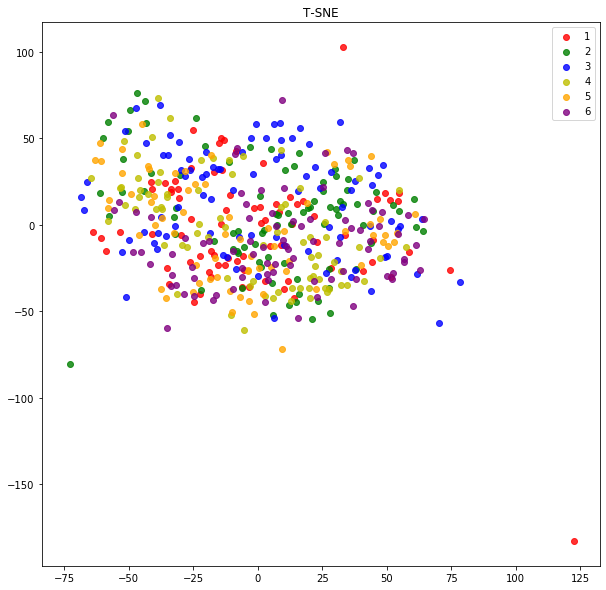

n_clusters:  6


In [37]:
use_edge_labels = False
for use_labels in [True]:
    if use_labels:
        base_path = os.path.join("kernels","node_labels")
        datasets = ["ENZYMES"]
    else:
        base_path = os.path.join("kernels","without_labels")
        datasets = ["ENZYMES"]
    print("Load from ", base_path)
    nmis_kpca = {}
    nmis_tsvd = {}
    nmis_tsne = {}
    nmis_spec = {}
    dataset= datasets[0]
    
    nmis_kpca[dataset] = []
    nmis_tsvd[dataset] = []
    nmis_tsne[dataset] = []
    nmis_spec[dataset] = []

    print("##################################")
    print("Dataset ", dataset)
    #print("Iteration ", iterations)
    print("##################################")

    #--------------------------------------------
    # Load graph representation from the kernel
    #--------------------------------------------
    #Gram Matrix for the Weisfeiler-Lehman subtree kernel
    gram = load_csv(os.path.join(base_path,f"{dataset}_gram_matrix_graphlet.csv"))
    #gram = load_csv(os.path.join(base_path,f"{dataset}_gram_matrix_shortestpath.csv"))
    gram = aux.normalize_gram_matrix(gram)
    gram = gram[indices_true[:, None], indices_true]

    #Sparse Vectors for the Weisfeiler-Lehmann subtree kernel
    vec = load_sparse(os.path.join(base_path,f"{dataset}_vectors_graphlet.npz"))
    vec = vec[indices_true, :]
    #vec = load_sparse(os.path.join(base_path,f"{dataset}_vectors_shortestpath.npz"))
    print(gram.shape, vec.shape)

    #--------------------------------------------
    # Dimensionality Reduction
    #--------------------------------------------

    # SVD
    tsvd = TruncatedSVD(n_components=50)
    reduced_tsvd = tsvd.fit_transform(vec)
    plot_dr(reduced_tsvd, "TSVD", classes)

    # Kernel PCA
    kpca = KernelPCA(n_components=50, kernel="precomputed")
    reduced_kpca= kpca.fit_transform(gram)
    plot_dr(reduced_kpca, "Kernel PCA",classes)

    # T-SNE
    pca = TSNE(n_components=3)
    reduced_tnse =  pca.fit_transform(gram)
    plot_dr(reduced_tnse, "T-SNE",classes)

    k = len(set(classes.tolist()))
    print("n_clusters: ", k)
    d = {0:"TSVD",1:"KPCA", 2:"T-SNE"}
    n_d = {0:nmis_tsvd, 1:nmis_kpca, 2:nmis_tsne}

### Clustering

Dimensionality reduction: kPCA


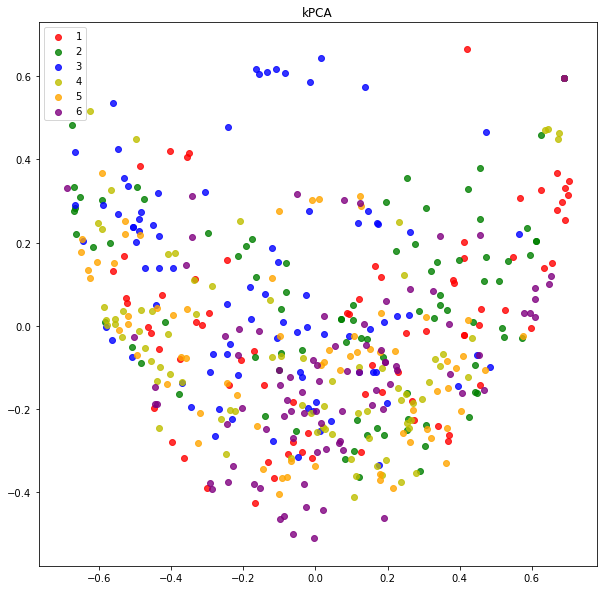

KMeans
488
488


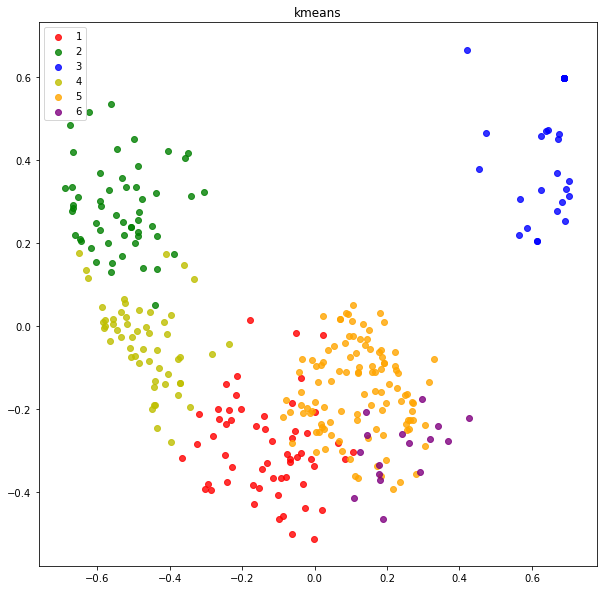

KMeans NMI:0.0828


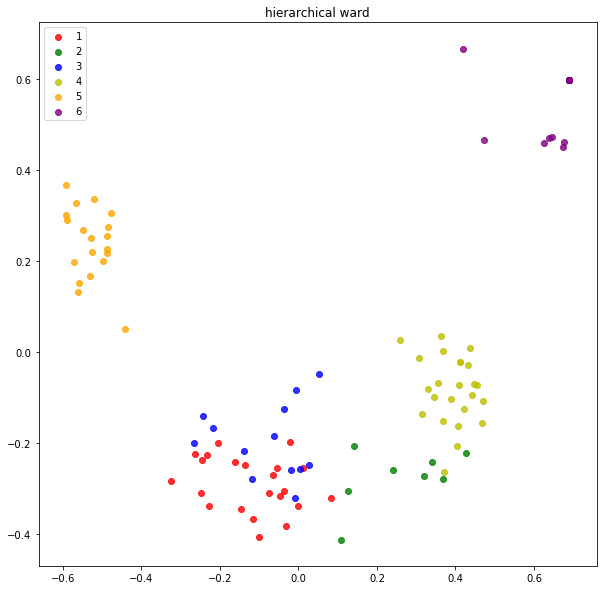

H clustering NMI:0.1710


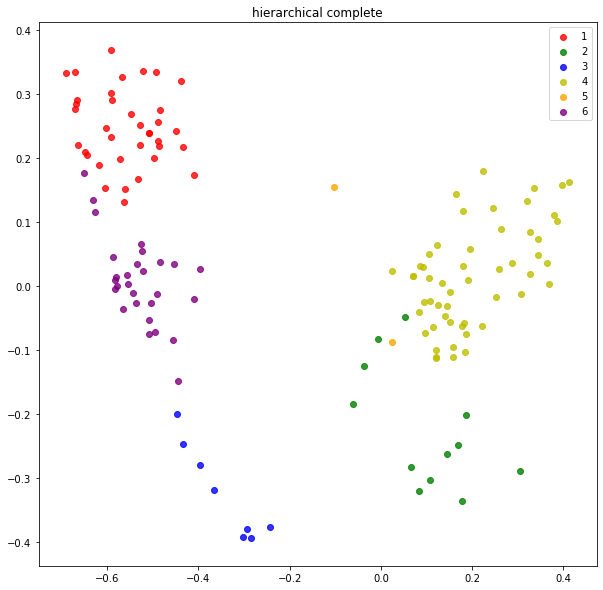

H clustering NMI:0.1576


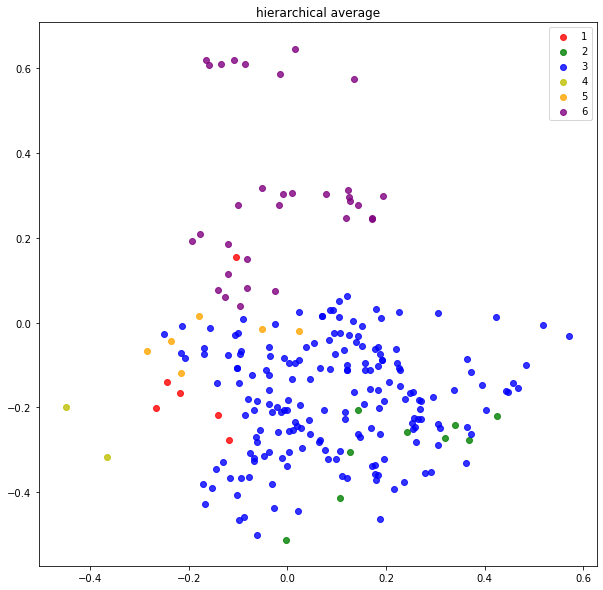

H clustering NMI:0.0887


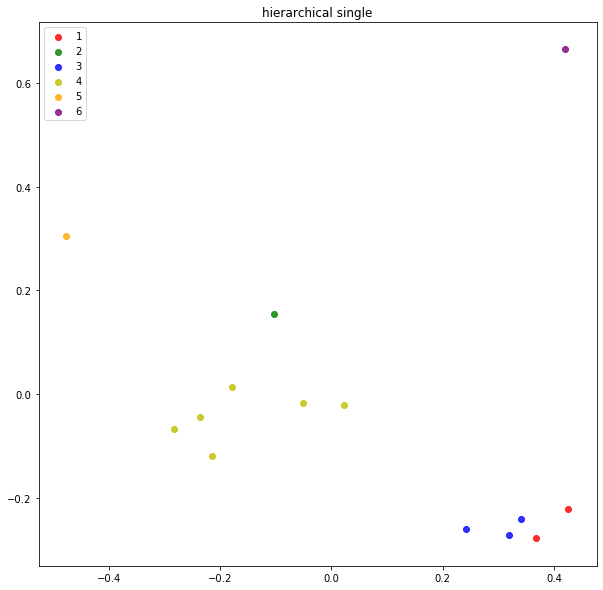

H clustering NMI:0.0551
SubKMeans
Found Cluster Subspaces:  [5, 45]
Subkmeans NMI:0.0717


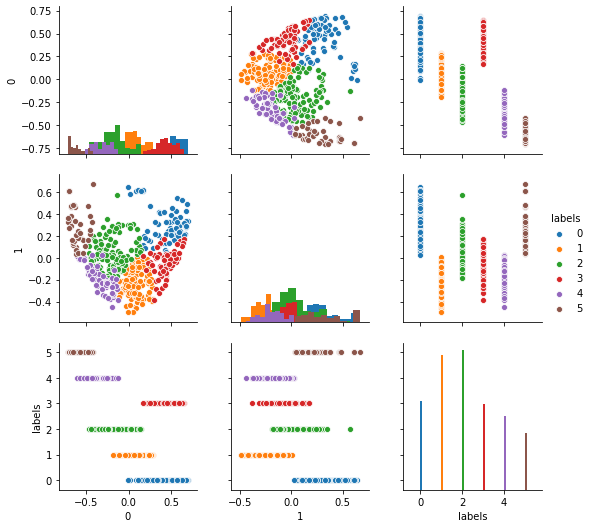

In [38]:
print("Dimensionality reduction: kPCA")
plot_dr(reduced_kpca, "kPCA",classes)
plt.show();

# KMeans
print("KMeans")
kmeans = KMeans(n_clusters=10 ,random_state=0).fit(reduced_kpca)
km_nmi = normalized_mutual_info_score(kmeans.labels_ , classes)
print(len(kmeans.labels_))
print(len(classes))
plot_dr(reduced_kpca, "kmeans",kmeans.labels_)
print(f"KMeans NMI:{km_nmi:.4f}")  

# Hierarchical clustering
clustering = AgglomerativeClustering(n_clusters=30, linkage="ward").fit(reduced_kpca)
hc_nmi = normalized_mutual_info_score(clustering.labels_ , classes)
plot_dr(reduced_kpca, "hierarchical ward",clustering.labels_)
print(f"H clustering NMI:{hc_nmi:.4f}")

clustering = AgglomerativeClustering(n_clusters=30, linkage="complete").fit(reduced_kpca)
hc_nmi = normalized_mutual_info_score(clustering.labels_ , classes)
plot_dr(reduced_kpca, "hierarchical complete",clustering.labels_)
print(f"H clustering NMI:{hc_nmi:.4f}")

clustering = AgglomerativeClustering(n_clusters=10, linkage="average").fit(reduced_kpca)
hc_nmi = normalized_mutual_info_score(clustering.labels_ , classes)
plot_dr(reduced_kpca, "hierarchical average",clustering.labels_)
print(f"H clustering NMI:{hc_nmi:.4f}")

clustering = AgglomerativeClustering(n_clusters=10, linkage="single").fit(reduced_kpca)
hc_nmi = normalized_mutual_info_score(clustering.labels_ , classes)
plot_dr(reduced_kpca, "hierarchical single",clustering.labels_)
print(f"H clustering NMI:{hc_nmi:.4f}")

# Apply Subkmeans
k = len(set(classes.tolist()))
print("SubKMeans")
nrkm = NrKmeans(n_clusters=[k,1])#, allow_larger_noise_space=False)
nrkm.fit(reduced_kpca, best_of_n_rounds=10, verbose=False)
print("Found Cluster Subspaces: ", nrkm.m)
subkm_nmi = normalized_mutual_info_score(nrkm.labels[0], classes)
print(f"Subkmeans NMI:{subkm_nmi:.4f}")    
#n_d[i][dataset].append(subkm_nmi)
# Plot rotated space
V = nrkm.V
rotated = np.dot(reduced_kpca,V)
reduced_df = pd.DataFrame(rotated[:,0:2])
reduced_df["labels"] = nrkm.labels[0] #classes[true_nodes]
sns.pairplot(reduced_df, hue="labels", diag_kind="hist", palette=("tab10"))
plt.show();

### SVM

In [39]:
    # Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(gram, classes, test_size=0.2,random_state=109) # 70% training and 30% test
clf = svm.SVC(kernel='poly') #Create a svm Classifier, 'poly' kernel is the best by far!
clf.fit(X_train, y_train) #Train the model using the training sets
y_pred = clf.predict(X_test) #Predict the response for test dataset
print("Graphlet accuracy:",metrics.accuracy_score(y_test, y_pred)) # Model Accuracy: how often is the classifier correct?

Graphlet accuracy: 0.32653061224489793


## Shortest path kernel
### Dim red

Load from  kernels\node_labels
##################################
Dataset  ENZYMES
##################################
(488, 488) (488, 25460)


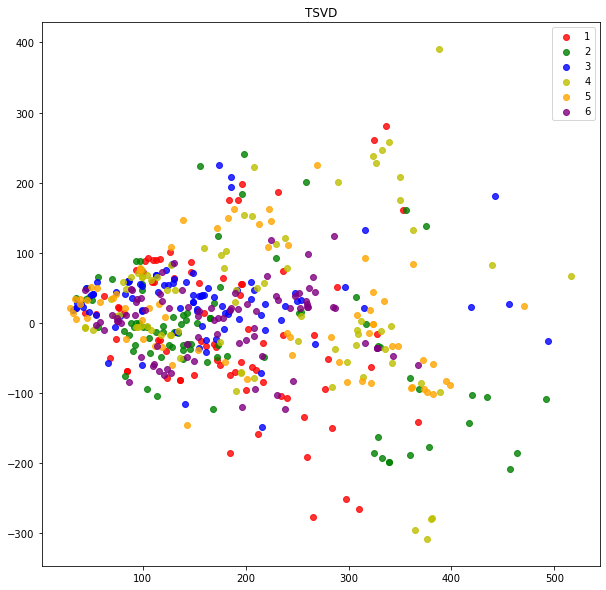

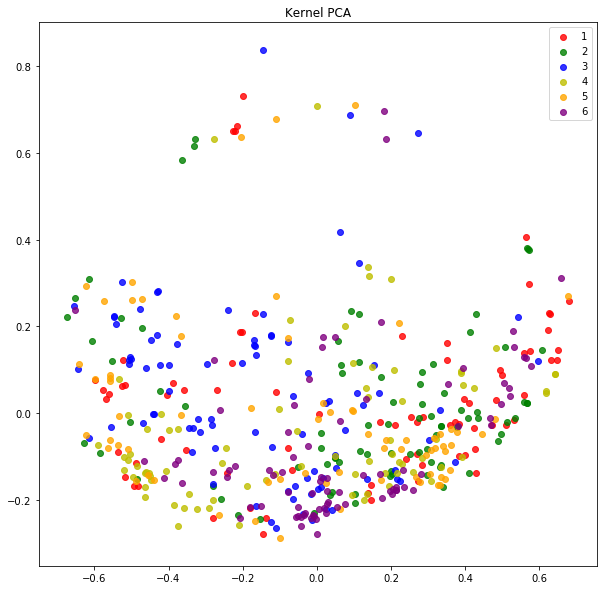

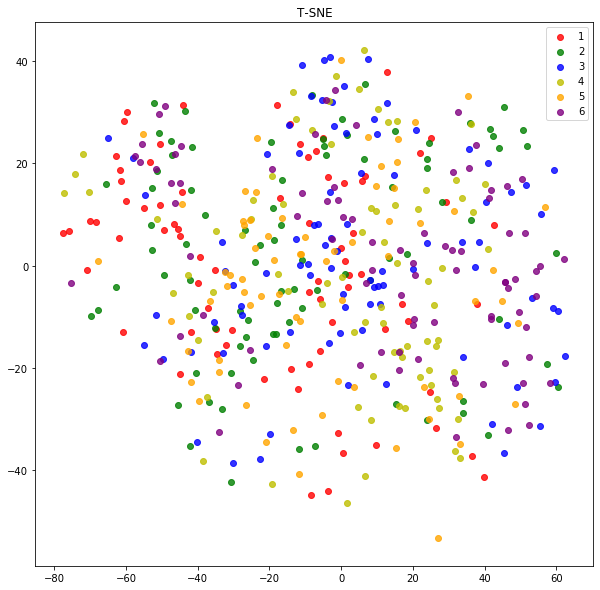

n_clusters:  6


In [40]:
use_edge_labels = False
for use_labels in [True]:
    if use_labels:
        base_path = os.path.join("kernels","node_labels")
        datasets = ["ENZYMES"]
    else:
        base_path = os.path.join("kernels","without_labels")
        datasets = ["ENZYMES"]
    print("Load from ", base_path)
    nmis_kpca = {}
    nmis_tsvd = {}
    nmis_tsne = {}
    nmis_spec = {}
    dataset= datasets[0]
    
    nmis_kpca[dataset] = []
    nmis_tsvd[dataset] = []
    nmis_tsne[dataset] = []
    nmis_spec[dataset] = []

    print("##################################")
    print("Dataset ", dataset)
    #print("Iteration ", iterations)
    print("##################################")

    #--------------------------------------------
    # Load graph representation from the kernel
    #--------------------------------------------
    #Gram Matrix for the Weisfeiler-Lehman subtree kernel
    gram = load_csv(os.path.join(base_path,f"{dataset}_gram_matrix_shortestpath.csv"))
    #gram = load_csv(os.path.join(base_path,f"{dataset}_gram_matrix_shortestpath.csv"))
    gram = aux.normalize_gram_matrix(gram)
    gram = gram[indices_true[:, None], indices_true]

    #Sparse Vectors for the Weisfeiler-Lehmann subtree kernel
    vec = load_sparse(os.path.join(base_path,f"{dataset}_vectors_shortestpath.npz"))
    #vec = load_sparse(os.path.join(base_path,f"{dataset}_vectors_shortestpath.npz"))
    vec = vec[indices_true, :]
    print(gram.shape, vec.shape)

    #--------------------------------------------
    # Dimensionality Reduction
    #--------------------------------------------

    # SVD
    tsvd = TruncatedSVD(n_components=50)
    reduced_tsvd = tsvd.fit_transform(vec)
    plot_dr(reduced_tsvd, "TSVD", classes)

    # Kernel PCA
    kpca = KernelPCA(n_components=50, kernel="precomputed")
    reduced_kpca= kpca.fit_transform(gram)
    plot_dr(reduced_kpca, "Kernel PCA",classes)

    # T-SNE
    pca = TSNE(n_components=3)
    reduced_tnse =  pca.fit_transform(gram)
    plot_dr(reduced_tnse, "T-SNE",classes)

    k = len(set(classes.tolist()))
    print("n_clusters: ", k)
    d = {0:"TSVD",1:"KPCA", 2:"T-SNE"}
    n_d = {0:nmis_tsvd, 1:nmis_kpca, 2:nmis_tsne}

### Clustering

Dimensionality reduction: kPCA


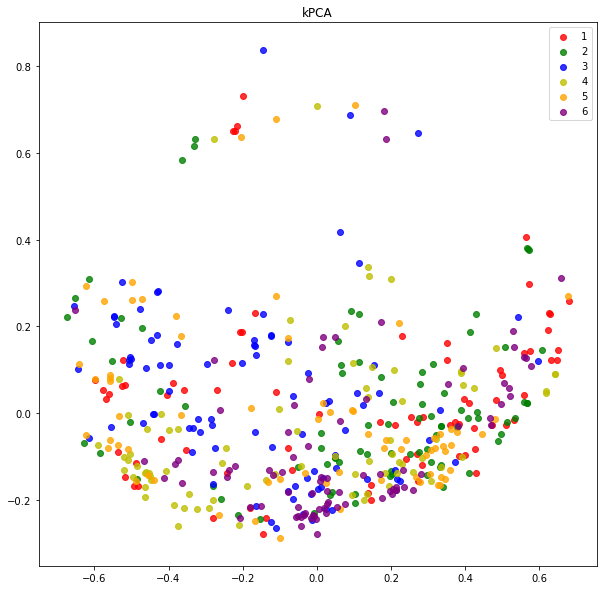

KMeans
488
488


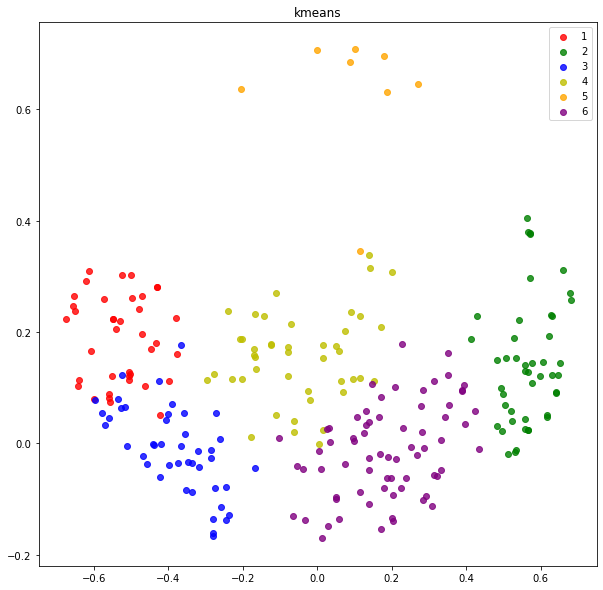

KMeans NMI:0.1091


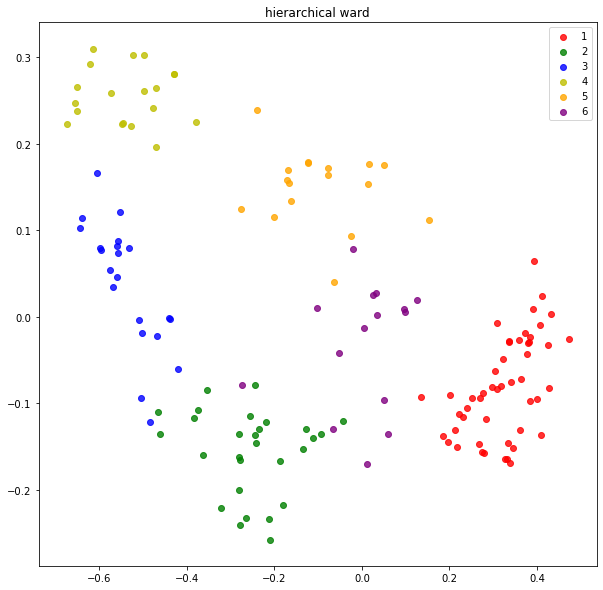

H clustering NMI:0.1866


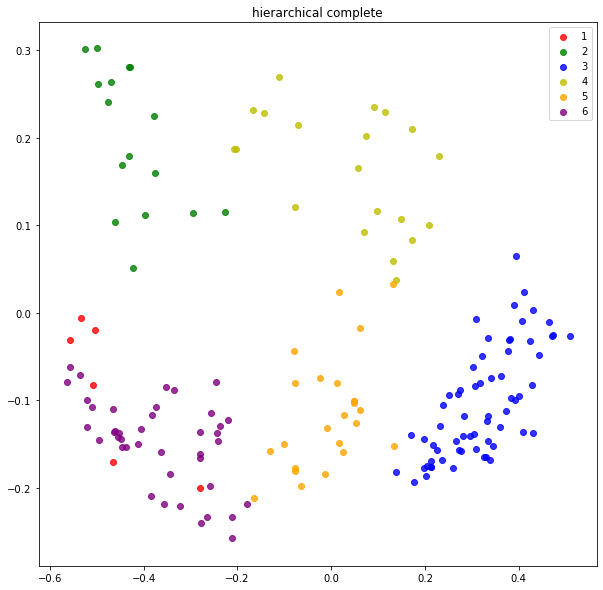

H clustering NMI:0.1601


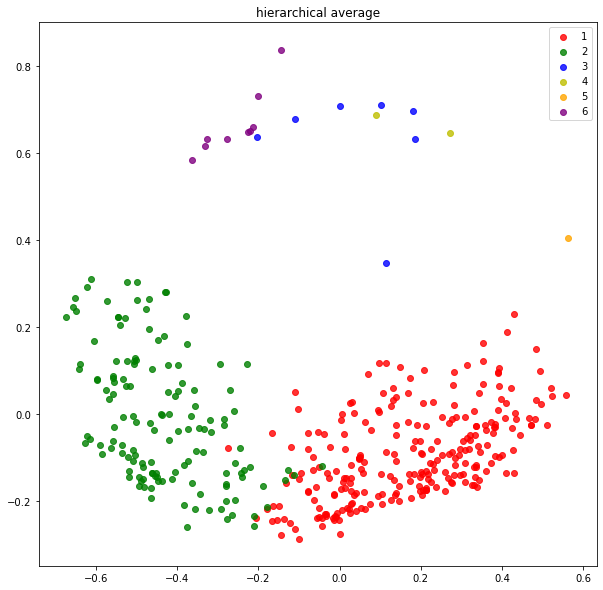

H clustering NMI:0.0602


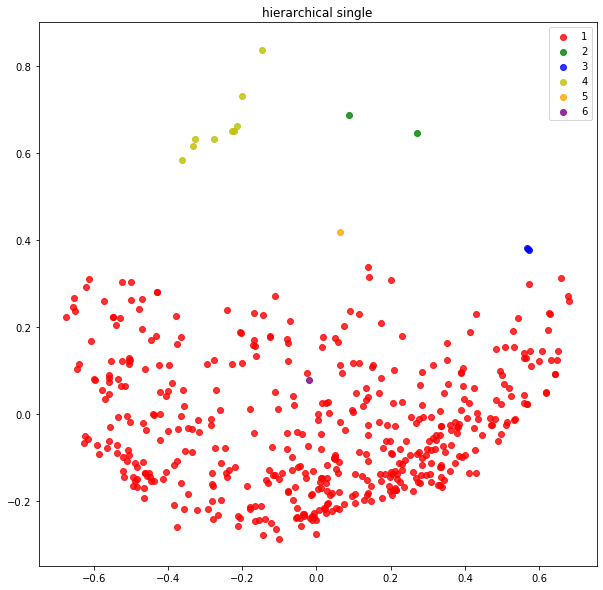

H clustering NMI:0.0508
SubKMeans
Found Cluster Subspaces:  [5, 45]
Subkmeans NMI:0.0754


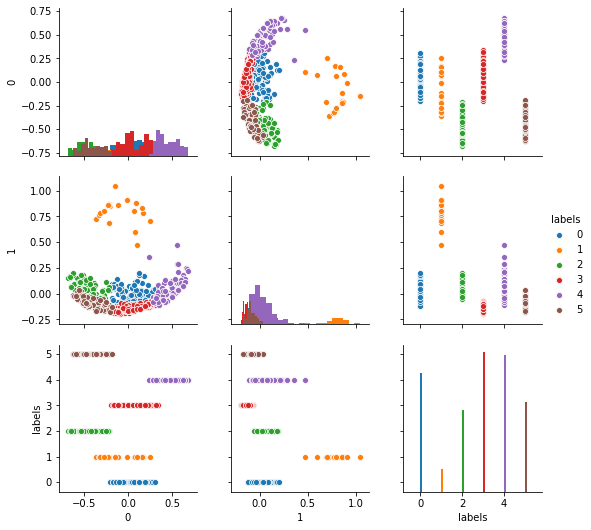

In [41]:
print("Dimensionality reduction: kPCA")
plot_dr(reduced_kpca, "kPCA",classes)
plt.show();

# KMeans
print("KMeans")
kmeans = KMeans(n_clusters=10 ,random_state=0).fit(reduced_kpca)
km_nmi = normalized_mutual_info_score(kmeans.labels_ , classes)
print(len(kmeans.labels_))
print(len(classes))
plot_dr(reduced_kpca, "kmeans",kmeans.labels_)
print(f"KMeans NMI:{km_nmi:.4f}")  

# Hierarchical clustering
clustering = AgglomerativeClustering(n_clusters=30, linkage="ward").fit(reduced_kpca)
hc_nmi = normalized_mutual_info_score(clustering.labels_ , classes)
plot_dr(reduced_kpca, "hierarchical ward",clustering.labels_)
print(f"H clustering NMI:{hc_nmi:.4f}")

clustering = AgglomerativeClustering(n_clusters=30, linkage="complete").fit(reduced_kpca)
hc_nmi = normalized_mutual_info_score(clustering.labels_ , classes)
plot_dr(reduced_kpca, "hierarchical complete",clustering.labels_)
print(f"H clustering NMI:{hc_nmi:.4f}")

clustering = AgglomerativeClustering(n_clusters=10, linkage="average").fit(reduced_kpca)
hc_nmi = normalized_mutual_info_score(clustering.labels_ , classes)
plot_dr(reduced_kpca, "hierarchical average",clustering.labels_)
print(f"H clustering NMI:{hc_nmi:.4f}")

clustering = AgglomerativeClustering(n_clusters=10, linkage="single").fit(reduced_kpca)
hc_nmi = normalized_mutual_info_score(clustering.labels_ , classes)
plot_dr(reduced_kpca, "hierarchical single",clustering.labels_)
print(f"H clustering NMI:{hc_nmi:.4f}")

# Apply Subkmeans
k = len(set(classes.tolist()))
print("SubKMeans")
nrkm = NrKmeans(n_clusters=[k,1])#, allow_larger_noise_space=False)
nrkm.fit(reduced_kpca, best_of_n_rounds=10, verbose=False)
print("Found Cluster Subspaces: ", nrkm.m)
subkm_nmi = normalized_mutual_info_score(nrkm.labels[0], classes)
print(f"Subkmeans NMI:{subkm_nmi:.4f}")    
#n_d[i][dataset].append(subkm_nmi)
# Plot rotated space
V = nrkm.V
rotated = np.dot(reduced_kpca,V)
reduced_df = pd.DataFrame(rotated[:,0:2])
reduced_df["labels"] = nrkm.labels[0] #classes[true_nodes]
sns.pairplot(reduced_df, hue="labels", diag_kind="hist", palette=("tab10"))
plt.show();

### SVM

In [42]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(gram, classes, test_size=0.2,random_state=109) # 70% training and 30% test
clf = svm.SVC(kernel='poly') #Create a svm Classifier, 'poly' kernel is the best by far!
clf.fit(X_train, y_train) #Train the model using the training sets
y_pred = clf.predict(X_test) #Predict the response for test dataset
print("Shortest path accuracy:",metrics.accuracy_score(y_test, y_pred)) # Model Accuracy: how often is the classifier correct?

Shortest path accuracy: 0.4897959183673469
